In [1]:
## Используем стандартные значения полос во всех функциях ниже
bands_freq = {"delta_min":1,"delta_max":3.5,
              "theta_min":4,"theta_max":6.5,
              "alpha_min":7,"alpha_max":13,
              "beta1_min":14,"beta1_max":20,
              "beta2_min":21,"beta2_max":30,
              "gamma_min":30,"gamma_max":48}


In [94]:
from scipy import linalg
import glob
import scipy
from scipy import fftpack
from scipy.signal import butter, lfilter, hilbert
import scipy.interpolate
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import gc
import sys
import os
import os.path, time
import csv

import mne
import mnelab
from mnelab.io import read_raw
from mne import setup_volume_source_space, setup_source_space
#from mne.viz import circular_layout, plot_connectivity_circle
from mne import io
#from mne.connectivity import spectral_connectivity
#from mne.viz import plot_sensors_connectivity
from mne.viz.backends.renderer import _get_renderer
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [3]:
def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='bandpass')
    new_signal = lfilter(b, a, data)
    return new_signal

def butter_bandstop_filter(data, lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='bandstop')
    new_signal = lfilter(b, a, data)
    return new_signal

def draw_signal(signal_array,end_point,step,label_):
    plt.figure(figsize=(15, 6))
    time_vec_temp = np.arange(0, end_point, step)
    plt.plot(time_vec_temp, signal_array, label=label_)
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.legend(loc='best')
    plt.show()
    plt.clf()
    
def draw_spectr(signal,_sample_rate,label_):
    # Делаем быстрое преобразование Фурье и необходимые преобразования
    sig_fft = fftpack.fft(signal)
    power = np.abs(sig_fft)
    sample_freq = fftpack.fftfreq(signal.size, d=1/_sample_rate)
    # Рисуем распределение частот
    plt.figure(figsize=(10, 8))
    plt.plot(abs(sample_freq), power, label=label_)
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Power')
    plt.legend(loc='best')
    plt.show()
    plt.clf()
    
def calculate_percents_per_chan(_signal,_max_chan,_number_levels,_downsampled_length):
    table_chans_absolute = np.empty((nchan,_number_levels),dtype=np.object)
    for chan in range(0,nchan):
        for i in range(0,_number_levels,1):
            table_chans_absolute[chan][i] = 0
    table_chans_percent = np.empty((nchan,_number_levels),dtype=np.object)
    step_for_comparison = _max_chan / _number_levels
    levels = []
    for a in range(0,_number_levels+1,1):
        levels.append(a*step_for_comparison)
    for chan in range(0,nchan):
        for i in range(0,_downsampled_length,1):
            for b in range(0,_number_levels,1):
                if (_signal[chan][i] >= levels[b]) and (_signal[chan][i] < levels[b+1]):
                    table_chans_absolute[chan][b] += 1
                    break
                if _signal[chan][i] >= _max_chan:
                    table_chans_absolute[chan][_number_levels-1] += 1
                    break
    for chan in range(0,nchan):
        for b in range(0,_number_levels,1):
            table_chans_percent[chan][b] = round(table_chans_absolute[chan][b] / _downsampled_length * 100,1)    
    return table_chans_percent
    
def augumenting_electrodes(downsampled_hilbert_signal, down_length):
    augumented_downsampled_hilbert_signal = np.empty((nchan_aug,down_length),dtype=np.object) 
    augumented_downsampled_hilbert_signal[0] = 0.15*0.25*downsampled_hilbert_signal[1]+0.25*downsampled_hilbert_signal[2] #ok
    augumented_downsampled_hilbert_signal[1] = 0.25*downsampled_hilbert_signal[2]+0.25*downsampled_hilbert_signal[3] #ok
    augumented_downsampled_hilbert_signal[2] = 0.15*0.25*downsampled_hilbert_signal[4]+0.25*downsampled_hilbert_signal[3] #ok
    augumented_downsampled_hilbert_signal[3] = downsampled_hilbert_signal[2] #ok
    augumented_downsampled_hilbert_signal[4] = downsampled_hilbert_signal[3] #ok
    augumented_downsampled_hilbert_signal[5] = 0.5*downsampled_hilbert_signal[2] #ok
    augumented_downsampled_hilbert_signal[6] = 0.5*downsampled_hilbert_signal[3] #ok
    augumented_downsampled_hilbert_signal[7] = 0.25*downsampled_hilbert_signal[1] #ok
    augumented_downsampled_hilbert_signal[8] = downsampled_hilbert_signal[1] #ok
    augumented_downsampled_hilbert_signal[9] = 0.5*downsampled_hilbert_signal[1] #ok
    augumented_downsampled_hilbert_signal[10] = 0.5*downsampled_hilbert_signal[4] #ok
    augumented_downsampled_hilbert_signal[11] = downsampled_hilbert_signal[4] #ok
    augumented_downsampled_hilbert_signal[12] = 0.25*downsampled_hilbert_signal[4] #ok
    augumented_downsampled_hilbert_signal[13] = 0.5*downsampled_hilbert_signal[0] #ok
    augumented_downsampled_hilbert_signal[14] = 0.5*downsampled_hilbert_signal[5] #ok
    augumented_downsampled_hilbert_signal[15] = downsampled_hilbert_signal[0] #ok
    augumented_downsampled_hilbert_signal[16] = downsampled_hilbert_signal[5] #ok
    augumented_downsampled_hilbert_signal[17] = 0.15*0.25*downsampled_hilbert_signal[1]+0.25*downsampled_hilbert_signal[0] #ok
    augumented_downsampled_hilbert_signal[18] = 0.25*downsampled_hilbert_signal[0]+0.25*downsampled_hilbert_signal[5] #ok
    augumented_downsampled_hilbert_signal[19] = 0.15*0.25*downsampled_hilbert_signal[4]+0.25*downsampled_hilbert_signal[5] #ok
    return augumented_downsampled_hilbert_signal

def weightedhead_chans(_table_percent,_number_levels):
    _weightedhead_chans = np.empty((nchan,1),dtype=np.object)
    for chan in range(0,nchan):
        temp_sum = 0
        for i in range(0,_number_levels,1):
            temp_sum += _table_percent[chan][i] / 100 * (i+1)
        _weightedhead_chans[chan] = temp_sum
    return _weightedhead_chans

In [4]:
# функция очистки сигнала по максимальной амплитуде - удаляем кусочки длиной _part_length, которые выше _threshhold
def clearing_signal(_signal,_part_length,_sample_rate,_threshhold,_nchan):
    _num_parts = int(len(_signal[0,:])/_sample_rate/_part_length)
    temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
    temp_bad_parts = []
    for j in range(0,_nchan):
        for i in range(0,_num_parts):
            temp_cleared_signal[j,i] = _signal[j,int(i*_sample_rate*_part_length):int((i+1)*_sample_rate*_part_length)]
            if np.max(abs(_signal[j,int(i*_sample_rate*_part_length):int((i+1)*_sample_rate*_part_length)])) > _threshhold:
                if i not in temp_bad_parts:
                    temp_bad_parts.append(i)
    
    cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
    for i in range(0,_nchan):
        cleared_signal[i] = np.delete(temp_cleared_signal[i],temp_bad_parts)
    
    cleared_signal_noparts = np.empty((_nchan),dtype=np.object)
    for i in range(0,_nchan):
        temp_signal = []
        for j in range(0,_num_parts-len(temp_bad_parts)):
            for k in range(0,len(cleared_signal[i][j])):
                temp_signal.append(cleared_signal[i][j][k])
        cleared_signal_noparts[i] = temp_signal
    
    temp_matrix_return = np.zeros((_nchan,len(cleared_signal_noparts[0])))
    for i in range(0,_nchan):
        for j in range(0,len(cleared_signal_noparts[0])):
            temp_matrix_return[i,j] = cleared_signal_noparts[i][j]
    
    return temp_matrix_return

In [5]:
def create_percent_table(_signal,_sample_rate,_length,_downsampled_coeff,_max_chan,_number_levels):
    # Создаем сигналы по выбранным наборам частот
    delta_signal = np.empty((nchan,_length),dtype=np.object)
    theta_signal = np.empty((nchan,_length),dtype=np.object)
    alpha_signal = np.empty((nchan,_length),dtype=np.object)
    beta1_signal = np.empty((nchan,_length),dtype=np.object)
    beta2_signal = np.empty((nchan,_length),dtype=np.object)
    gamma_signal = np.empty((nchan,_length),dtype=np.object)
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["delta_min"],bands_freq["delta_max"],_sample_rate,4)
        theta_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["theta_min"],bands_freq["theta_max"],_sample_rate,5)
        alpha_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],_sample_rate,5)
        beta1_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],_sample_rate,6)
        beta2_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],_sample_rate,8)
        gamma_signal[chan] = butter_bandpass_filter(_signal[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],_sample_rate,9)    
    print("Signal bands created")
    
    # работаем с огибающей
    hilbert_delta_signal = np.empty((nchan,_length),dtype=np.object)
    hilbert_theta_signal = np.empty((nchan,_length),dtype=np.object)
    hilbert_alpha_signal = np.empty((nchan,_length),dtype=np.object)
    hilbert_beta1_signal = np.empty((nchan,_length),dtype=np.object)
    hilbert_beta2_signal = np.empty((nchan,_length),dtype=np.object)
    hilbert_gamma_signal = np.empty((nchan,_length),dtype=np.object)
    for chan in range(0,nchan):
        hilbert_delta_signal[chan] = np.abs(hilbert(delta_signal[chan]))
        hilbert_theta_signal[chan] = np.abs(hilbert(theta_signal[chan]))
        hilbert_alpha_signal[chan] = np.abs(hilbert(alpha_signal[chan]))
        hilbert_beta1_signal[chan] = np.abs(hilbert(beta1_signal[chan]))
        hilbert_beta2_signal[chan] = np.abs(hilbert(beta2_signal[chan]))
        hilbert_gamma_signal[chan] = np.abs(hilbert(gamma_signal[chan]))
        print("Hilbert Channel " + str(chan) + " completed")
    print("Hilbert completed")
    
    # уменьшаем размерность сигнала для рисования
    downsampled_length = int(round(_length/_downsampled_coeff,0))
    downsampled_hilbert_delta_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    downsampled_hilbert_theta_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    downsampled_hilbert_alpha_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    downsampled_hilbert_beta1_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    downsampled_hilbert_beta2_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    downsampled_hilbert_gamma_signal = np.empty((nchan,downsampled_length),dtype=np.object)
    for chan in range(0,nchan):
        counter_downsampled = 0
        for i in range(0,_length,_downsampled_coeff):
            temp_sum_delta = 0
            temp_sum_theta = 0
            temp_sum_alpha = 0
            temp_sum_beta1 = 0
            temp_sum_beta2 = 0
            temp_sum_gamma = 0
            for j in range(0,_downsampled_coeff,1):
                temp_sum_delta += hilbert_delta_signal[chan][i+j]
                temp_sum_theta += hilbert_theta_signal[chan][i+j]
                temp_sum_alpha += hilbert_alpha_signal[chan][i+j]
                temp_sum_beta1 += hilbert_beta1_signal[chan][i+j]
                temp_sum_beta2 += hilbert_beta2_signal[chan][i+j]
                temp_sum_gamma += hilbert_gamma_signal[chan][i+j]
            downsampled_hilbert_delta_signal[chan][counter_downsampled] = temp_sum_delta/_downsampled_coeff
            downsampled_hilbert_theta_signal[chan][counter_downsampled] = temp_sum_theta/_downsampled_coeff
            downsampled_hilbert_alpha_signal[chan][counter_downsampled] = temp_sum_alpha/_downsampled_coeff
            downsampled_hilbert_beta1_signal[chan][counter_downsampled] = temp_sum_beta1/_downsampled_coeff
            downsampled_hilbert_beta2_signal[chan][counter_downsampled] = temp_sum_beta2/_downsampled_coeff
            downsampled_hilbert_gamma_signal[chan][counter_downsampled] = temp_sum_gamma/_downsampled_coeff
            counter_downsampled += 1
    print("Downsampled completed")
    
    # считаем процентные распределения по уровням
    table_chans_percent_delta = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_theta = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_alpha = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_beta1 = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_beta2 = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_gamma = np.empty((nchan,_number_levels),dtype=np.object)
    table_chans_percent_delta = calculate_percents_per_chan(downsampled_hilbert_delta_signal,_max_chan,_number_levels,downsampled_length)
    table_chans_percent_theta = calculate_percents_per_chan(downsampled_hilbert_theta_signal,_max_chan,_number_levels,downsampled_length)
    table_chans_percent_alpha = calculate_percents_per_chan(downsampled_hilbert_alpha_signal,_max_chan,_number_levels,downsampled_length)
    table_chans_percent_beta1 = calculate_percents_per_chan(downsampled_hilbert_beta1_signal,_max_chan,_number_levels,downsampled_length)
    table_chans_percent_beta2 = calculate_percents_per_chan(downsampled_hilbert_beta2_signal,_max_chan,_number_levels,downsampled_length)
    table_chans_percent_gamma = calculate_percents_per_chan(downsampled_hilbert_gamma_signal,_max_chan,_number_levels,downsampled_length)
    print("Percentage distribution completed")
    
    all_bands_tables_percentage = np.empty((6,nchan,_number_levels),dtype=np.object)
    all_bands_tables_percentage[0][:][:] = table_chans_percent_delta
    all_bands_tables_percentage[1][:][:] = table_chans_percent_theta
    all_bands_tables_percentage[2][:][:] = table_chans_percent_alpha
    all_bands_tables_percentage[3][:][:] = table_chans_percent_beta1
    all_bands_tables_percentage[4][:][:] = table_chans_percent_beta2
    all_bands_tables_percentage[5][:][:] = table_chans_percent_gamma
    print("All bands processing completed")
    
    return all_bands_tables_percentage

In [6]:
import glob
all_files_csv = glob.glob('C:\\Users\\Lisa\\Desktop\\neuroscience\\' + '/*.edf') # следущий код просто открывает все csv файлы в директории
list_edf = []
for filename in all_files_csv:
    raw_mne1 = mne.io.read_raw_edf(filename, preload=True)
    print(raw_mne1.n_times)
    print(raw_mne1.ch_names)
    print(raw_mne1.info)
    print(raw_mne1.info['sfreq'])
    print(raw_mne1.get_data().shape)
    list_edf.append(raw_mne1)

Extracting EDF parameters from C:\Users\Lisa\Desktop\neuroscience\1Vlad.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8874  =      0.000 ...    70.992 secs...
8875
['O1', 'T3', 'F3', 'F4', 'T4', 'O2']
<Info | 7 non-empty values
 bads: []
 ch_names: O1, T3, F3, F4, T4, O2
 chs: 6 EEG
 custom_ref_applied: False
 highpass: 2.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2022-04-13 19:16:14 UTC
 nchan: 6
 projs: []
 sfreq: 125.0 Hz
>
125.0
(6, 8875)
Extracting EDF parameters from C:\Users\Lisa\Desktop\neuroscience\2Vlad.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7874  =      0.000 ...    62.992 secs...
7875
['O1', 'T3', 'F3', 'F4', 'T4', 'O2']
<Info | 7 non-empty values
 bads: []
 ch_names: O1, T3, F3, F4, T4, O2
 chs: 6 EEG
 custom_ref_applied: False
 highpass: 2.0 Hz
 lowpass: 40.0 Hz
 meas_date: 2022-04-13 19:17:40 UTC
 nchan: 6
 projs: []
 sfreq: 125.0 Hz
>
125.0
(6, 7875)
Extrac

In [7]:
list_edf

[<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>,
 <RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>,
 <RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>,
 <RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>,
 <RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>,
 <RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>,
 <RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>,
 <RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>]

## Begining of data analysis

In [8]:
nchan = 6
for raw_mne1 in list_edf:
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record1 = raw_mne1.get_data()
    length1 = len(file_with_record1[nchan-1])
    print(length1)
    

8875
7875
15875
15125
8625
12250
15000
15125


<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>


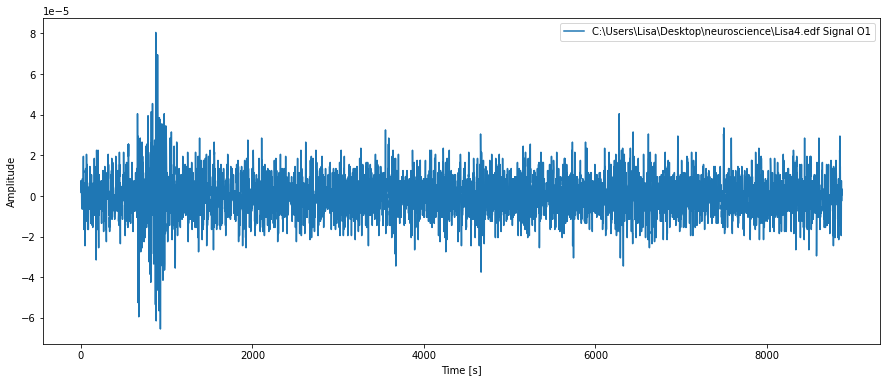

<Figure size 432x288 with 0 Axes>

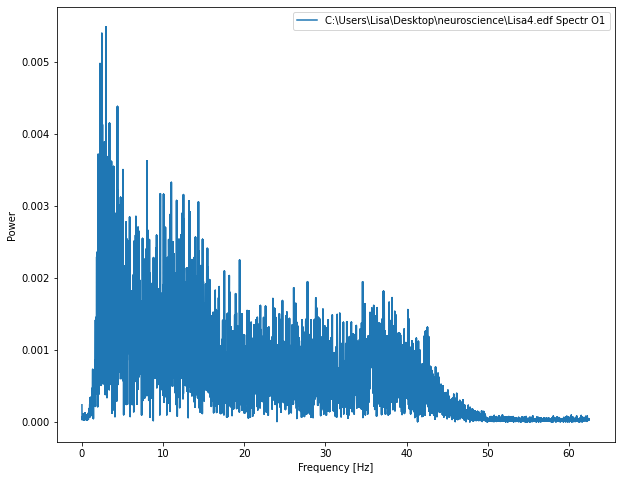

<Figure size 432x288 with 0 Axes>

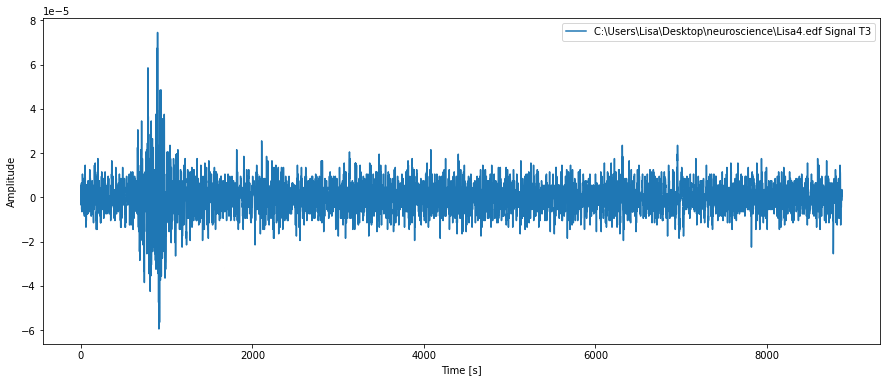

<Figure size 432x288 with 0 Axes>

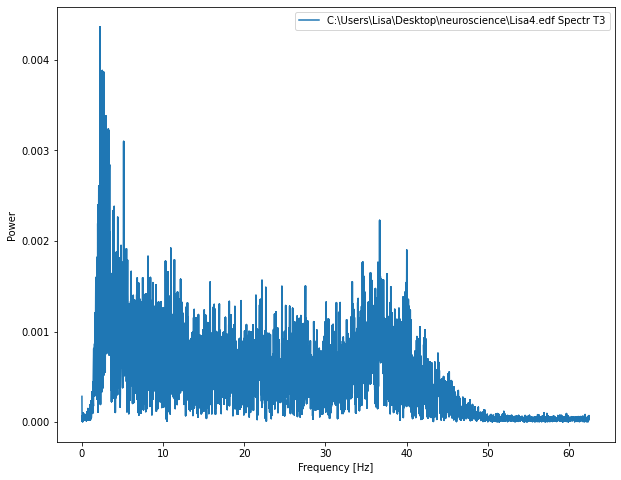

<Figure size 432x288 with 0 Axes>

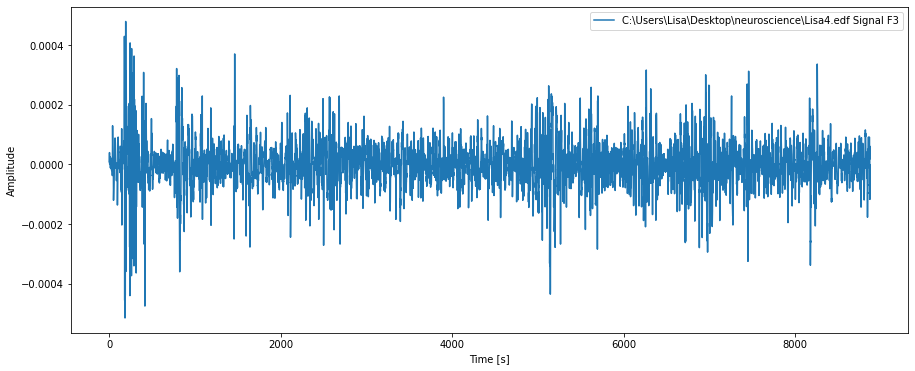

<Figure size 432x288 with 0 Axes>

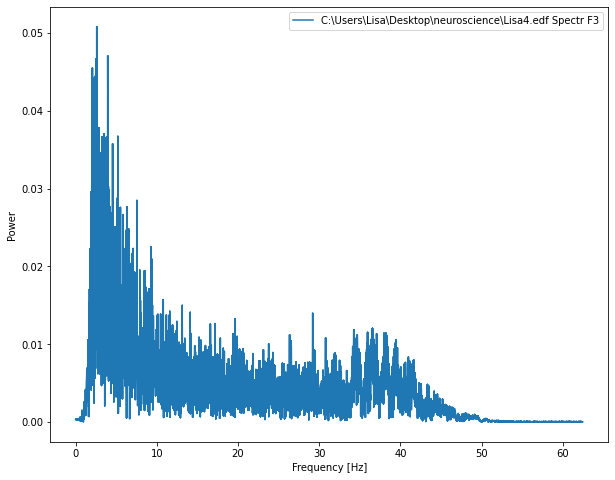

<Figure size 432x288 with 0 Axes>

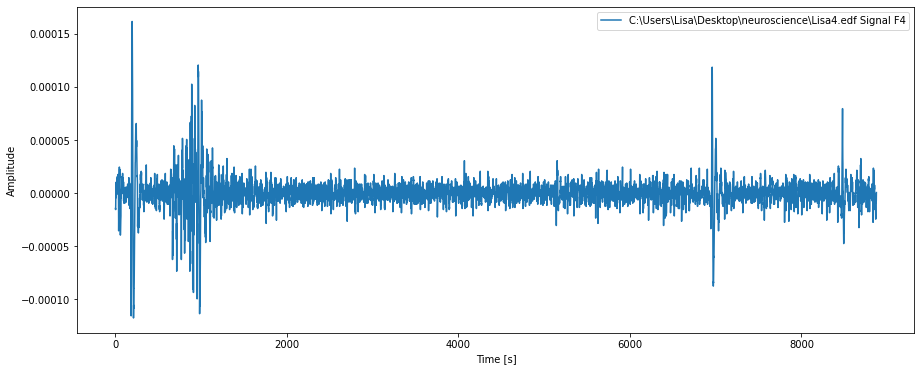

<Figure size 432x288 with 0 Axes>

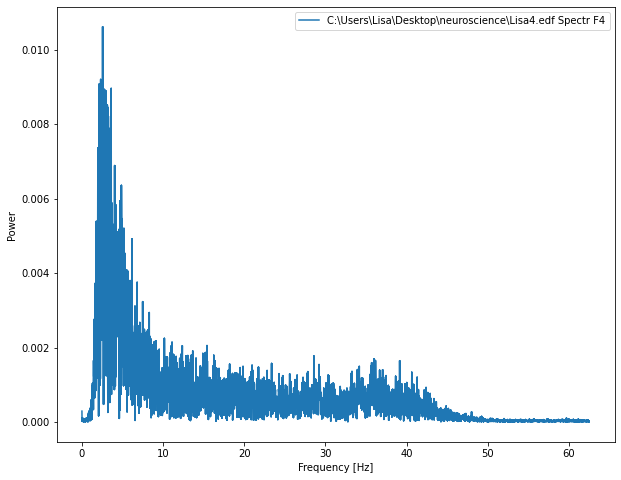

<Figure size 432x288 with 0 Axes>

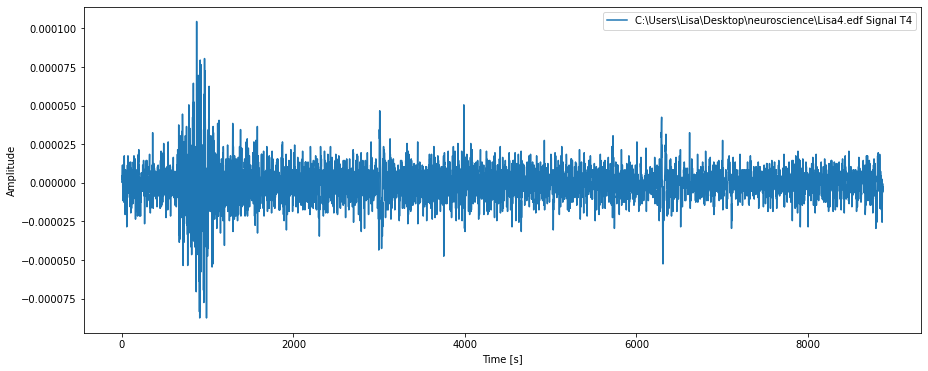

<Figure size 432x288 with 0 Axes>

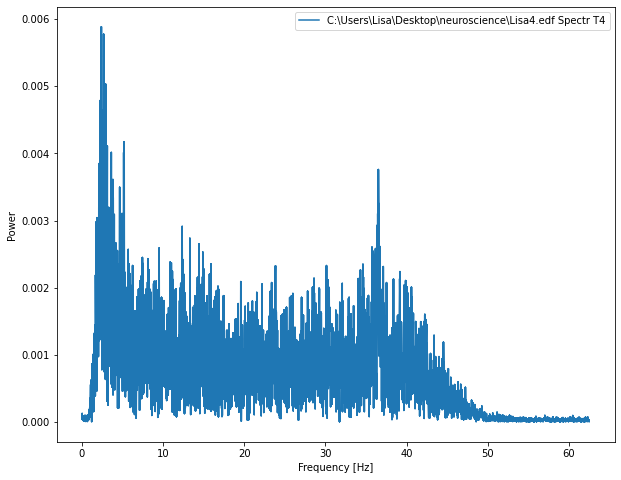

<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>


<Figure size 432x288 with 0 Axes>

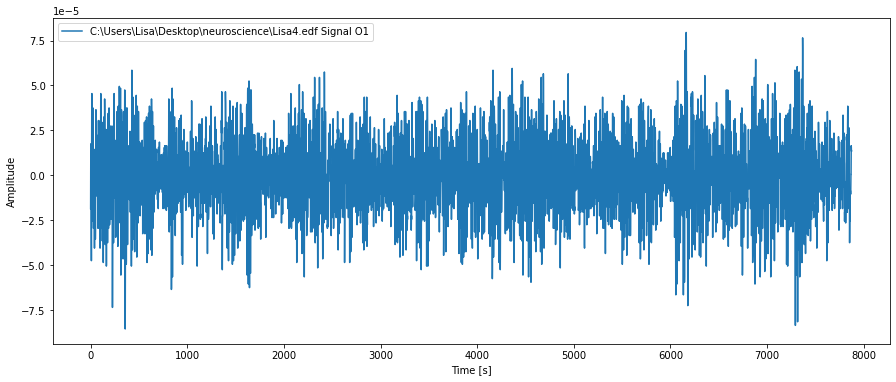

<Figure size 432x288 with 0 Axes>

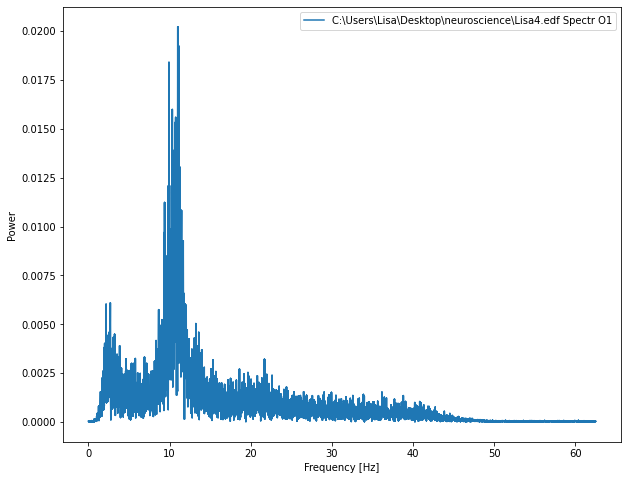

<Figure size 432x288 with 0 Axes>

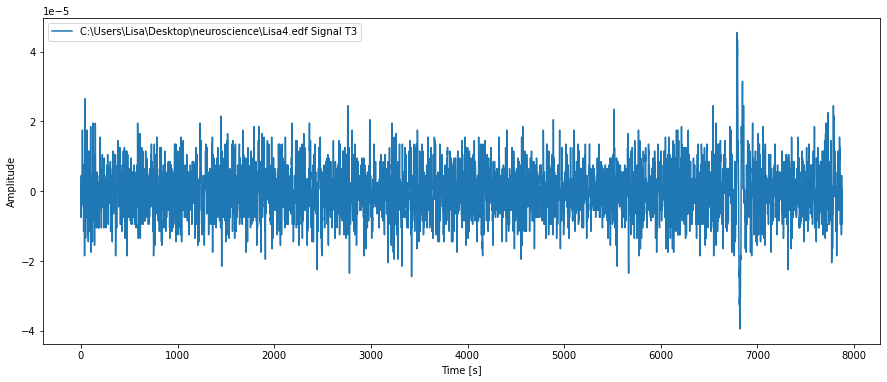

<Figure size 432x288 with 0 Axes>

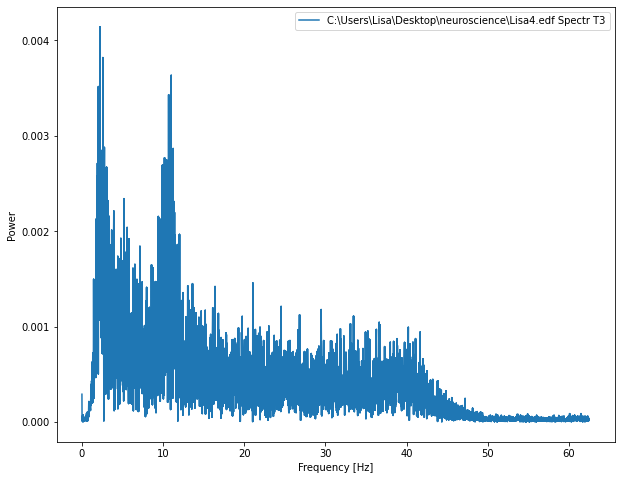

<Figure size 432x288 with 0 Axes>

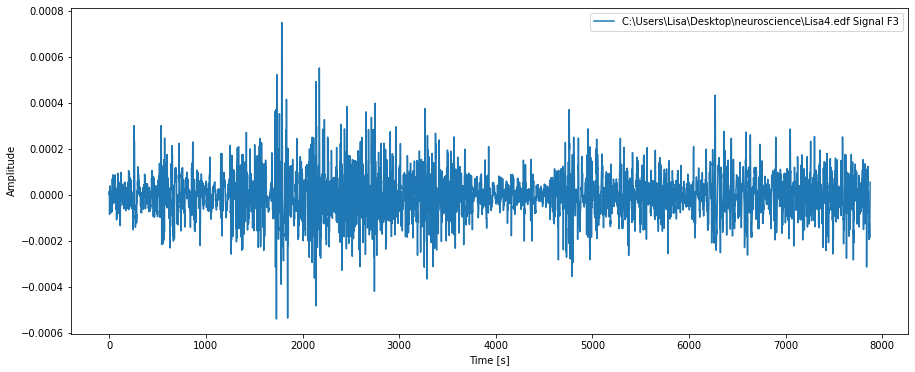

<Figure size 432x288 with 0 Axes>

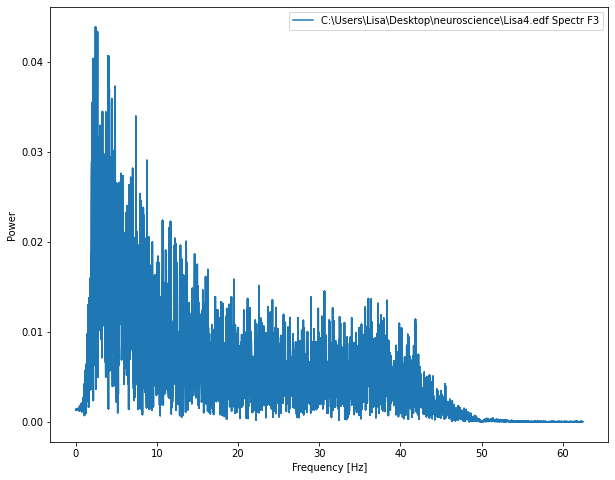

<Figure size 432x288 with 0 Axes>

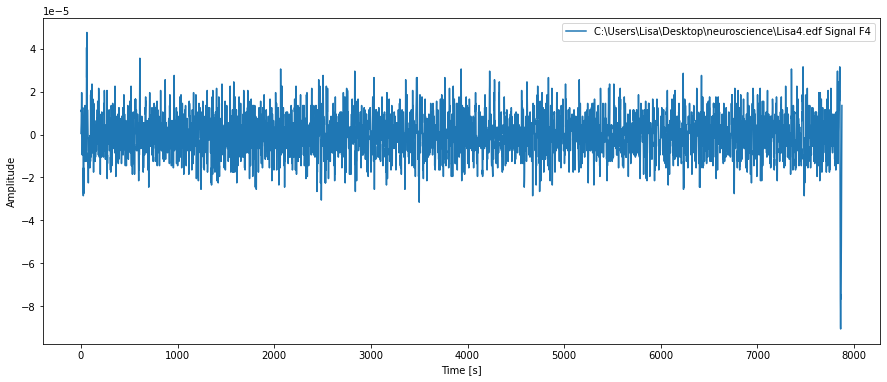

<Figure size 432x288 with 0 Axes>

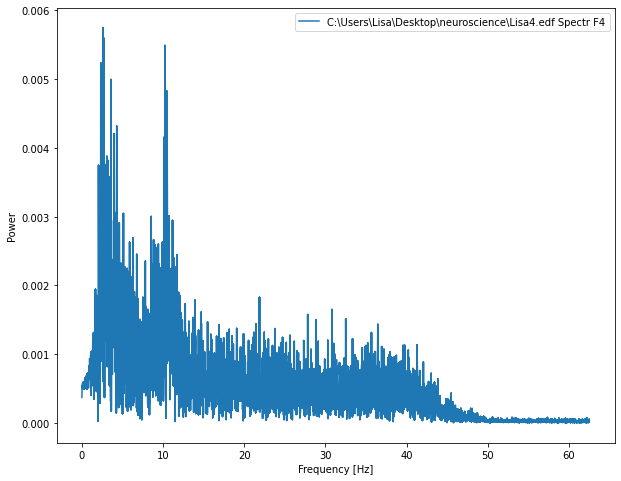

<Figure size 432x288 with 0 Axes>

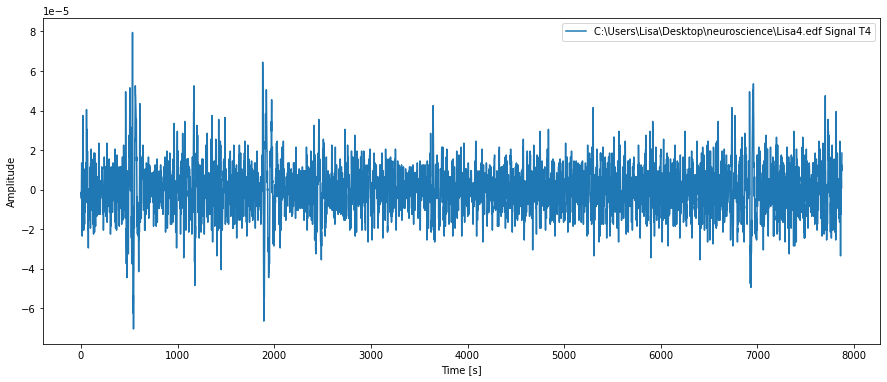

<Figure size 432x288 with 0 Axes>

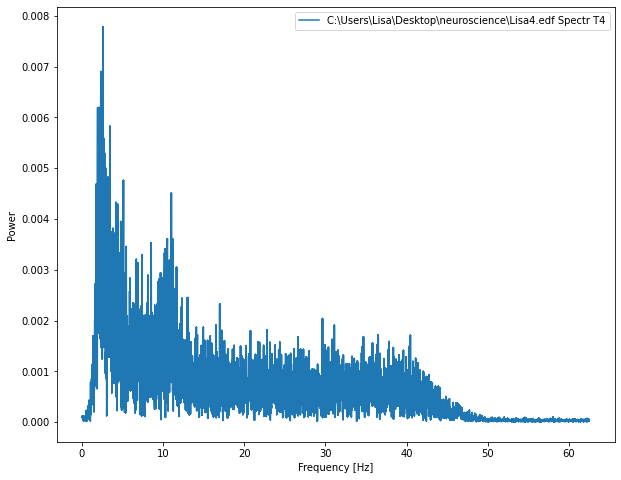

<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>


<Figure size 432x288 with 0 Axes>

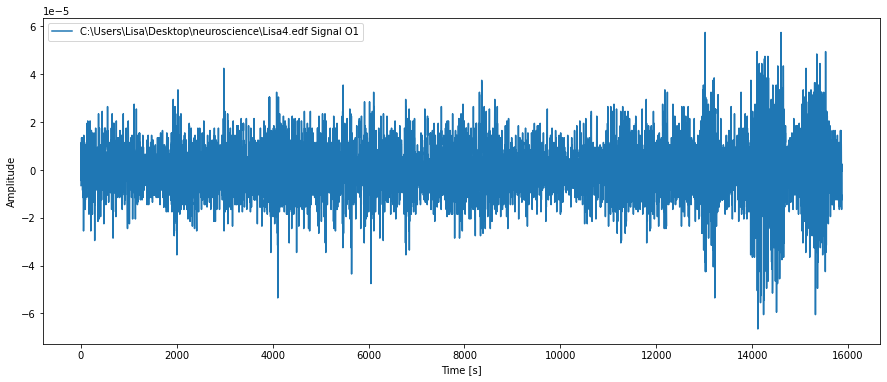

<Figure size 432x288 with 0 Axes>

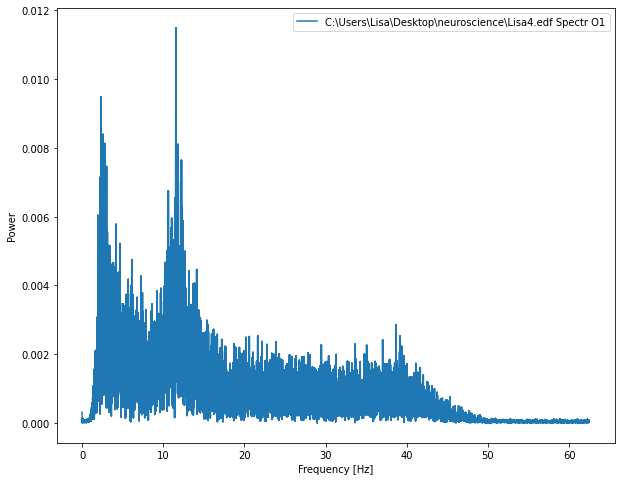

<Figure size 432x288 with 0 Axes>

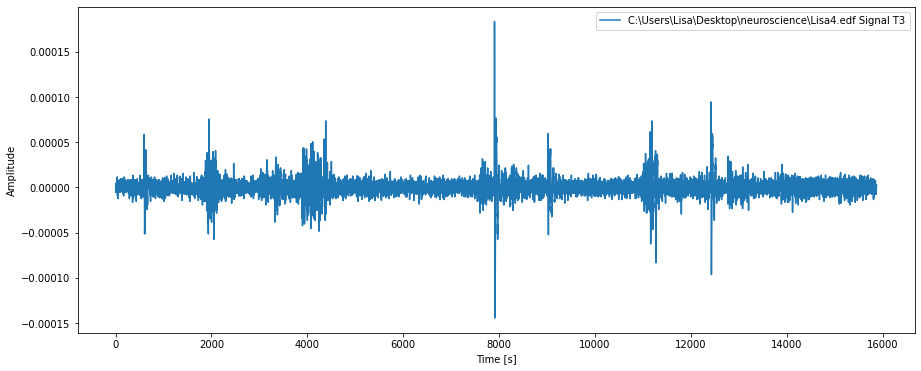

<Figure size 432x288 with 0 Axes>

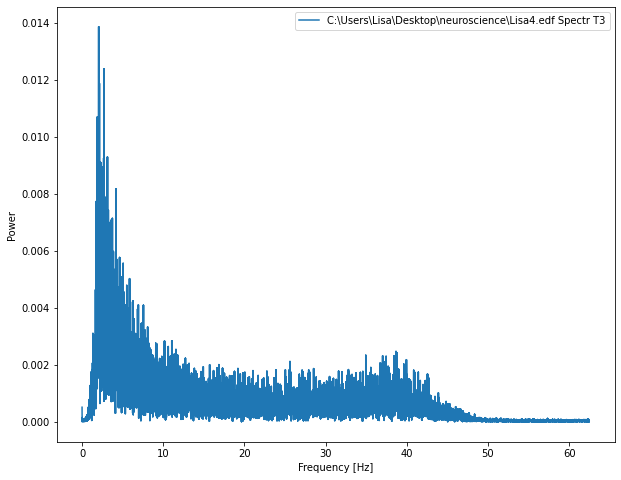

<Figure size 432x288 with 0 Axes>

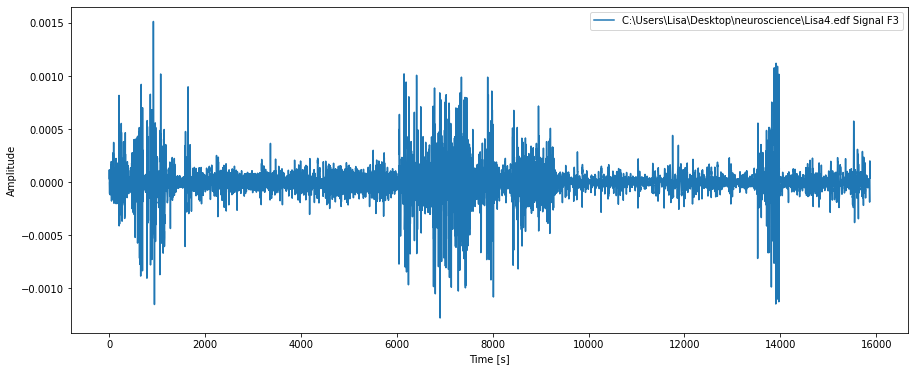

<Figure size 432x288 with 0 Axes>

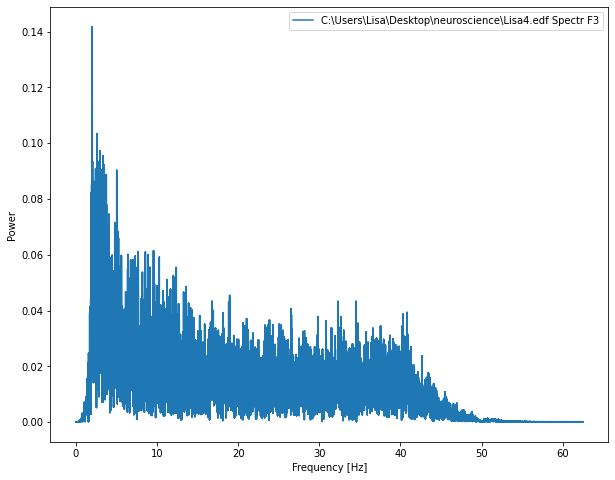

<Figure size 432x288 with 0 Axes>

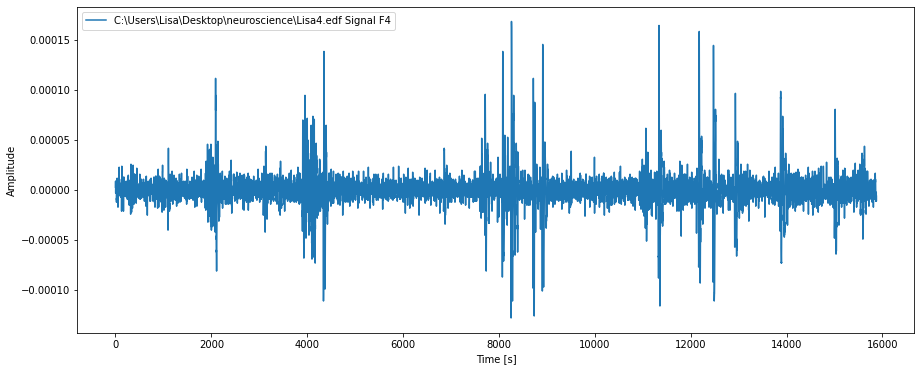

<Figure size 432x288 with 0 Axes>

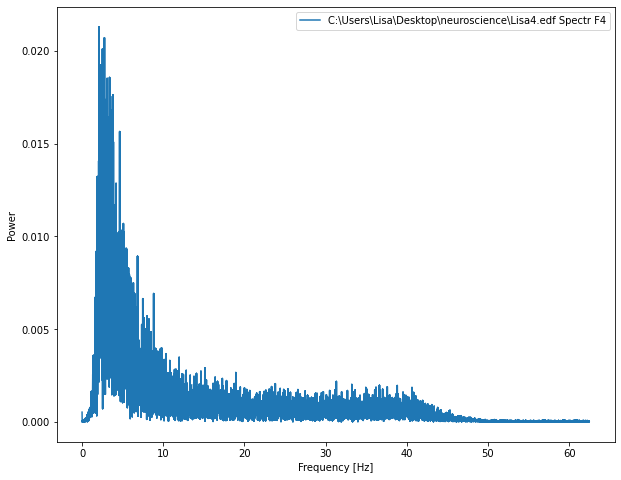

<Figure size 432x288 with 0 Axes>

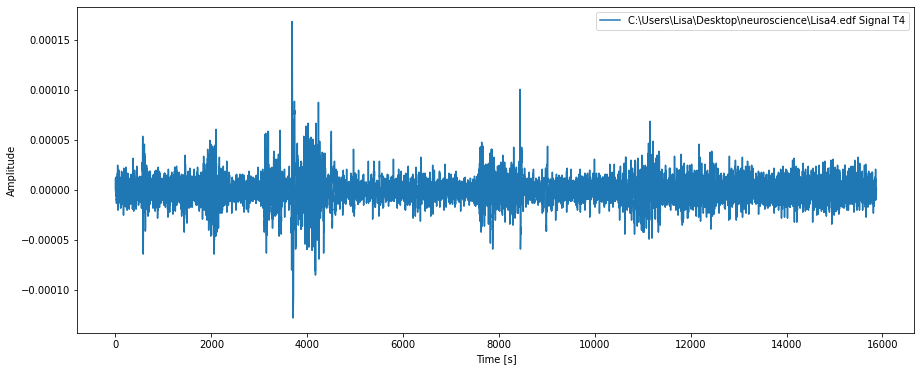

<Figure size 432x288 with 0 Axes>

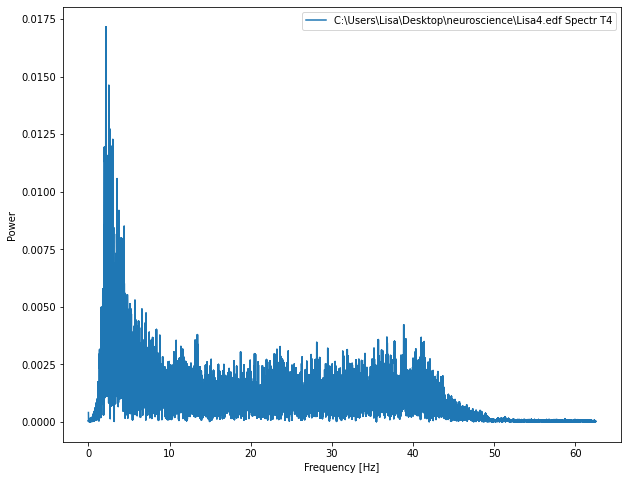

<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>


<Figure size 432x288 with 0 Axes>

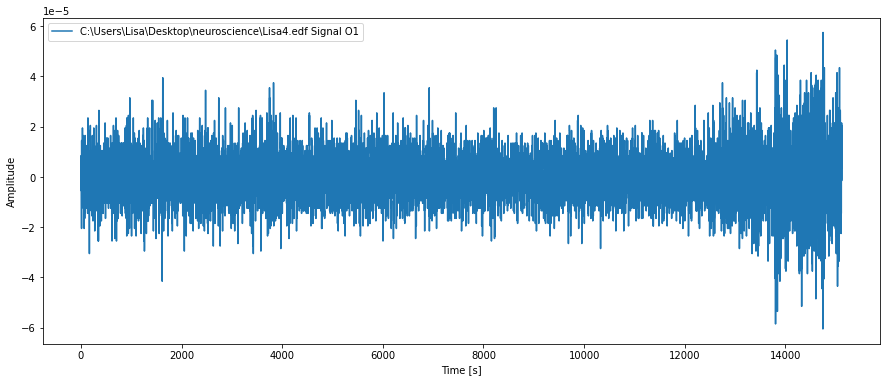

<Figure size 432x288 with 0 Axes>

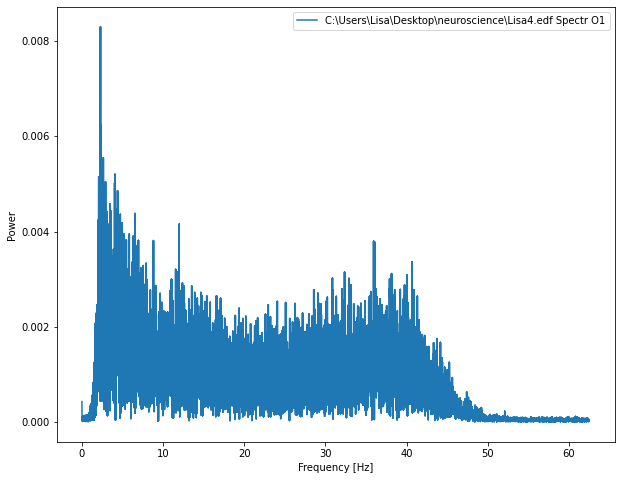

<Figure size 432x288 with 0 Axes>

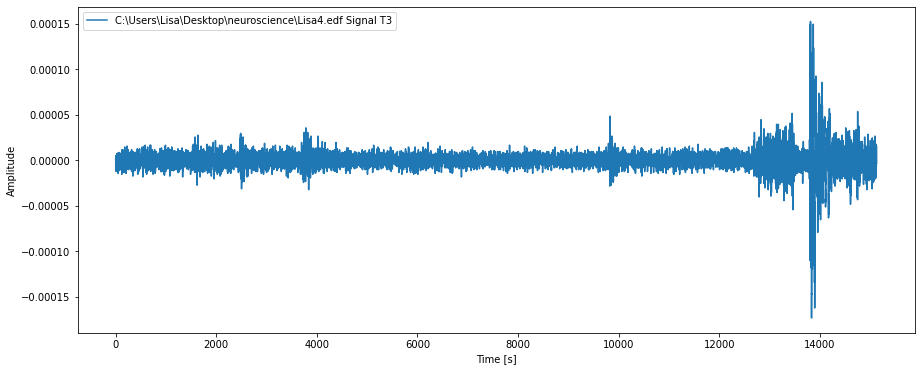

<Figure size 432x288 with 0 Axes>

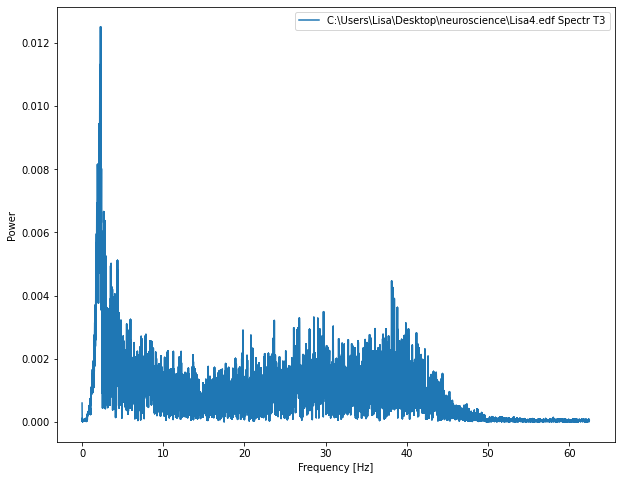

<Figure size 432x288 with 0 Axes>

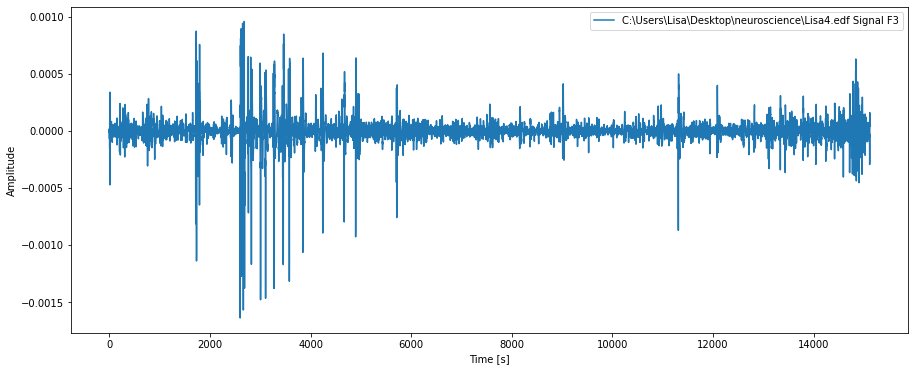

<Figure size 432x288 with 0 Axes>

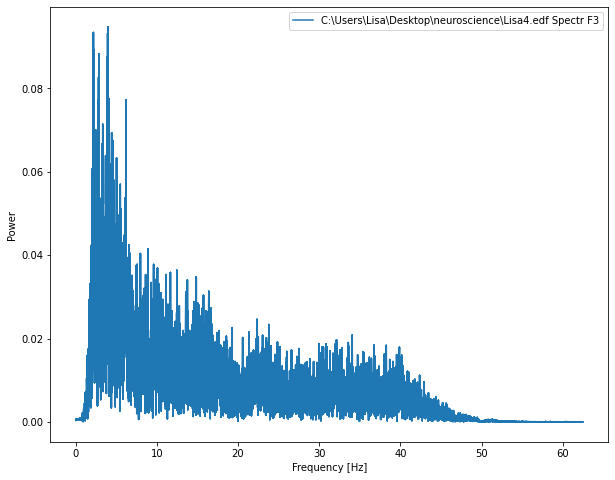

<Figure size 432x288 with 0 Axes>

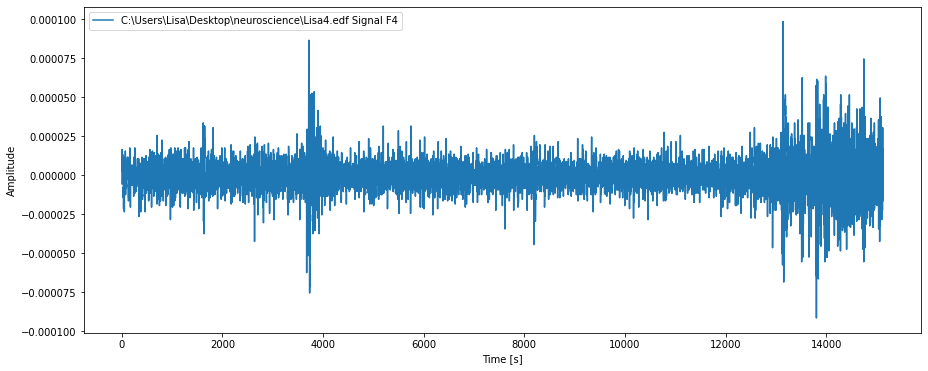

<Figure size 432x288 with 0 Axes>

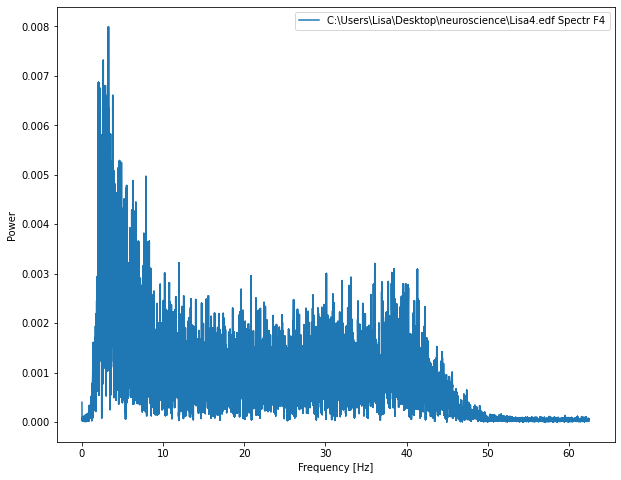

<Figure size 432x288 with 0 Axes>

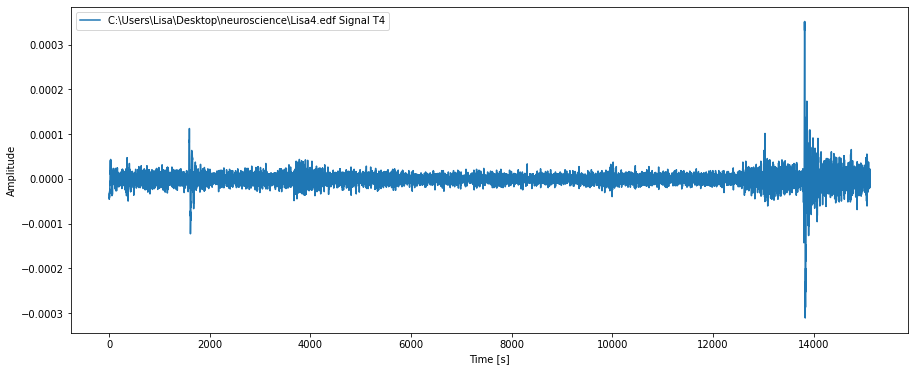

<Figure size 432x288 with 0 Axes>

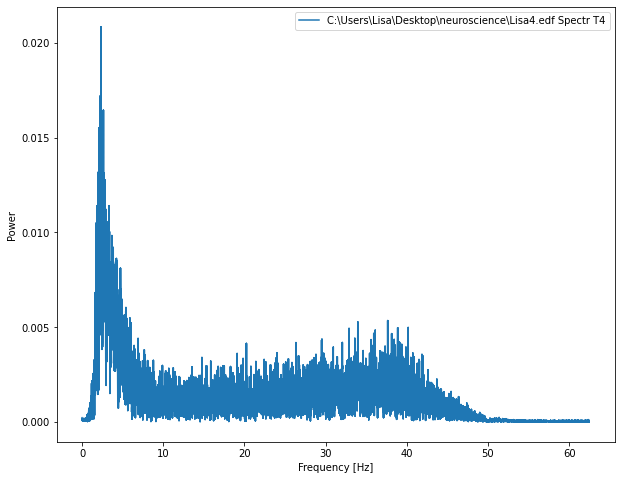

<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>


<Figure size 432x288 with 0 Axes>

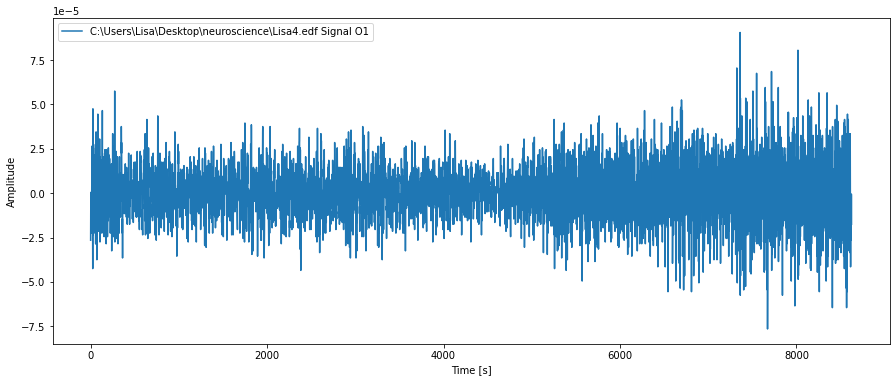

<Figure size 432x288 with 0 Axes>

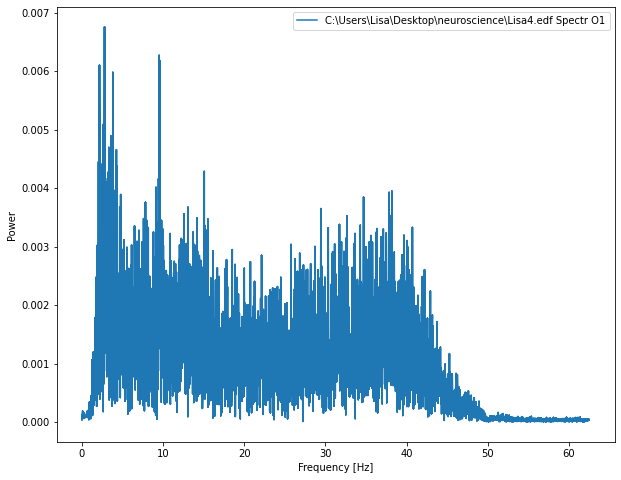

<Figure size 432x288 with 0 Axes>

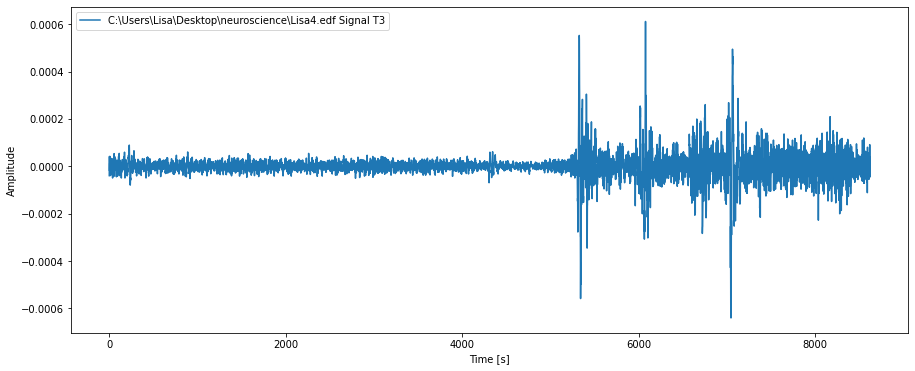

<Figure size 432x288 with 0 Axes>

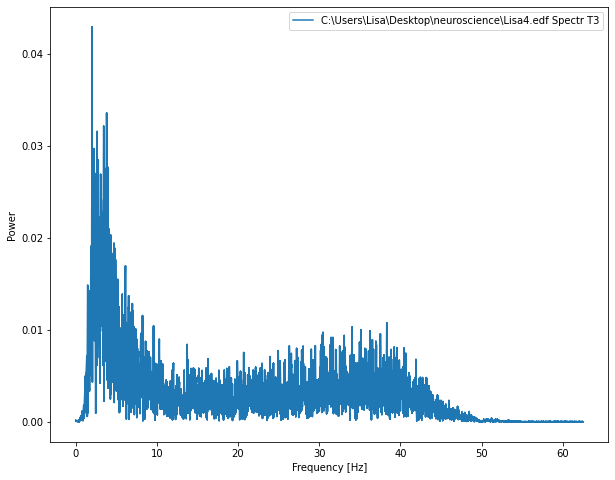

<Figure size 432x288 with 0 Axes>

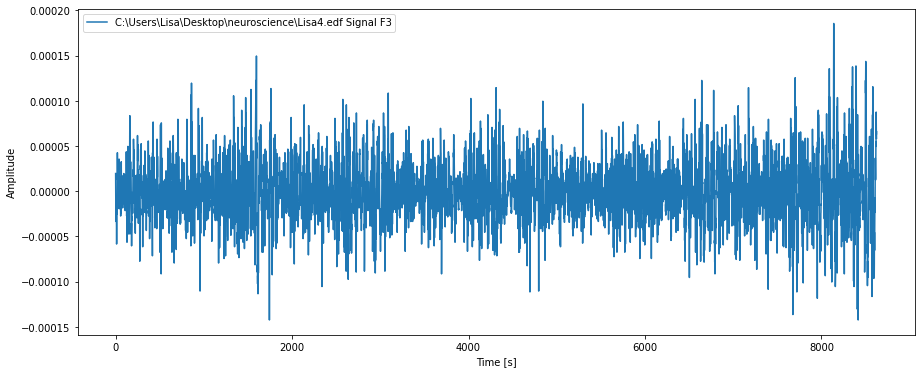

<Figure size 432x288 with 0 Axes>

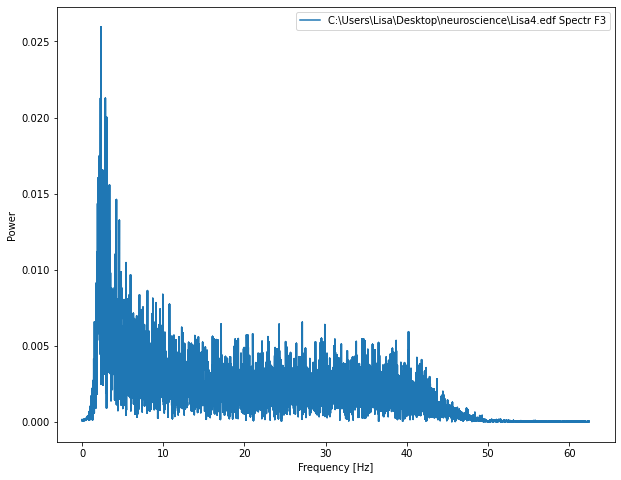

<Figure size 432x288 with 0 Axes>

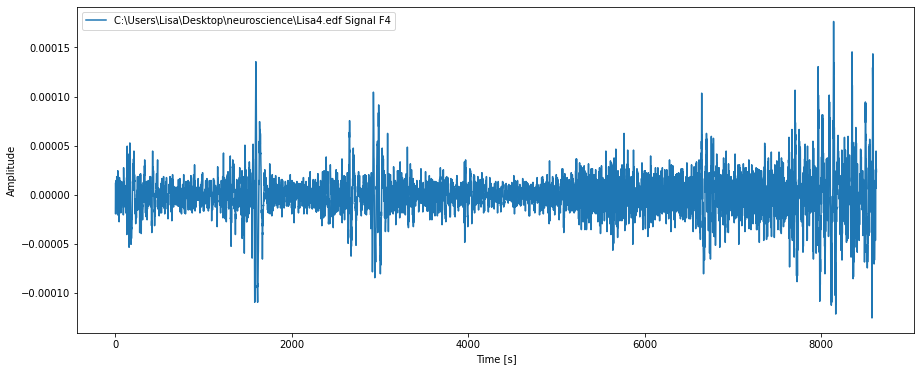

<Figure size 432x288 with 0 Axes>

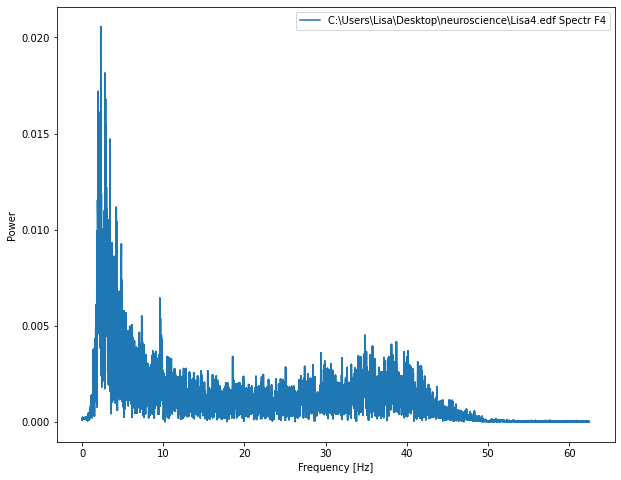

<Figure size 432x288 with 0 Axes>

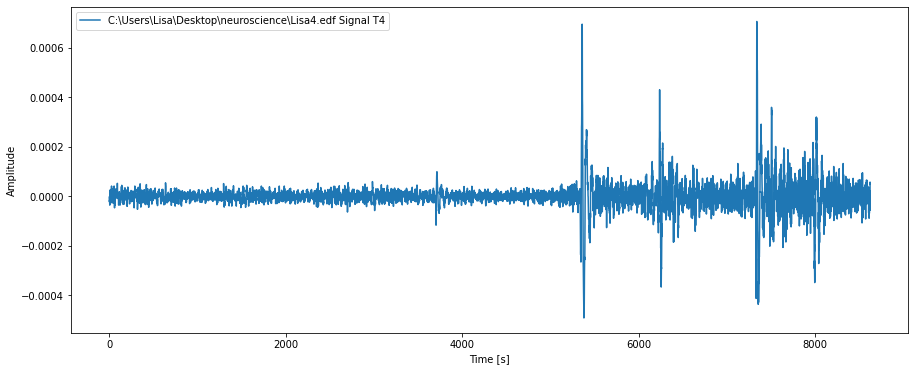

<Figure size 432x288 with 0 Axes>

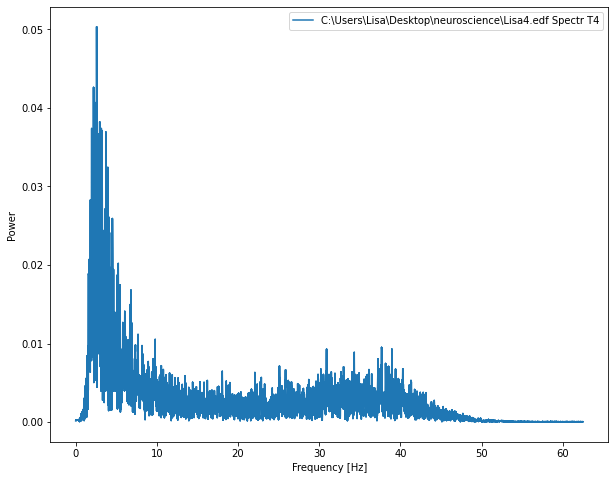

<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>


<Figure size 432x288 with 0 Axes>

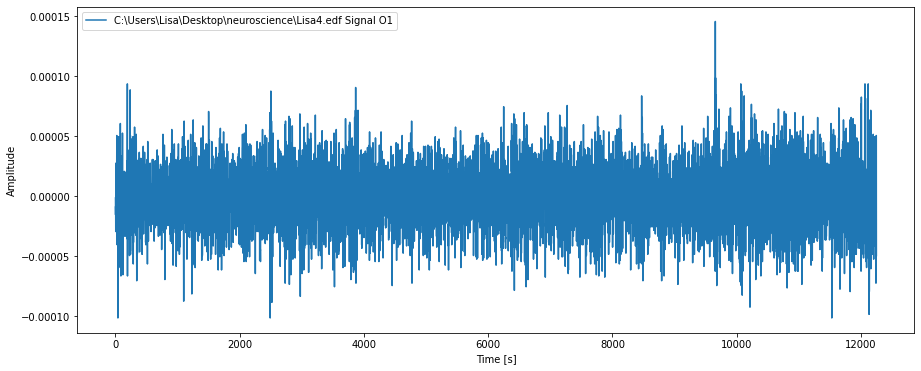

<Figure size 432x288 with 0 Axes>

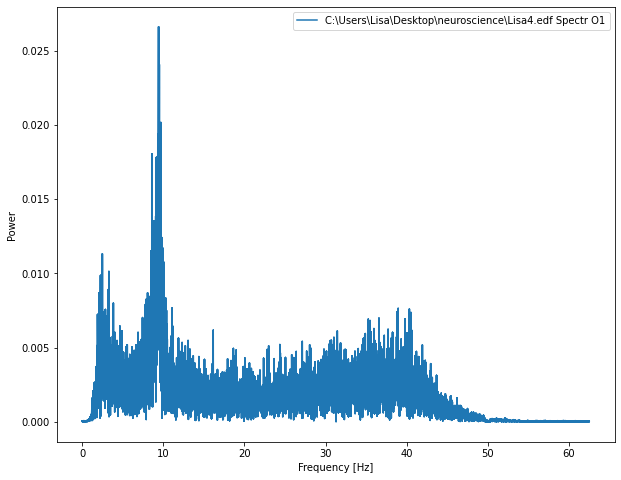

<Figure size 432x288 with 0 Axes>

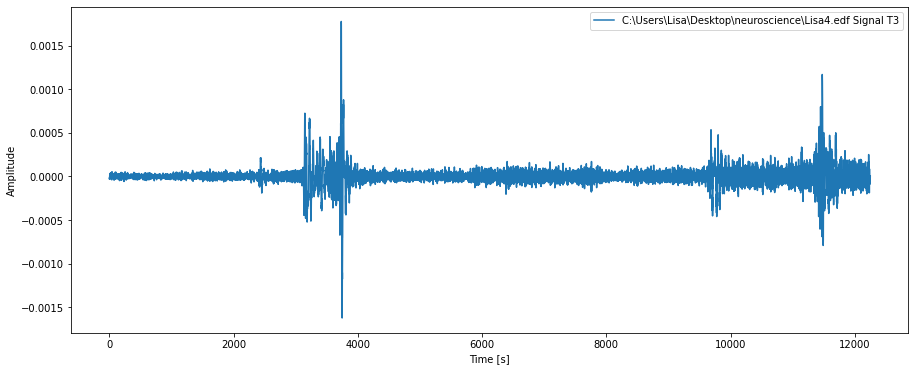

<Figure size 432x288 with 0 Axes>

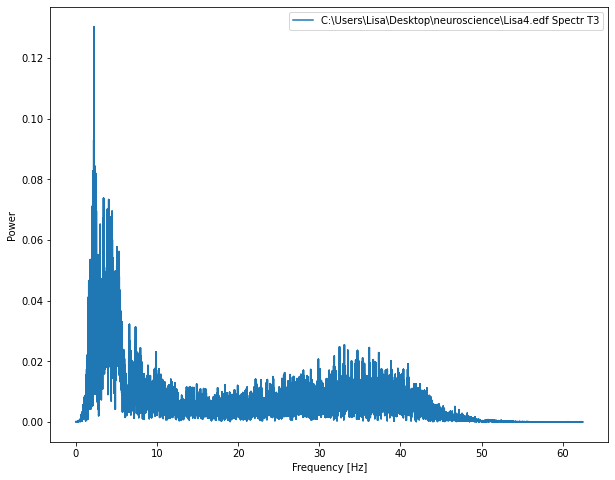

<Figure size 432x288 with 0 Axes>

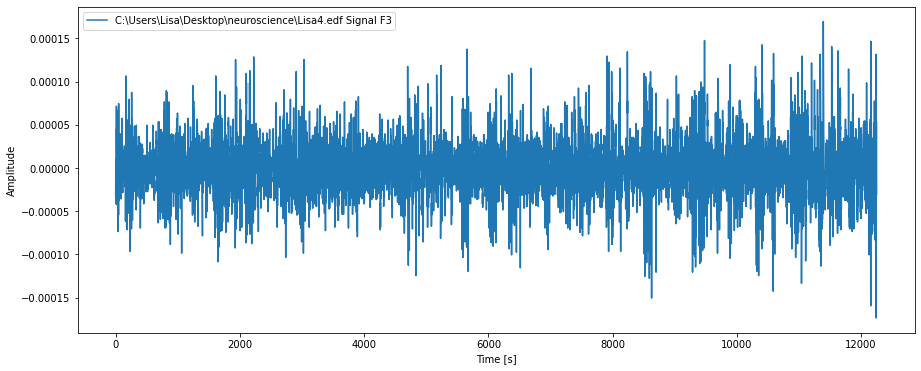

<Figure size 432x288 with 0 Axes>

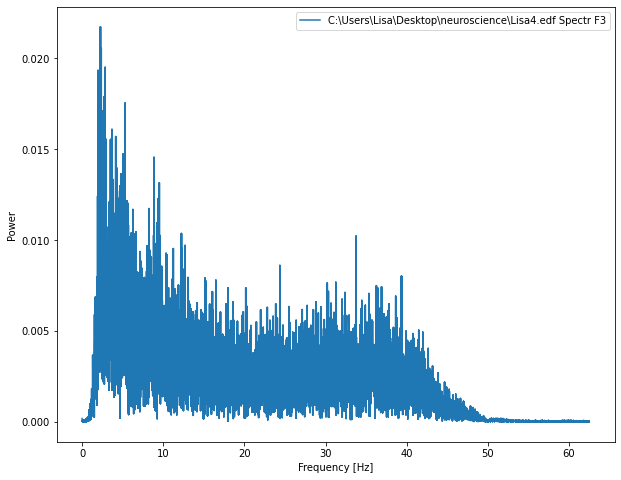

<Figure size 432x288 with 0 Axes>

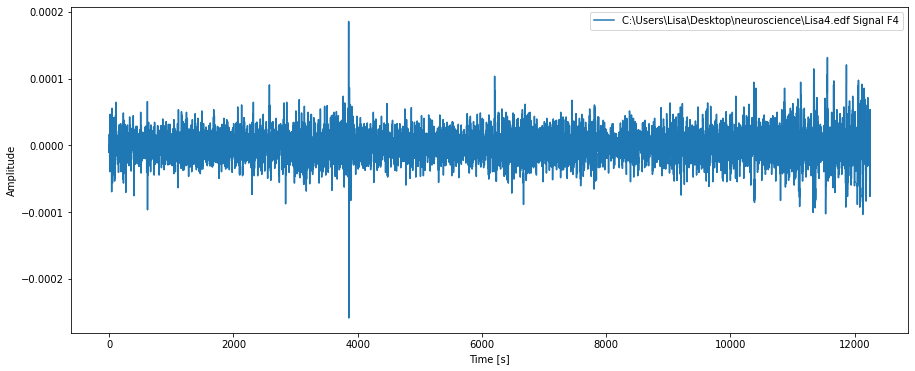

<Figure size 432x288 with 0 Axes>

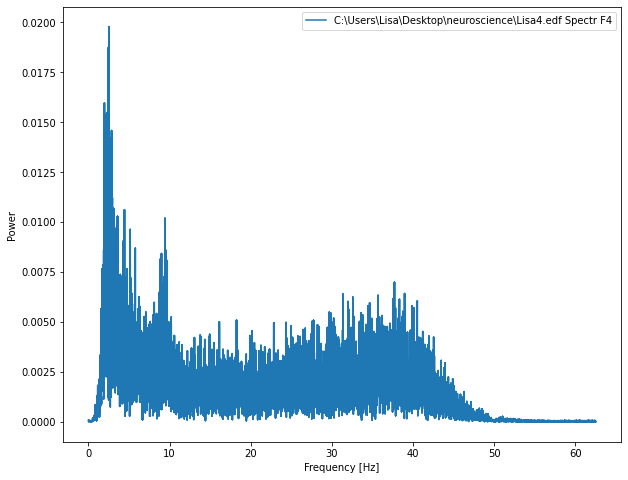

<Figure size 432x288 with 0 Axes>

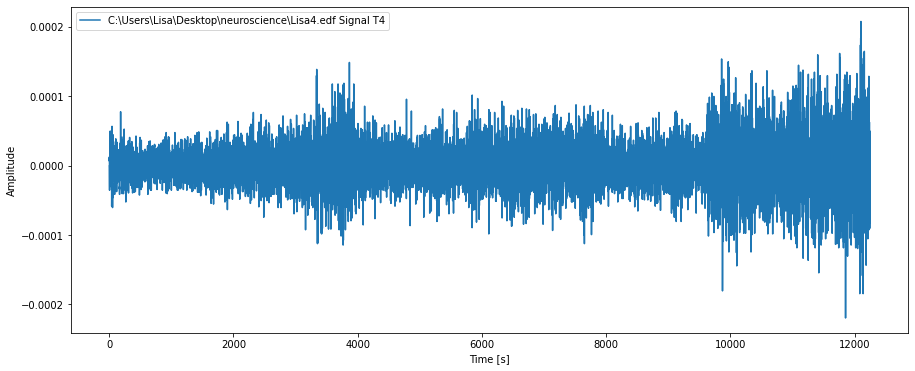

<Figure size 432x288 with 0 Axes>

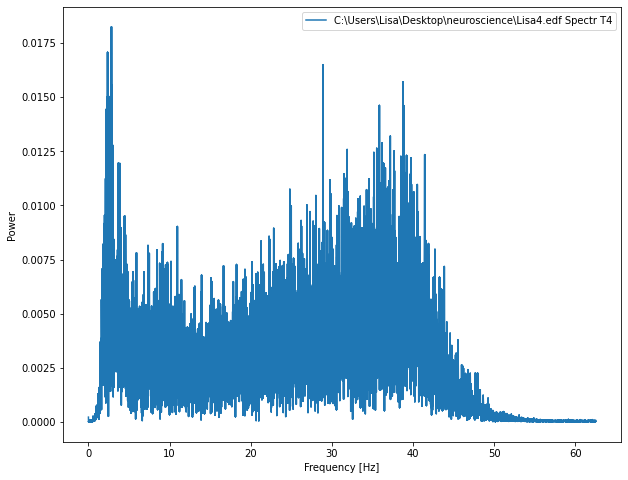

<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>


<Figure size 432x288 with 0 Axes>

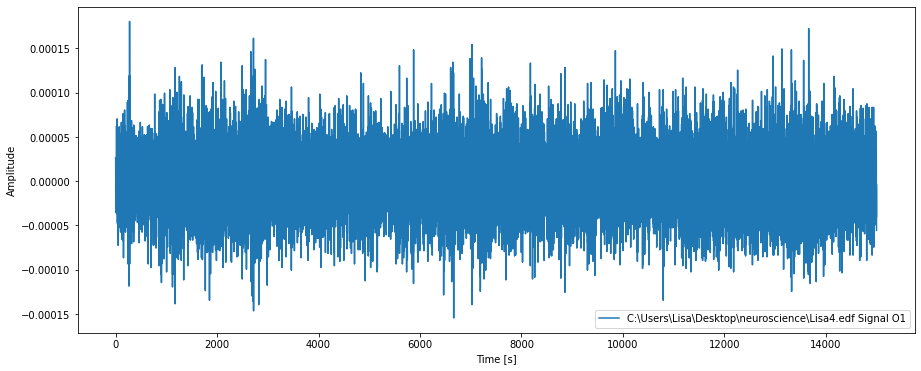

<Figure size 432x288 with 0 Axes>

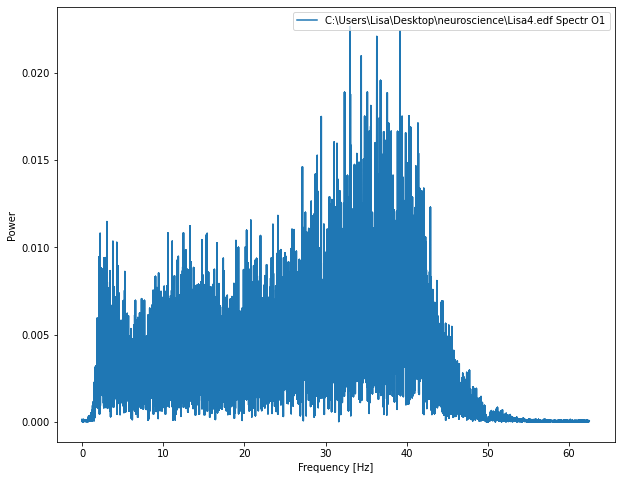

<Figure size 432x288 with 0 Axes>

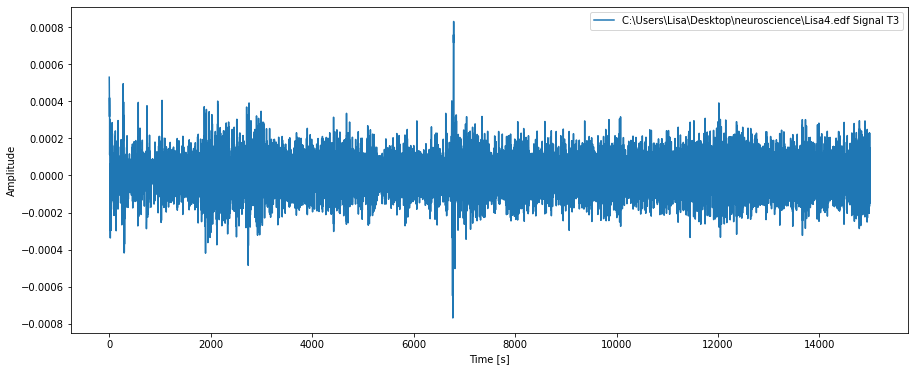

<Figure size 432x288 with 0 Axes>

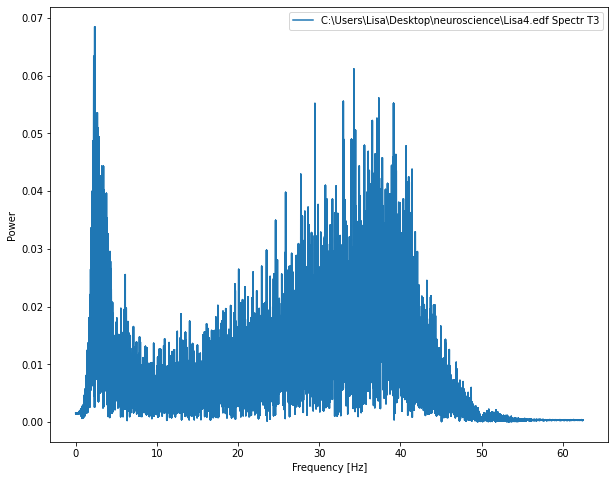

<Figure size 432x288 with 0 Axes>

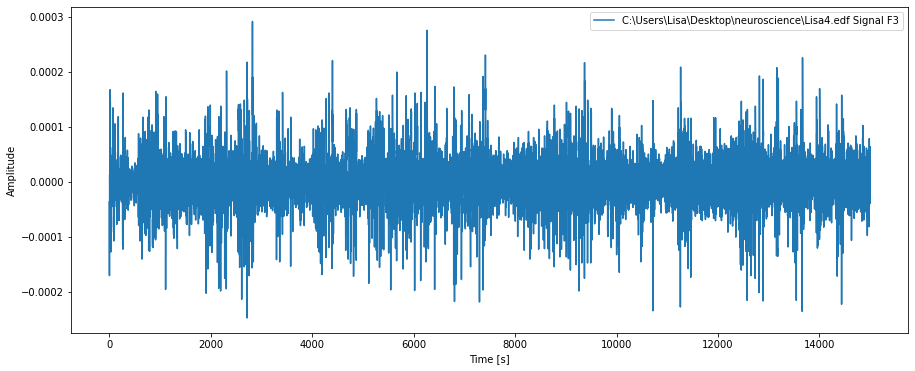

<Figure size 432x288 with 0 Axes>

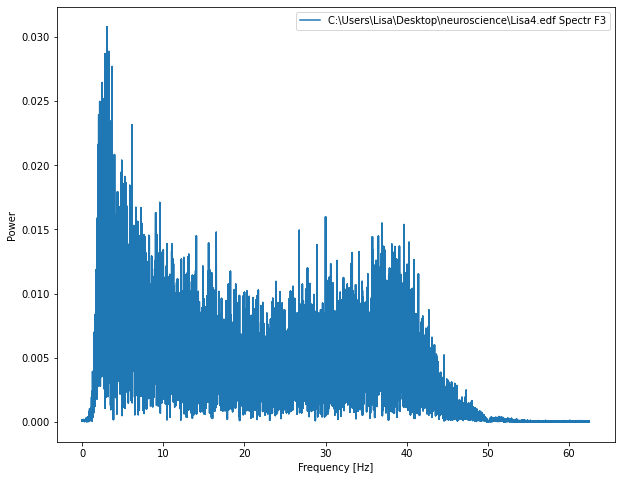

<Figure size 432x288 with 0 Axes>

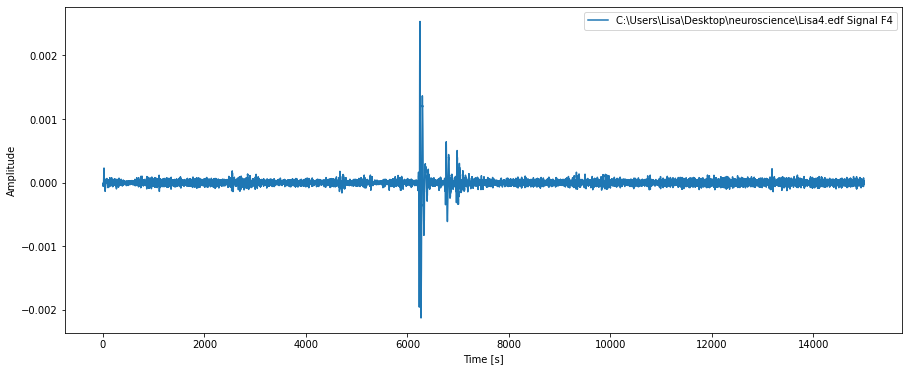

<Figure size 432x288 with 0 Axes>

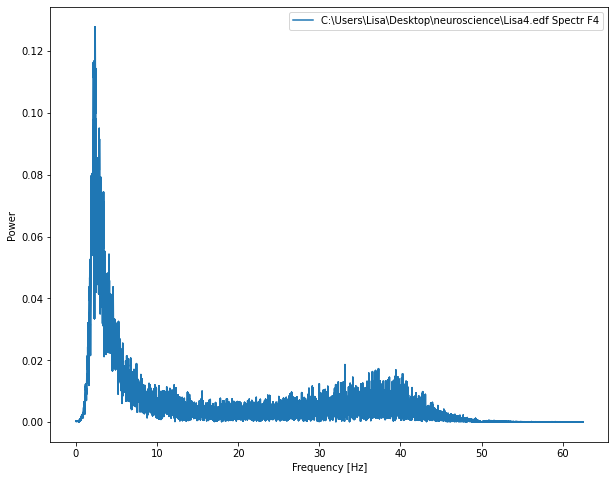

<Figure size 432x288 with 0 Axes>

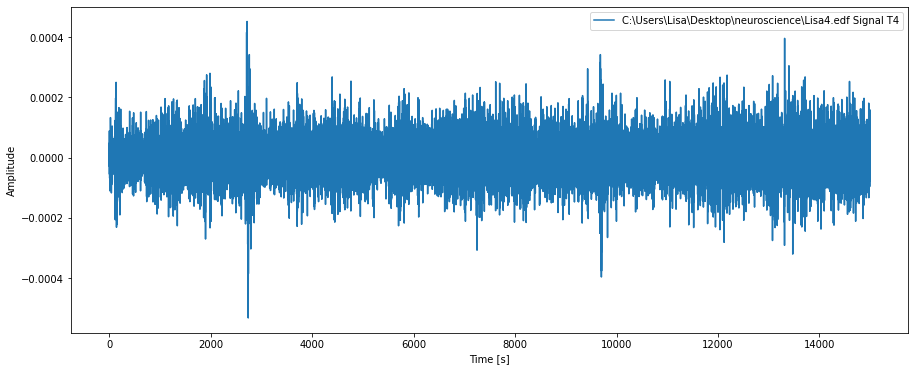

<Figure size 432x288 with 0 Axes>

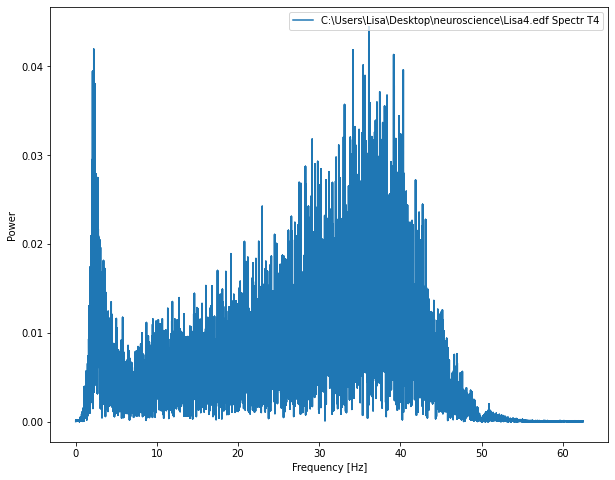

<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>


<Figure size 432x288 with 0 Axes>

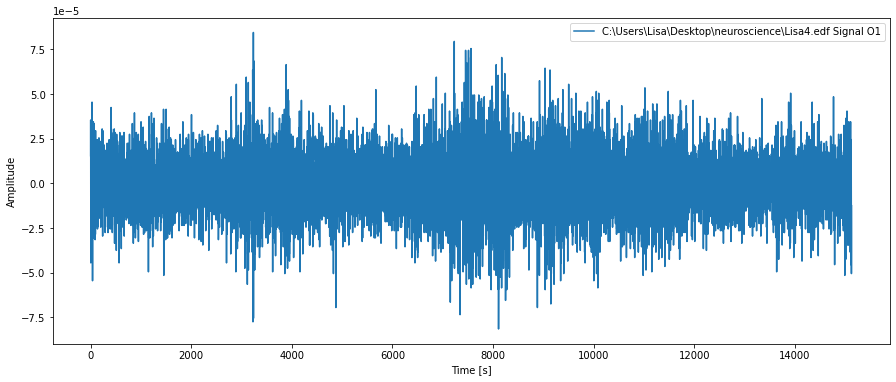

<Figure size 432x288 with 0 Axes>

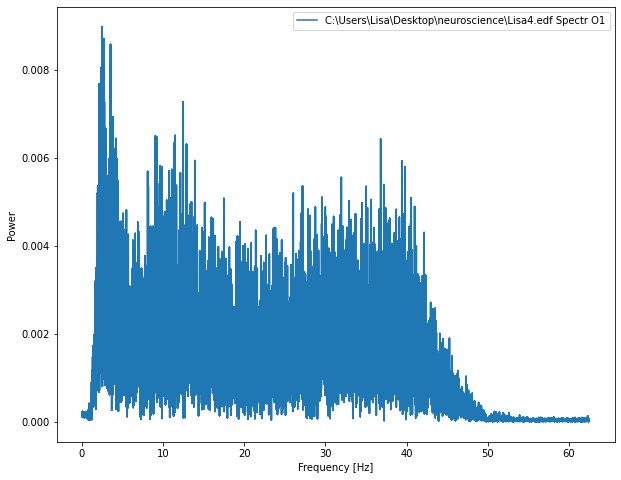

<Figure size 432x288 with 0 Axes>

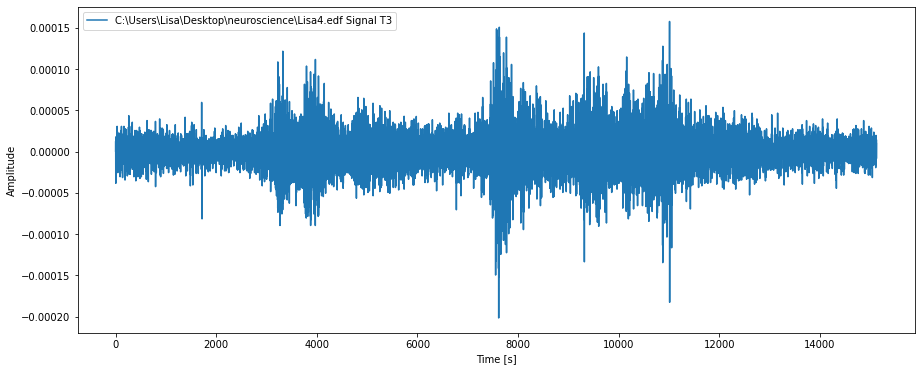

<Figure size 432x288 with 0 Axes>

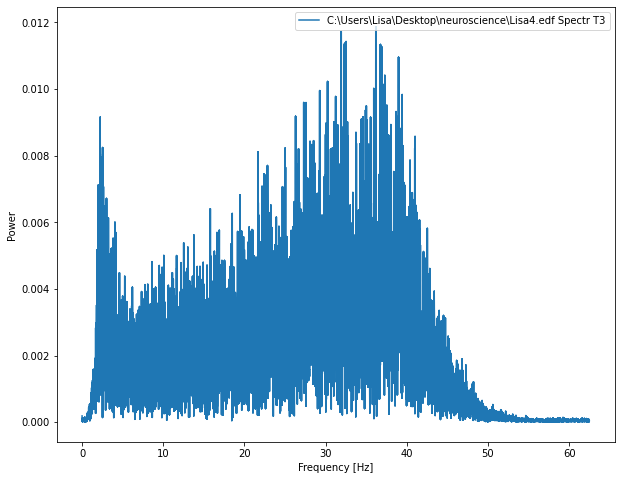

<Figure size 432x288 with 0 Axes>

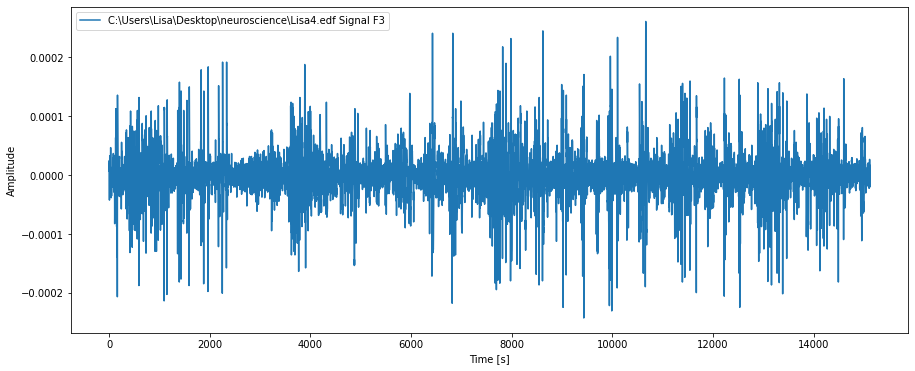

<Figure size 432x288 with 0 Axes>

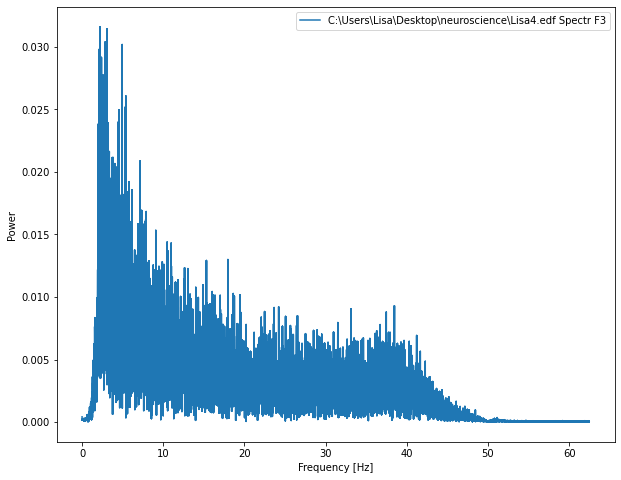

<Figure size 432x288 with 0 Axes>

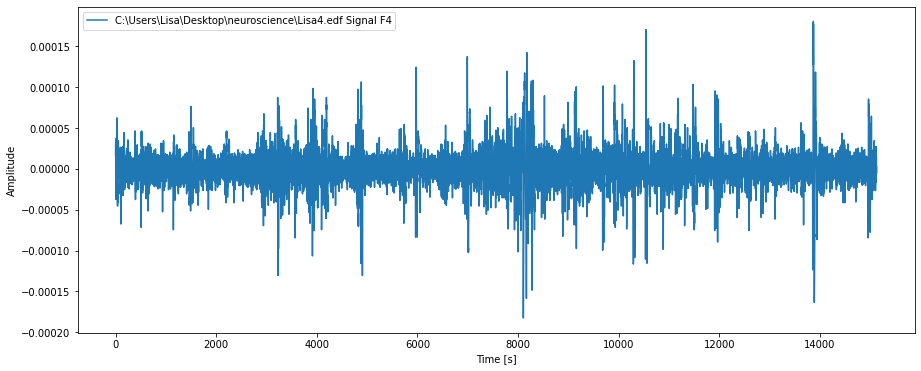

<Figure size 432x288 with 0 Axes>

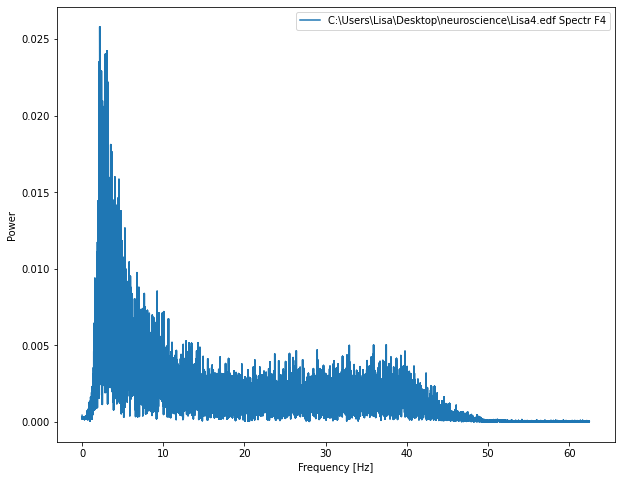

<Figure size 432x288 with 0 Axes>

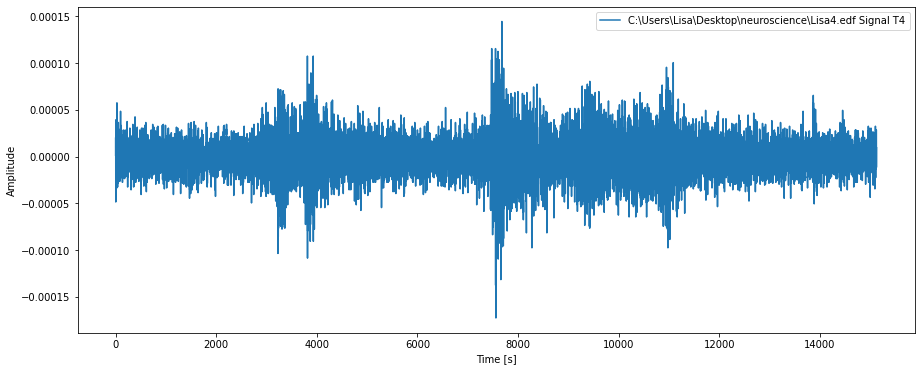

<Figure size 432x288 with 0 Axes>

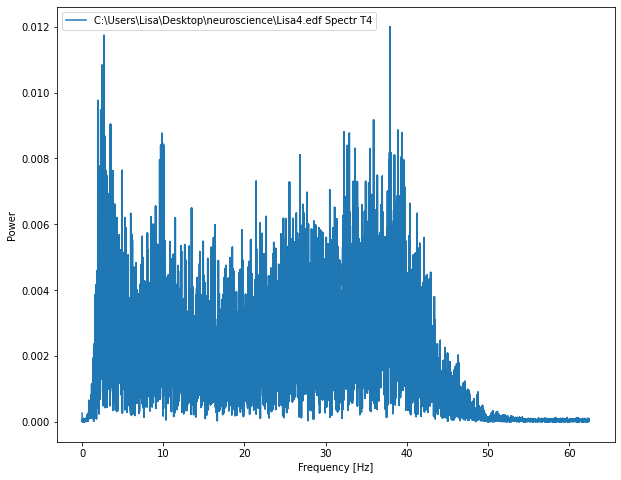

<Figure size 432x288 with 0 Axes>

In [9]:
nchan = 6
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record1 = raw_mne1.get_data()
    length1 = len(file_with_record1[nchan-1])
    length_main = length1
    file_with_record_main = file_with_record1
    sample_rate_main = sample_rate1
    for chan in range(0,nchan-1):
        # Рисуем любой массив сигнала
        draw_signal(file_with_record_main[chan],length_main,1, filename +' Signal '+raw_mne1.ch_names[chan])
        # Рисуем спектр любого массива сигнала
        draw_spectr(file_with_record_main[chan],sample_rate_main,filename+' Spectr '+raw_mne1.ch_names[chan])
    

In [10]:
nchan = 6
part_length_sec=1
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    for chan in range(0,nchan):    
        print('Mean '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.mean(abs(file_with_record_main[chan])))))
        print('Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(file_with_record_main[chan]))))
        print('Mx-Mn'+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(file_with_record_main[chan])-np.mean(abs(file_with_record_main[chan])))))

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
Mean O1: 0.000007111
Max  O1: 0.000080499
Mx-MnO1: 0.000073387
Mean T3: 0.000004905
Max  T3: 0.000074499
Mx-MnT3: 0.000069594
Mean F3: 0.000052216
Max  F3: 0.000479493
Mx-MnF3: 0.000427277
Mean F4: 0.000007657
Max  F4: 0.000161498
Mx-MnF4: 0.000153841
Mean T4: 0.000007406
Max  T4: 0.000104498
Mx-MnT4: 0.000097092
Mean O2: 0.000008247
Max  O2: 0.000071499
Mx-MnO2: 0.000063252
<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
Mean O1: 0.000016149
Max  O1: 0.000079499
Mx-MnO1: 0.000063350
Mean T3: 0.000005229
Max  T3: 0.000045499
Mx-MnT3: 0.000040270
Mean F3: 0.000065033
Max  F3: 0.000750489
Mx-MnF3: 0.000685456
Mean F4: 0.000006960
Max  F4: 0.000047499
Mx-MnF4: 0.000040539
Mean T4: 0.000008650
Max  T4: 0.000079499
Mx-MnT4: 0.000070849
Mean O2: 0.000018226
Max  O2: 0.000082499
Mx-MnO2: 0.000064272
<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
Mean O1: 0.000007690
Max  O1: 0.000057499
Mx-MnO1: 0.000

In [15]:
nchan = 6
part_length_sec=1
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    threshhold=float(input())
    print('Было '+str(nchan)+' '+str(length_main))
    print('Стало '+str(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan).shape))
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[chan]
    length1 = len(new_file_with_record1[0])
    print(length1)
    

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
0.0004
Было 6 15125
Стало (6, 8500)


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

8500
<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
0.0007
Было 6 15125
Стало (6, 7750)
7750
<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
0.0008
Было 6 15125
Стало (6, 13375)
13375
<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.0008
Было 6 15125
Стало (6, 13625)
13625
<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>
0.00085
Было 6 15125
Стало (6, 8625)
8625
<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>
0.0002
Было 6 15125
Стало (6, 9125)
9125
<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>
0.0004
Было 6 15125
Стало (6, 13750)
13750
<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.0002
Было 6 15125
Стало (6, 12875)
12875


<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
0.0004


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

8500


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

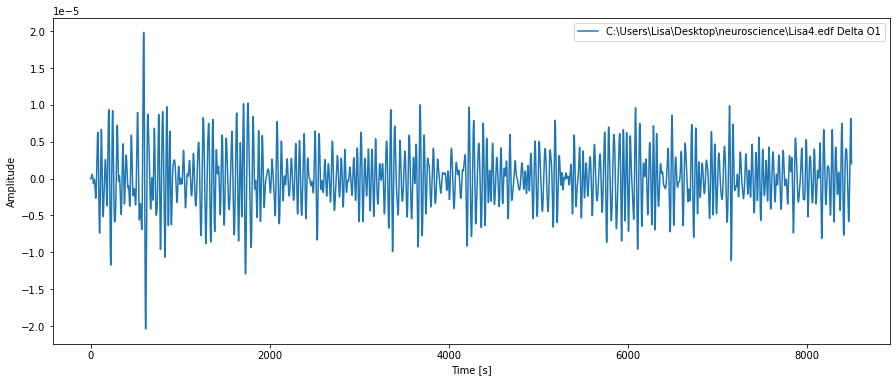

<Figure size 432x288 with 0 Axes>

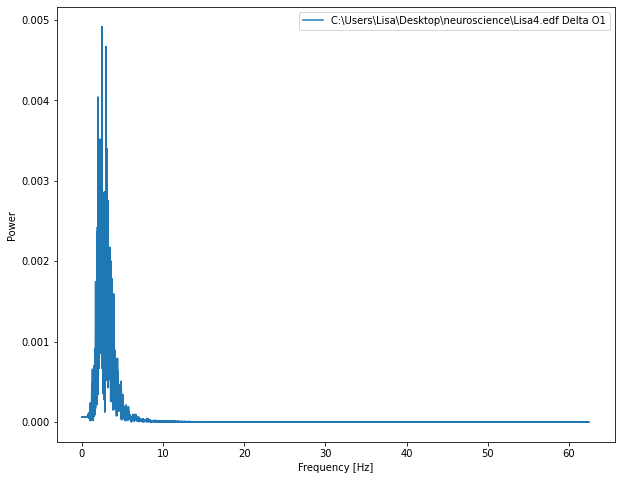

<Figure size 432x288 with 0 Axes>

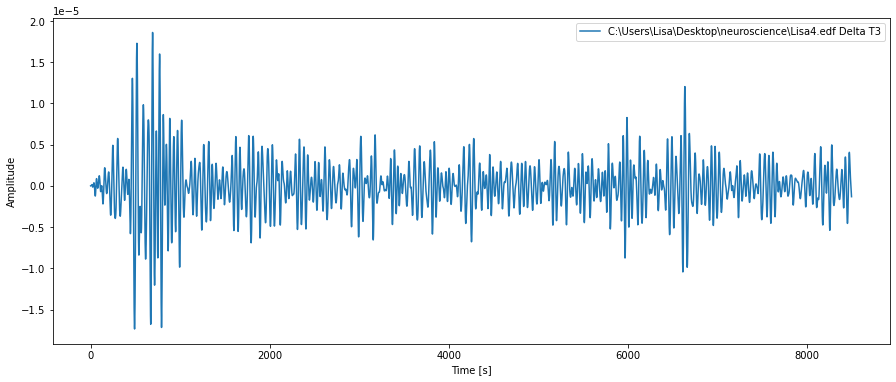

<Figure size 432x288 with 0 Axes>

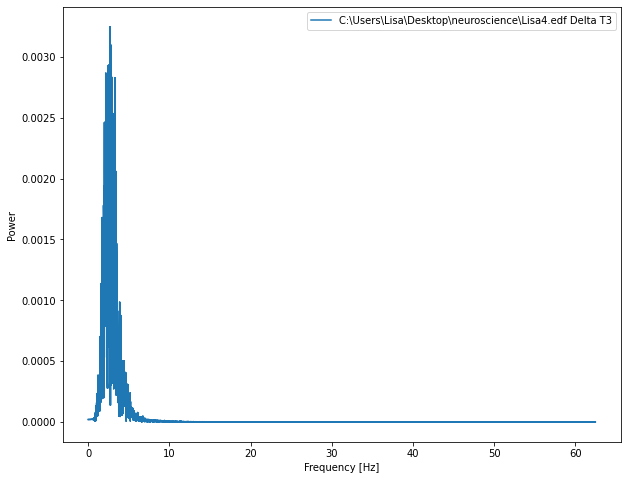

<Figure size 432x288 with 0 Axes>

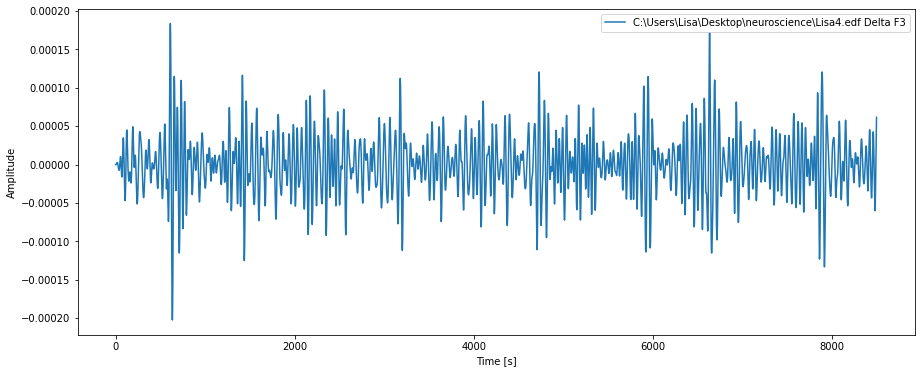

<Figure size 432x288 with 0 Axes>

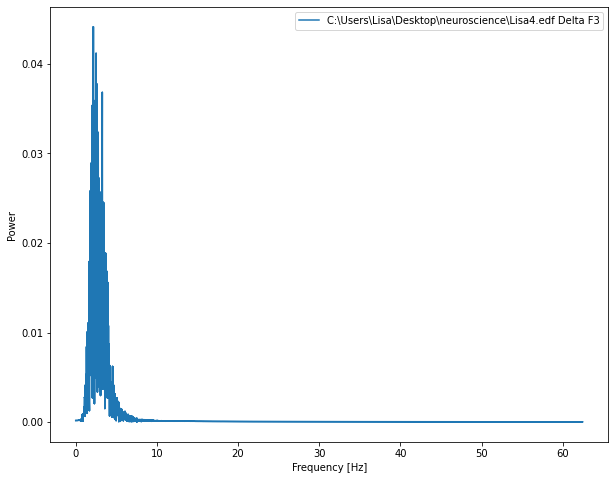

<Figure size 432x288 with 0 Axes>

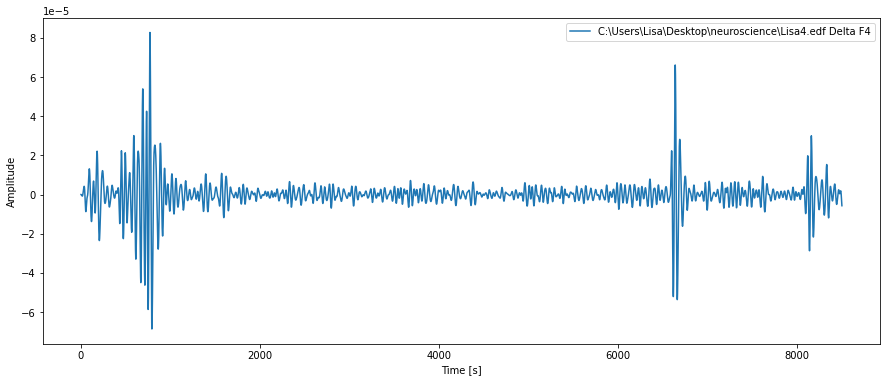

<Figure size 432x288 with 0 Axes>

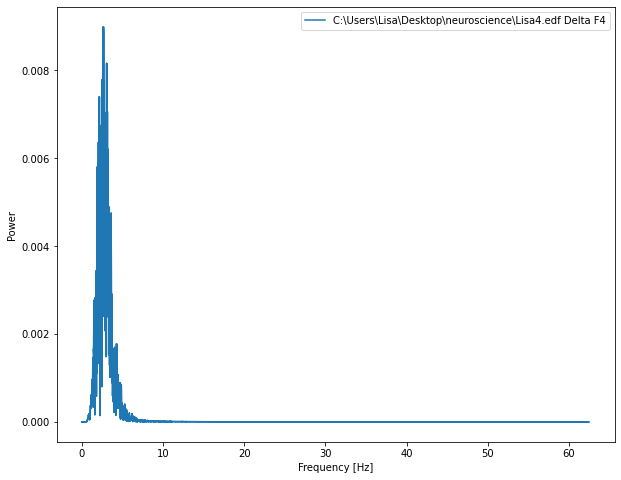

<Figure size 432x288 with 0 Axes>

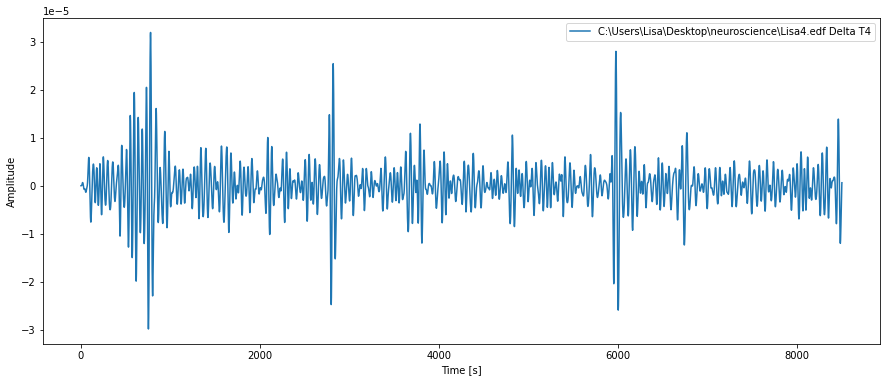

<Figure size 432x288 with 0 Axes>

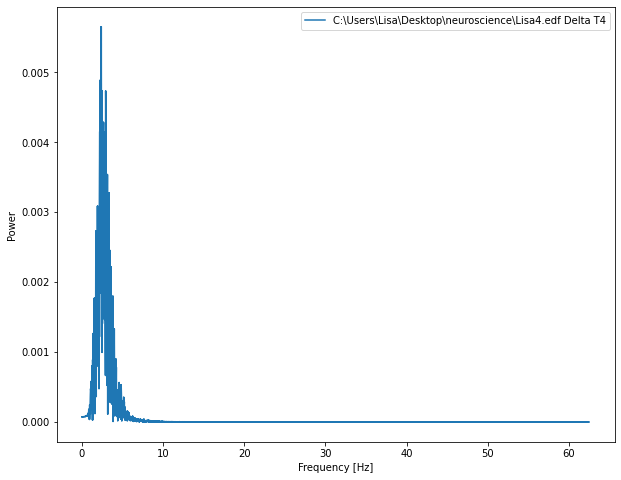

<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
0.0007


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

7750


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

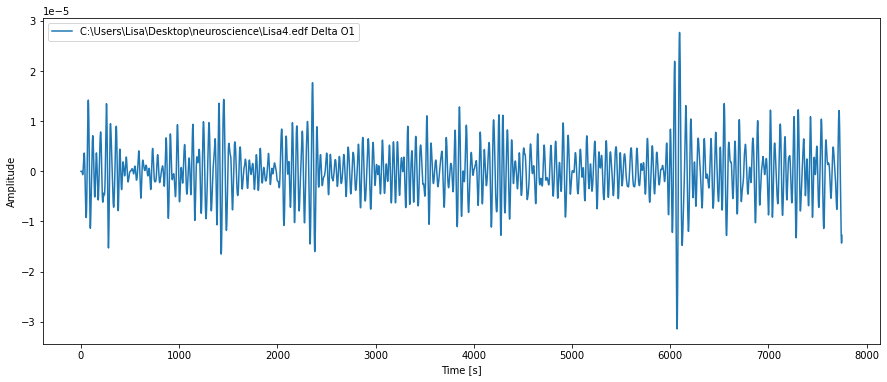

<Figure size 432x288 with 0 Axes>

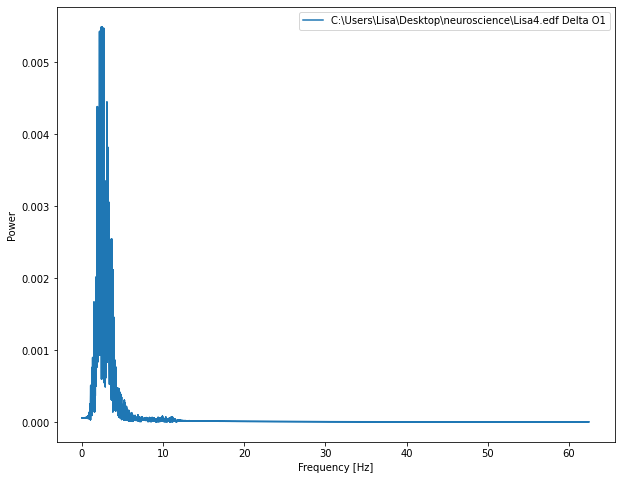

<Figure size 432x288 with 0 Axes>

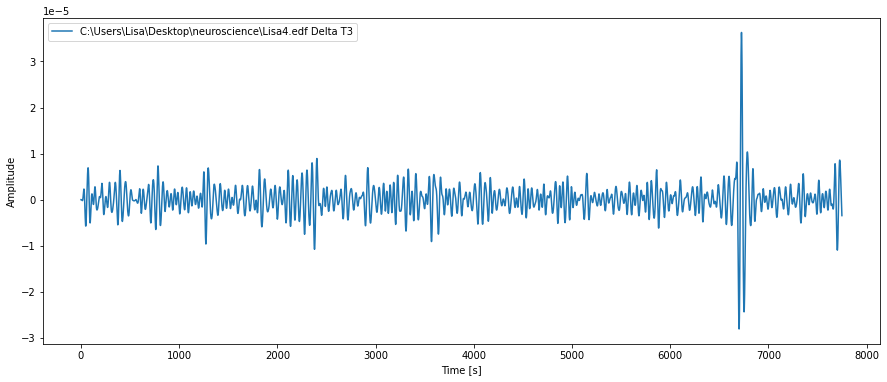

<Figure size 432x288 with 0 Axes>

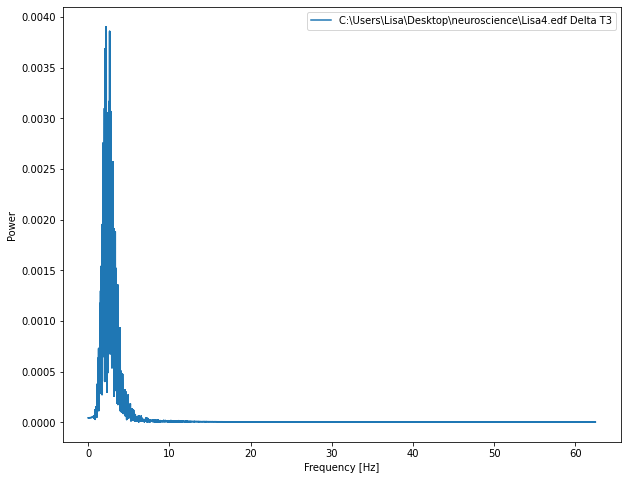

<Figure size 432x288 with 0 Axes>

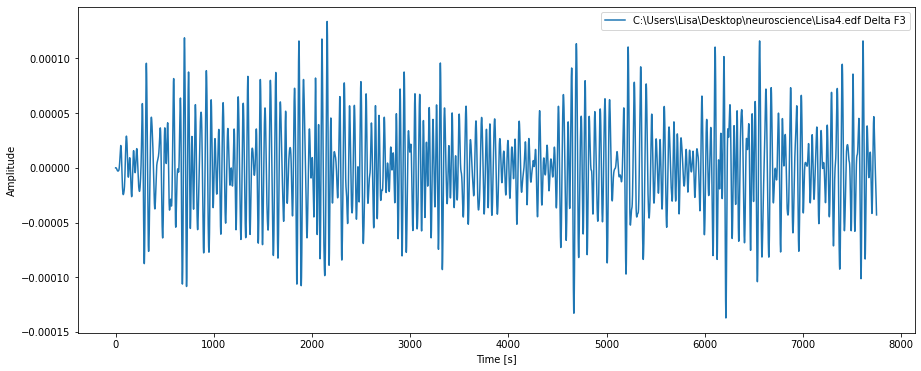

<Figure size 432x288 with 0 Axes>

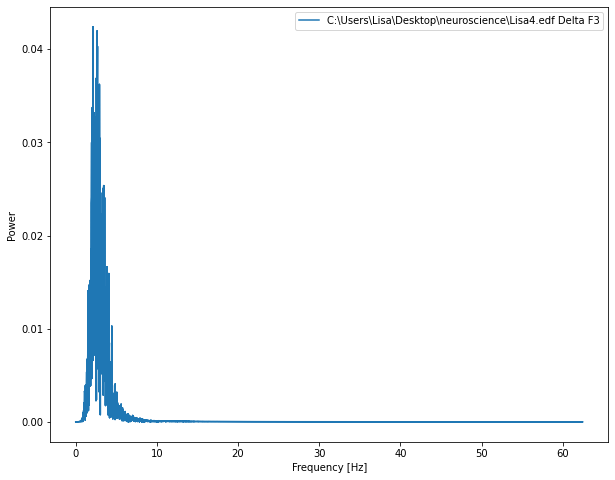

<Figure size 432x288 with 0 Axes>

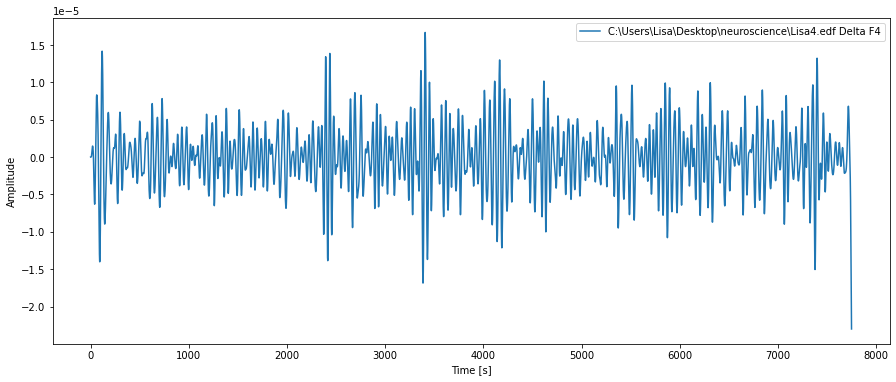

<Figure size 432x288 with 0 Axes>

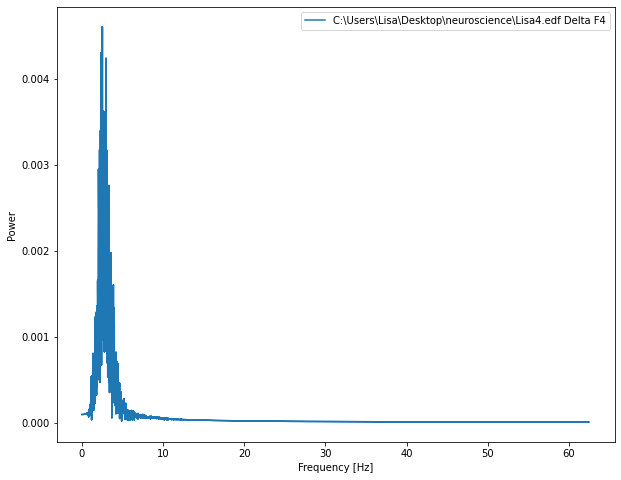

<Figure size 432x288 with 0 Axes>

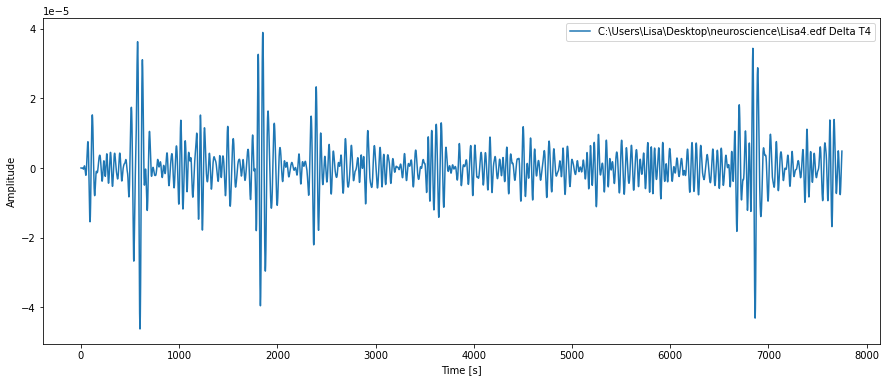

<Figure size 432x288 with 0 Axes>

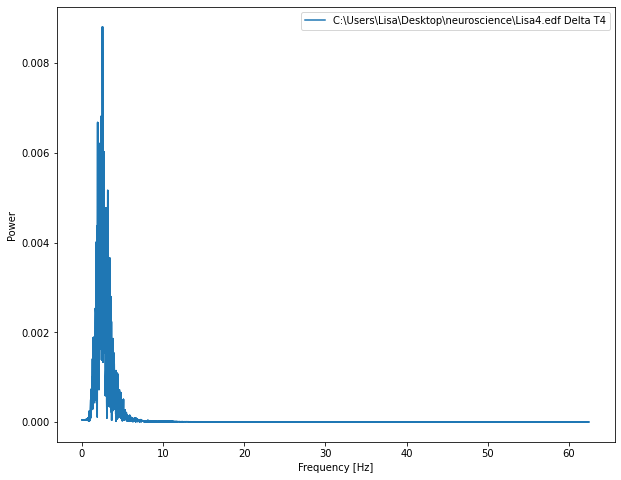

<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
0.0002


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

6125


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

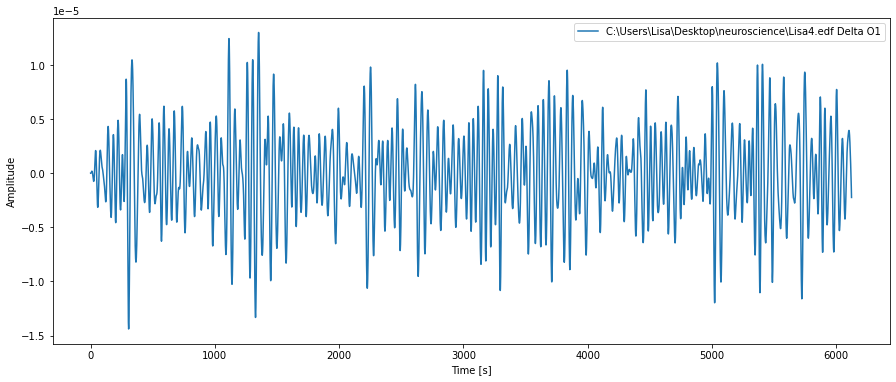

<Figure size 432x288 with 0 Axes>

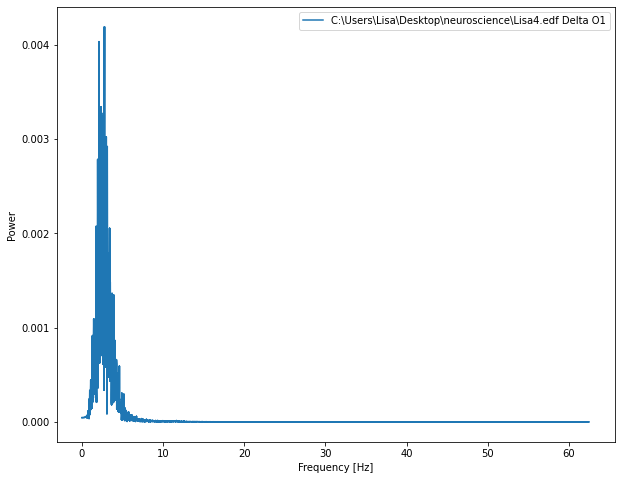

<Figure size 432x288 with 0 Axes>

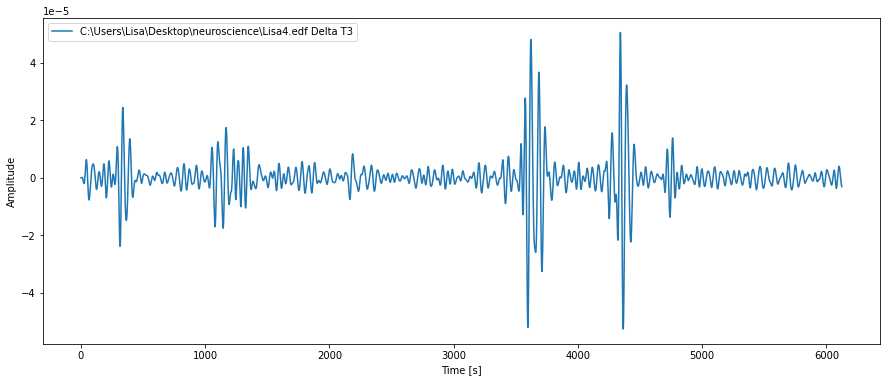

<Figure size 432x288 with 0 Axes>

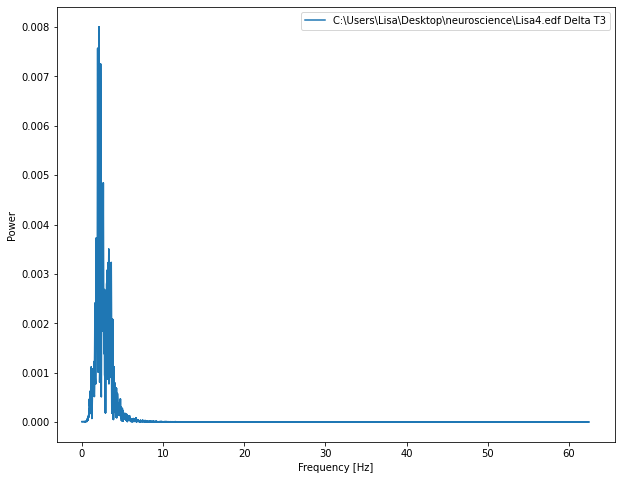

<Figure size 432x288 with 0 Axes>

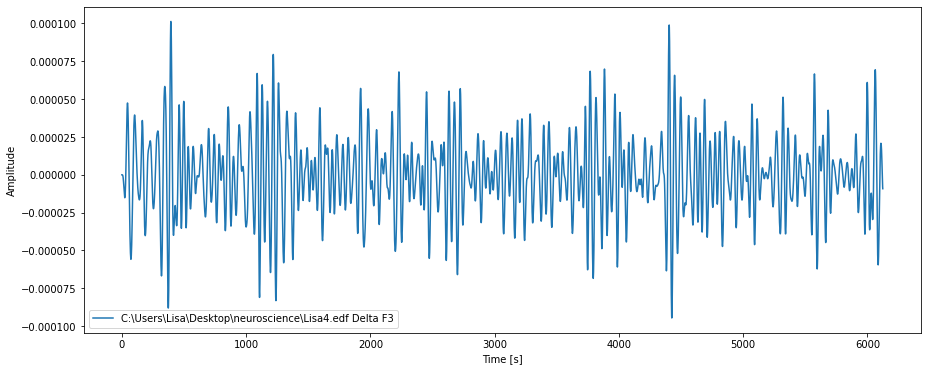

<Figure size 432x288 with 0 Axes>

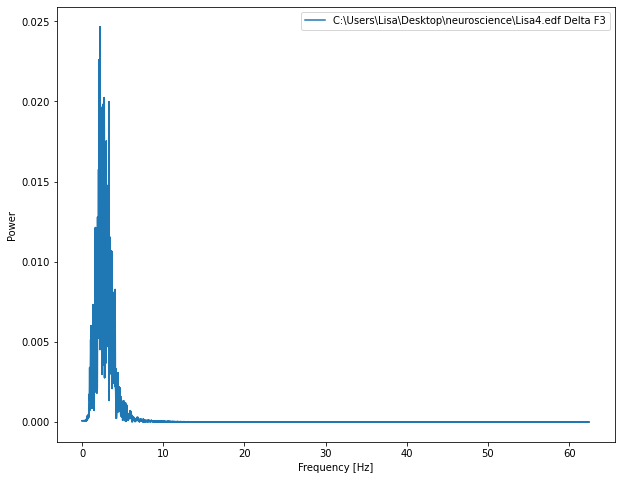

<Figure size 432x288 with 0 Axes>

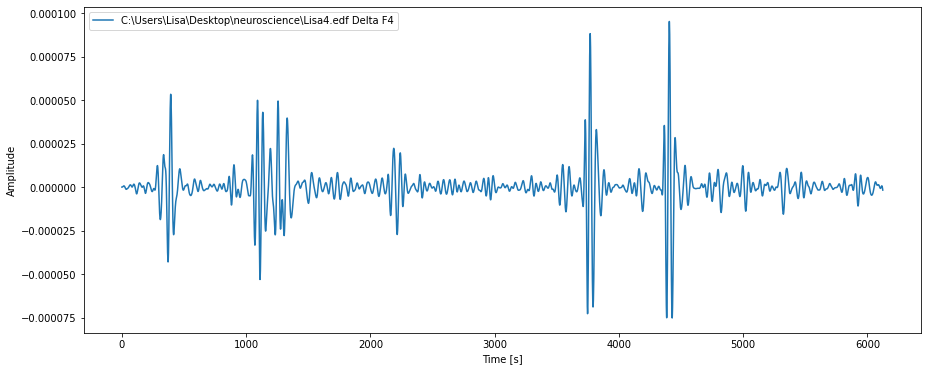

<Figure size 432x288 with 0 Axes>

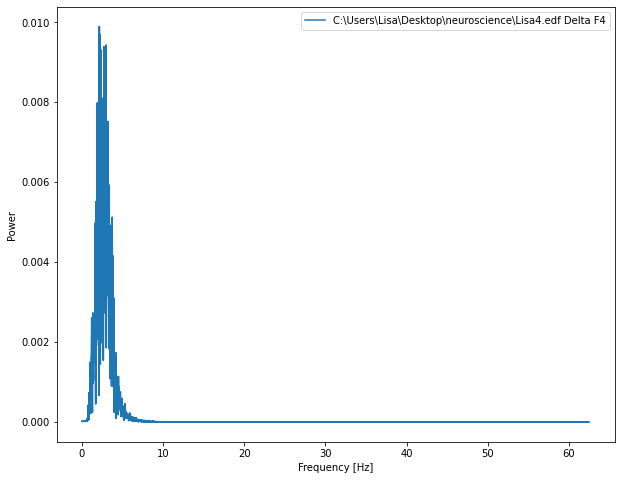

<Figure size 432x288 with 0 Axes>

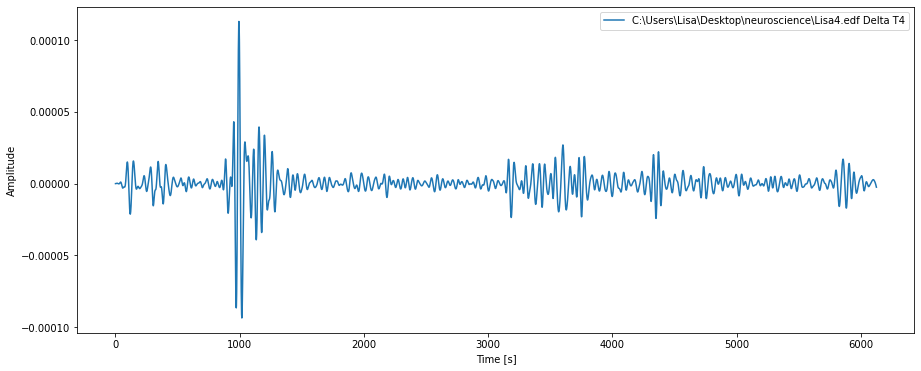

<Figure size 432x288 with 0 Axes>

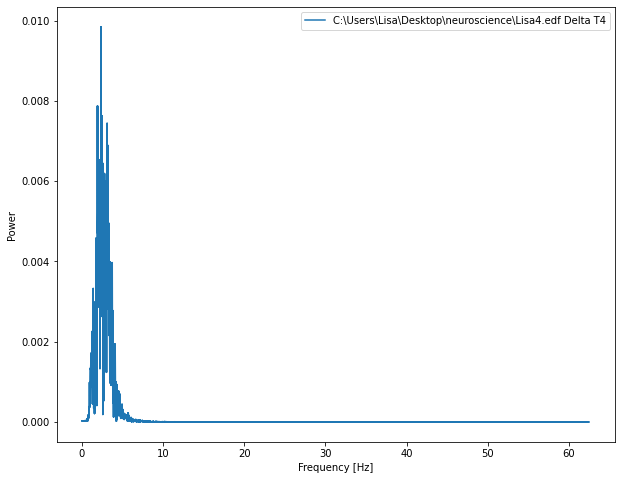

<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.0004


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

12500


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

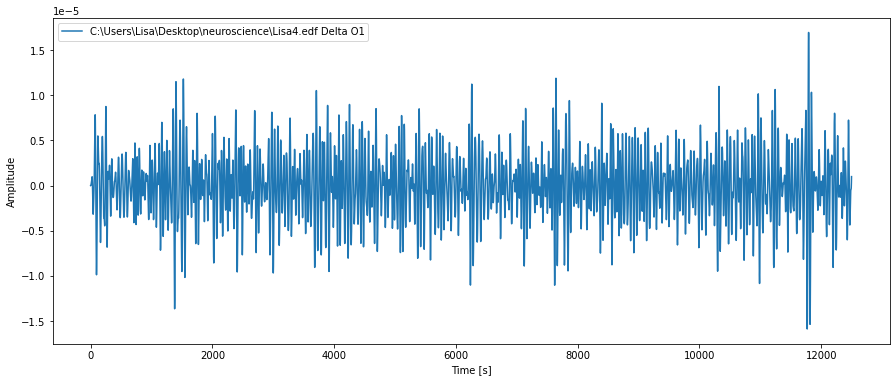

<Figure size 432x288 with 0 Axes>

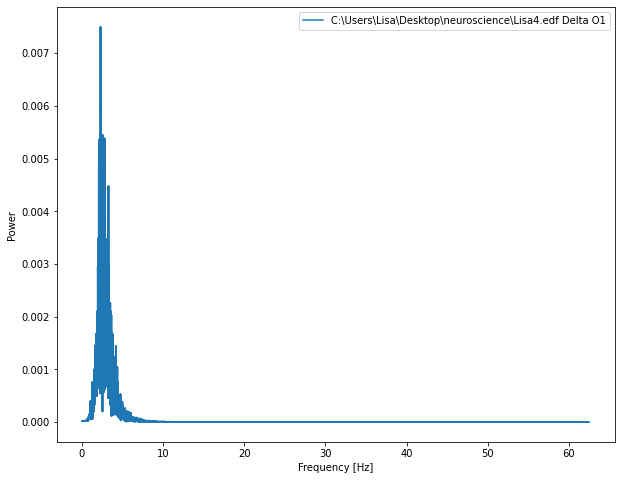

<Figure size 432x288 with 0 Axes>

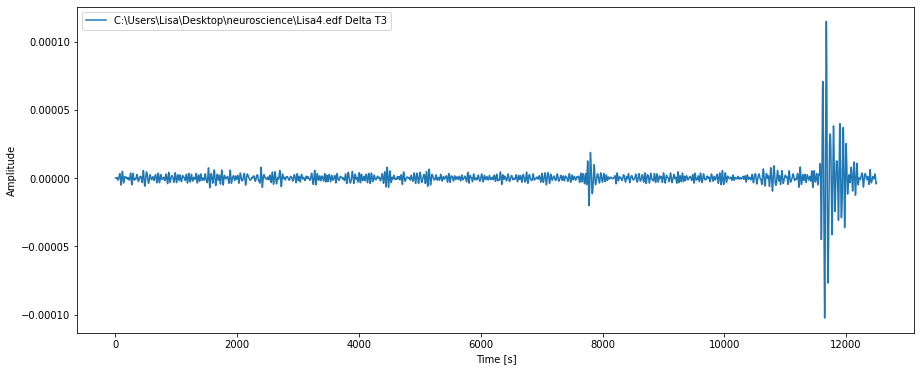

<Figure size 432x288 with 0 Axes>

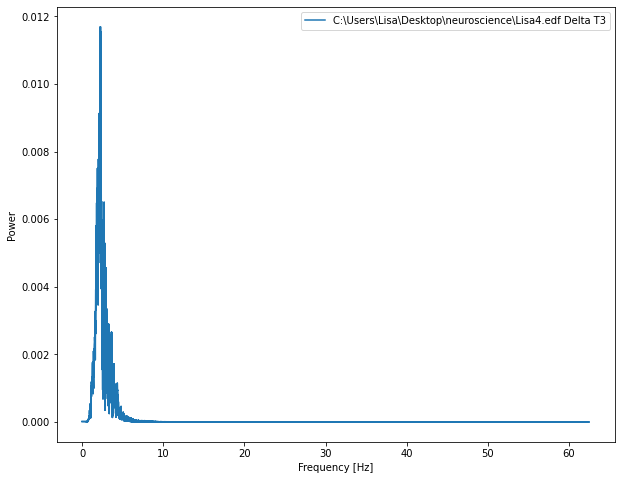

<Figure size 432x288 with 0 Axes>

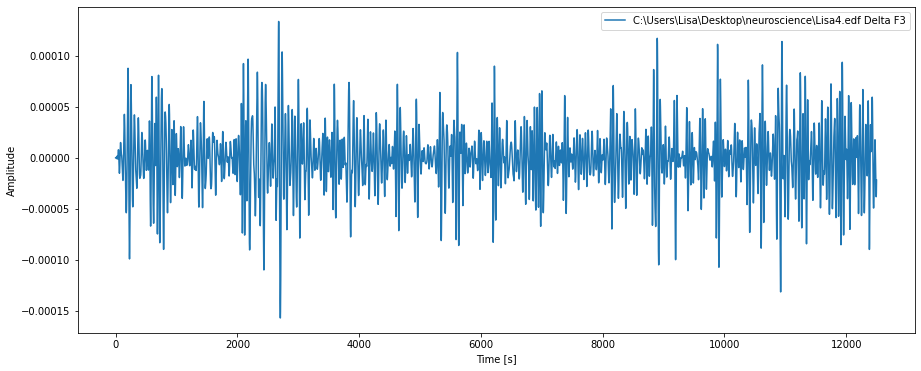

<Figure size 432x288 with 0 Axes>

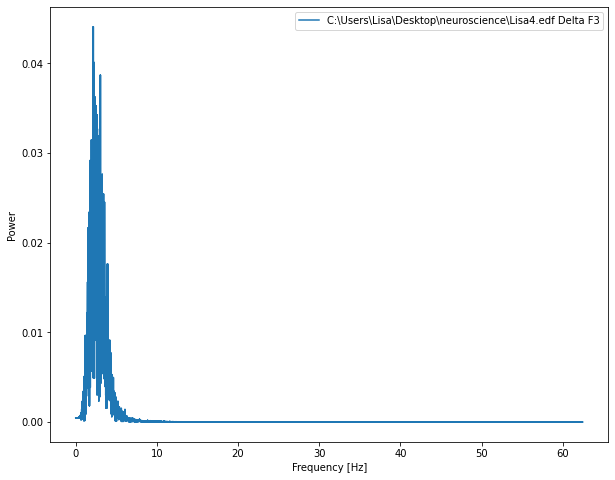

<Figure size 432x288 with 0 Axes>

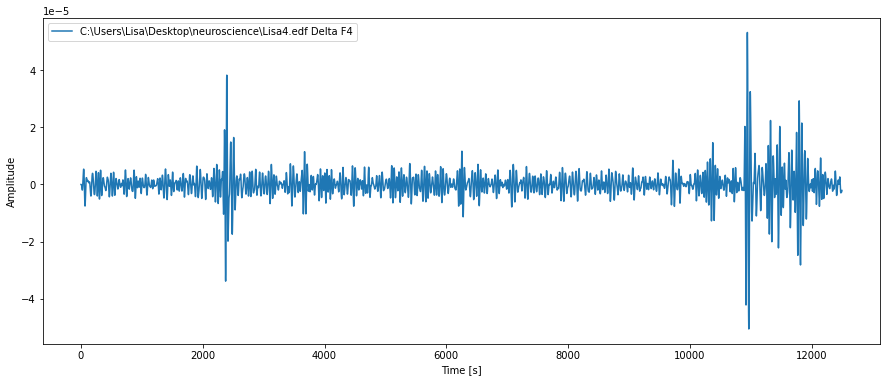

<Figure size 432x288 with 0 Axes>

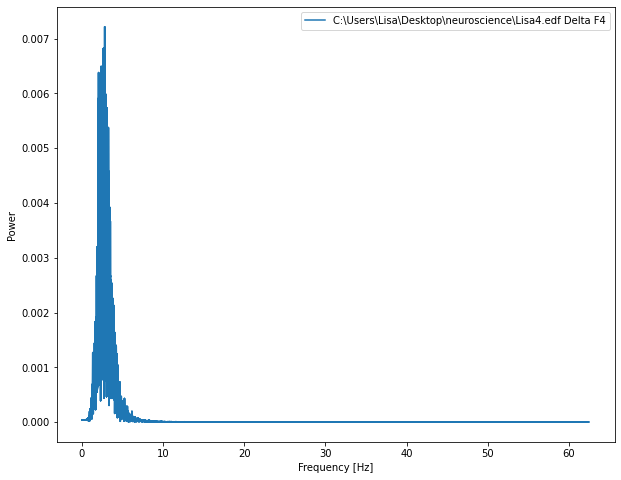

<Figure size 432x288 with 0 Axes>

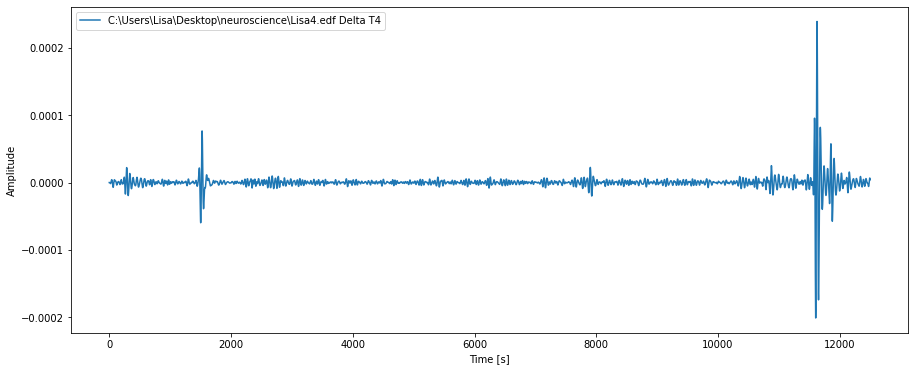

<Figure size 432x288 with 0 Axes>

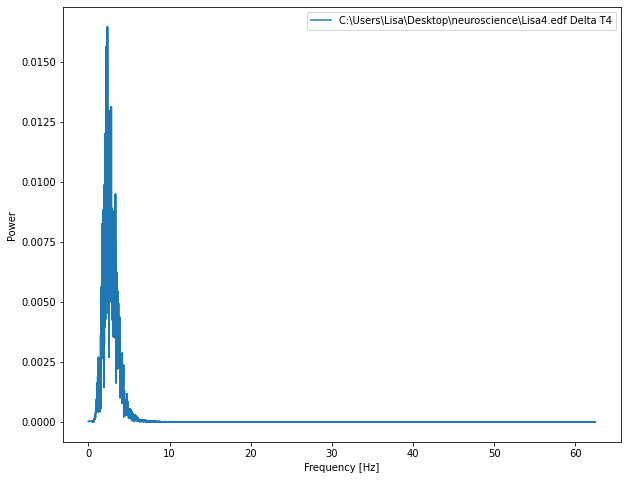

<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>
0.00085


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

8625


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

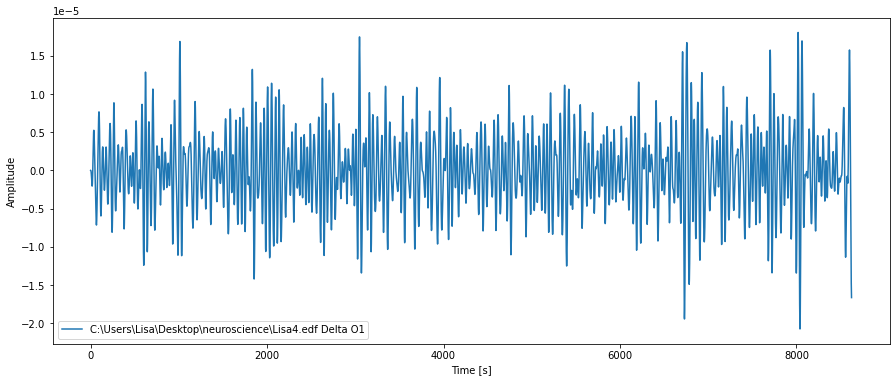

<Figure size 432x288 with 0 Axes>

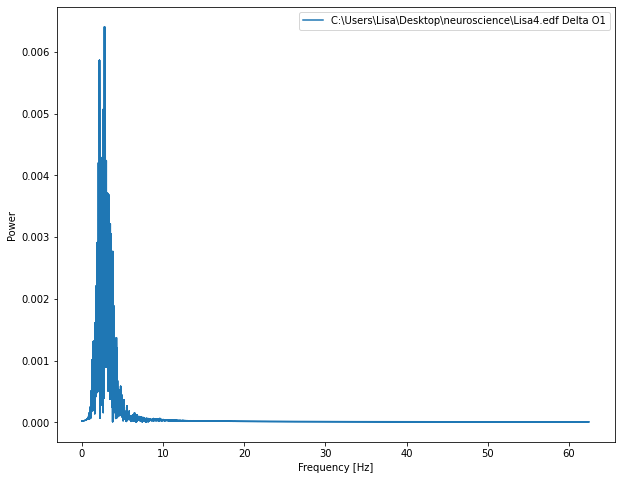

<Figure size 432x288 with 0 Axes>

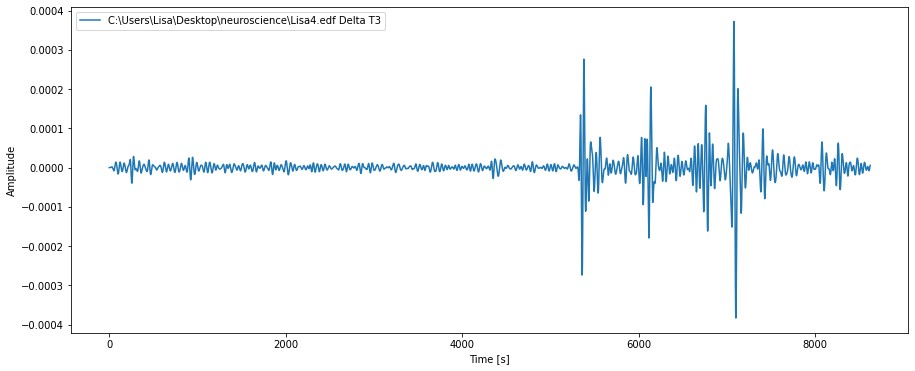

<Figure size 432x288 with 0 Axes>

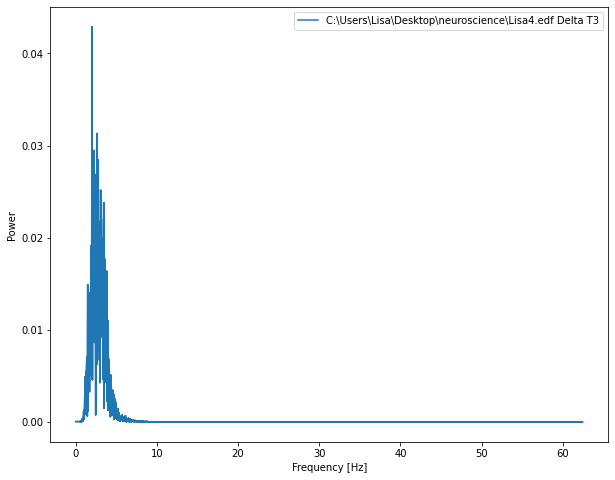

<Figure size 432x288 with 0 Axes>

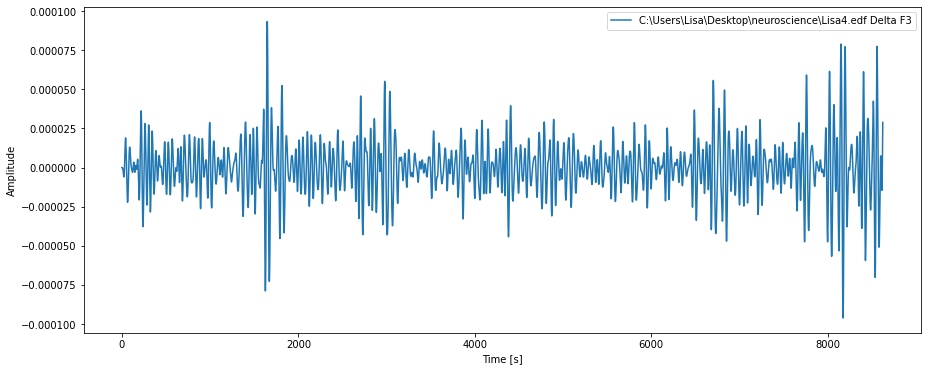

<Figure size 432x288 with 0 Axes>

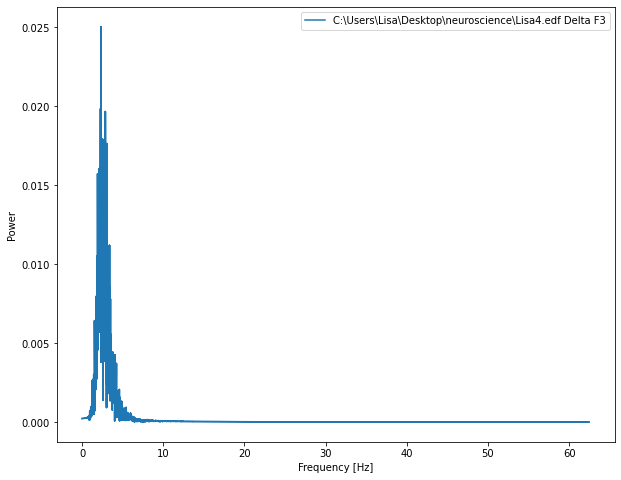

<Figure size 432x288 with 0 Axes>

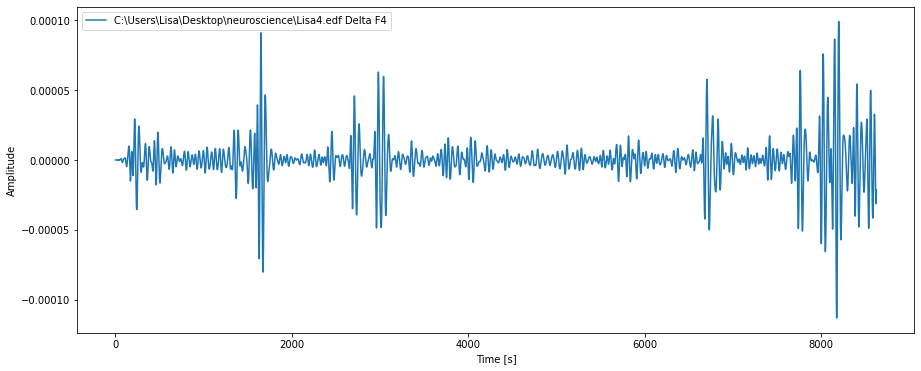

<Figure size 432x288 with 0 Axes>

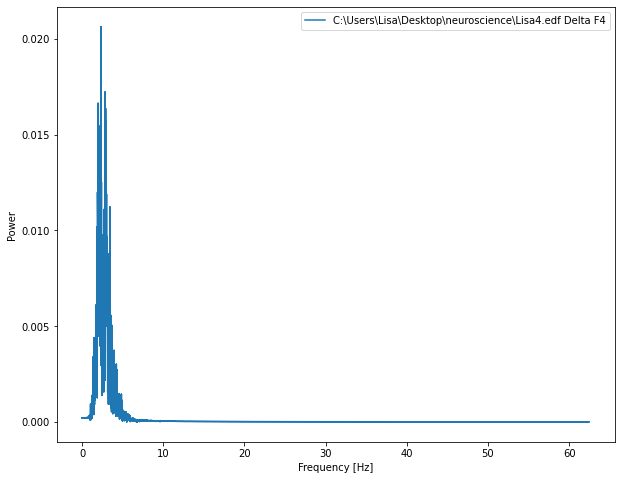

<Figure size 432x288 with 0 Axes>

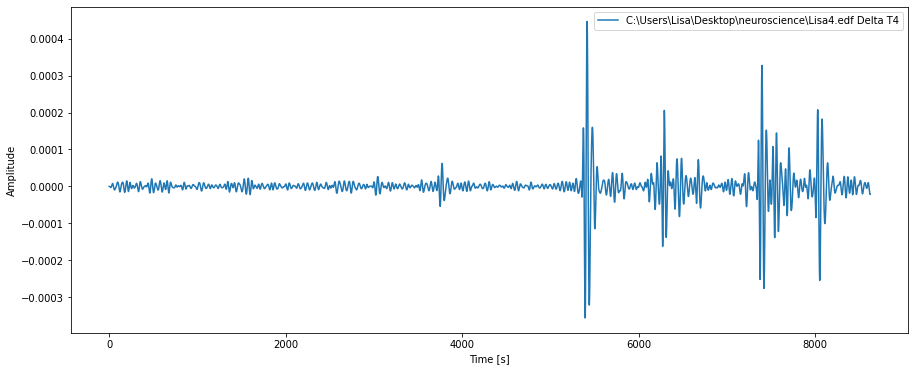

<Figure size 432x288 with 0 Axes>

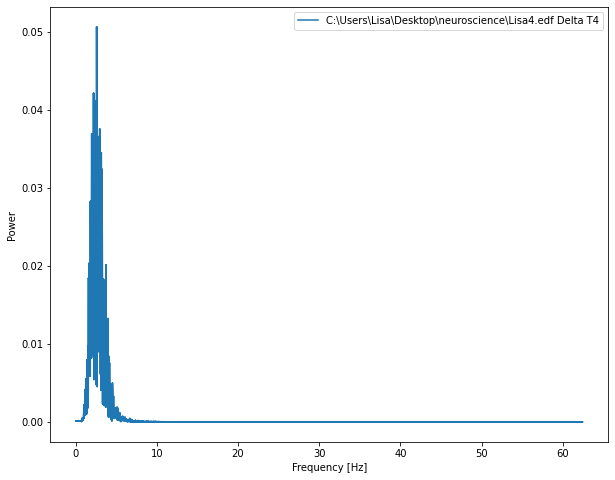

<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>
0.00015


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

7875


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

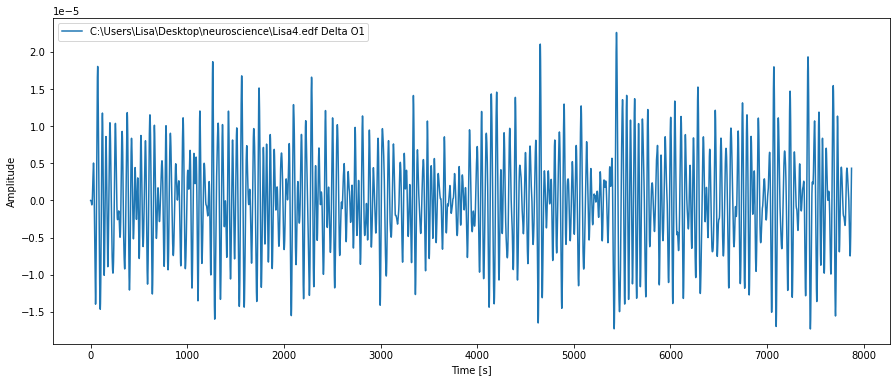

<Figure size 432x288 with 0 Axes>

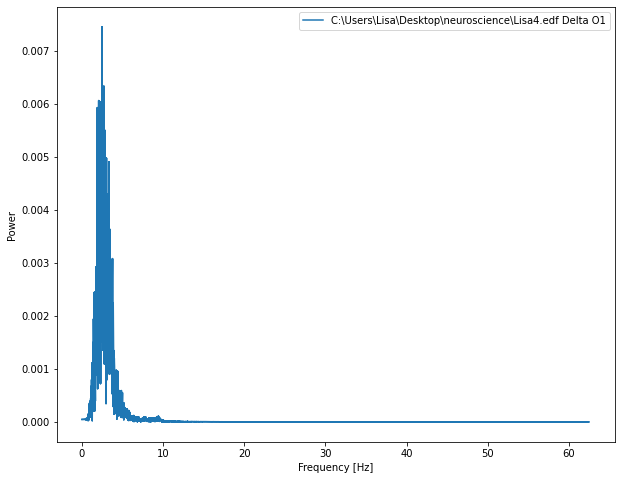

<Figure size 432x288 with 0 Axes>

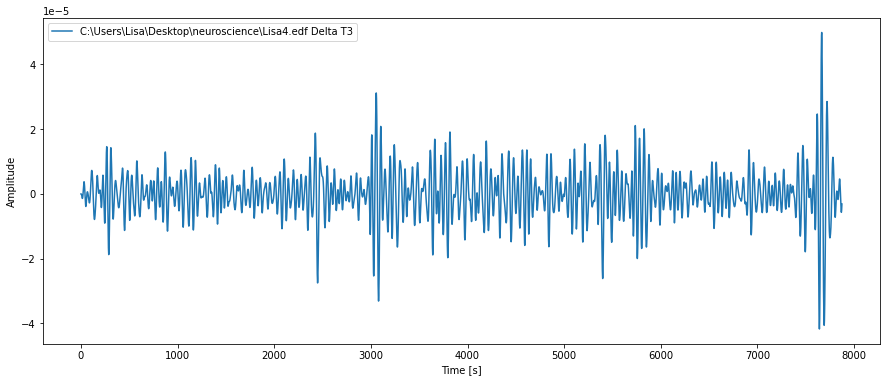

<Figure size 432x288 with 0 Axes>

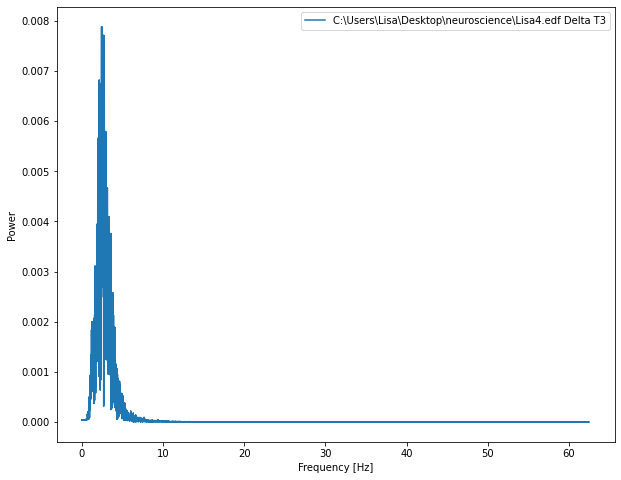

<Figure size 432x288 with 0 Axes>

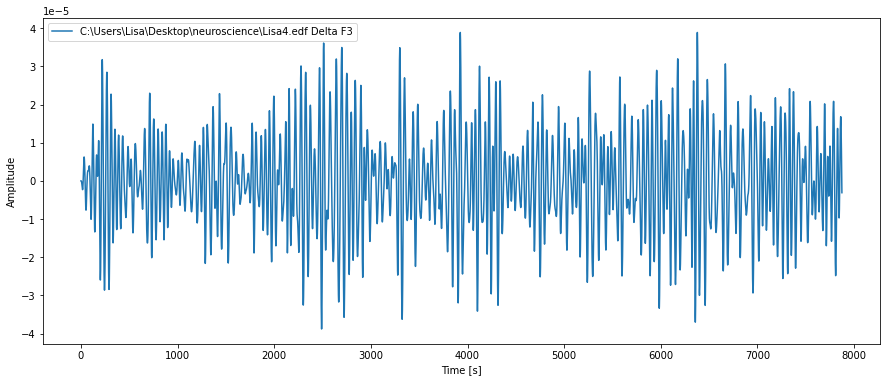

<Figure size 432x288 with 0 Axes>

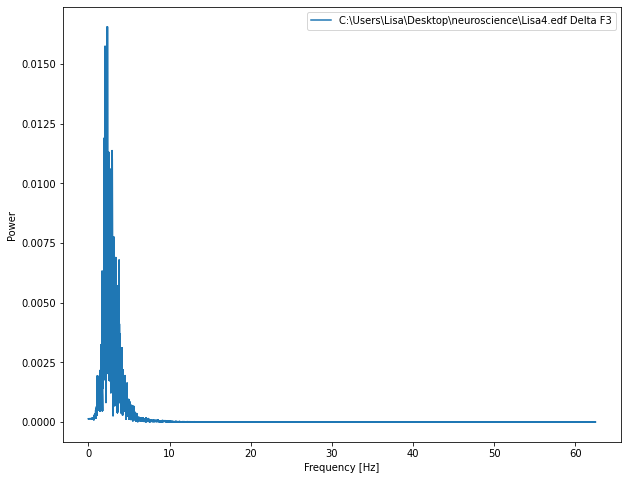

<Figure size 432x288 with 0 Axes>

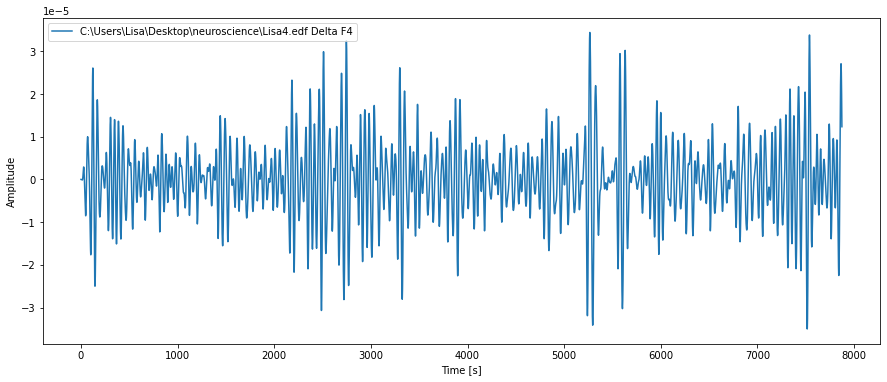

<Figure size 432x288 with 0 Axes>

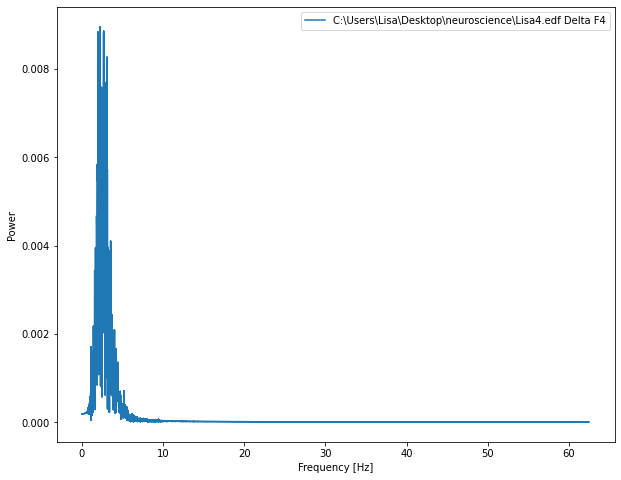

<Figure size 432x288 with 0 Axes>

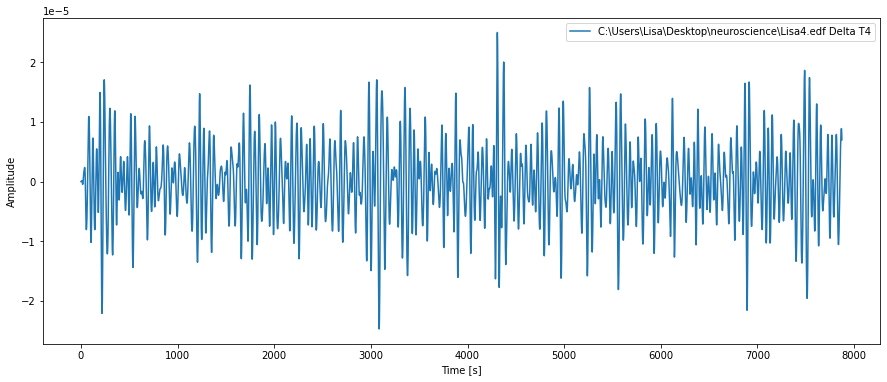

<Figure size 432x288 with 0 Axes>

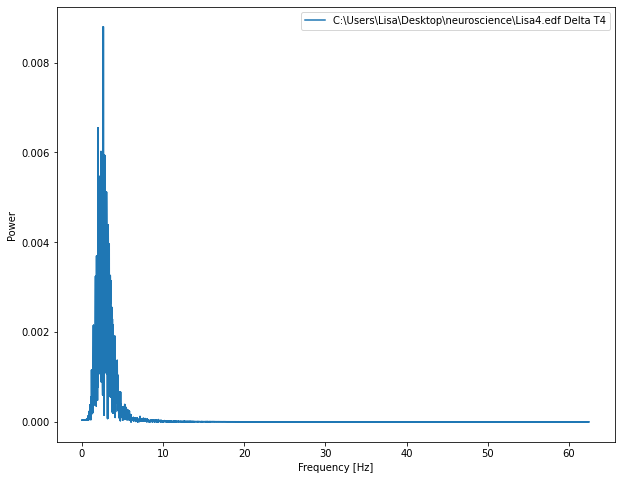

<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>
0.0003


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

10875


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

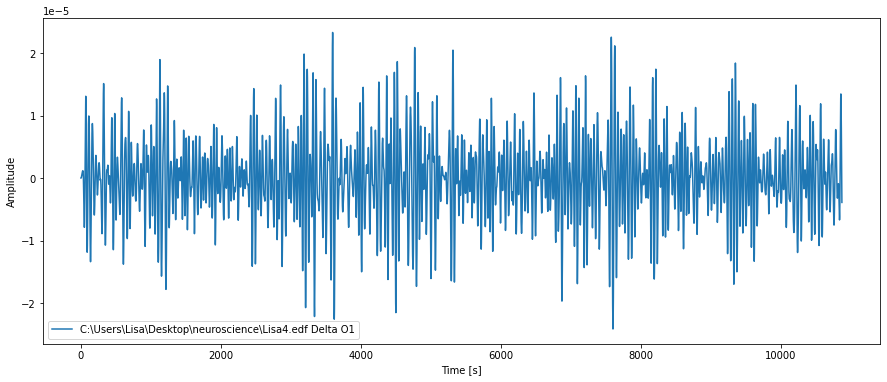

<Figure size 432x288 with 0 Axes>

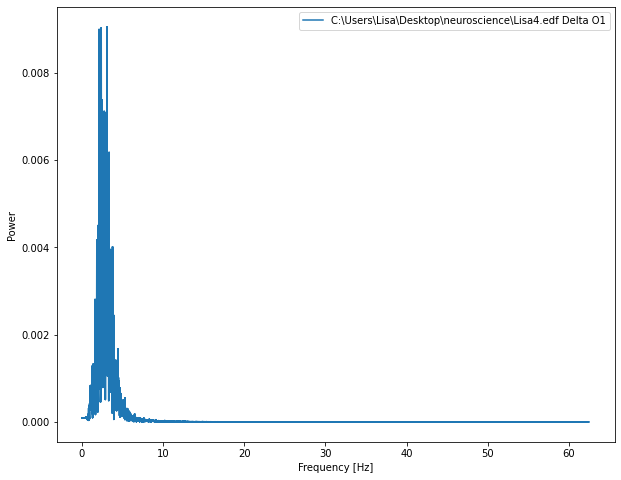

<Figure size 432x288 with 0 Axes>

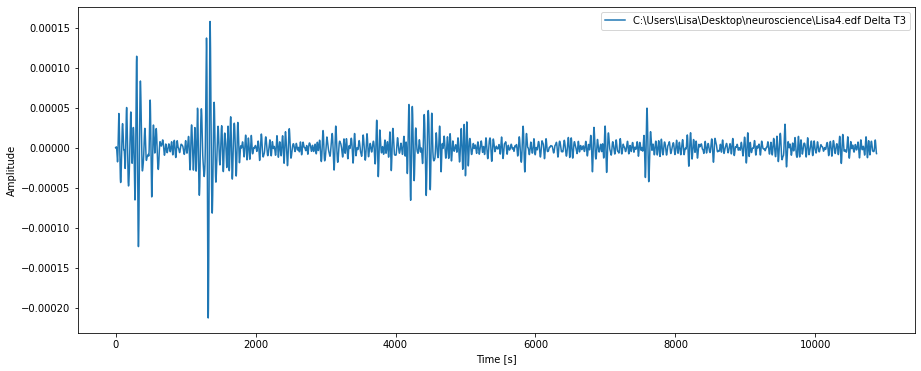

<Figure size 432x288 with 0 Axes>

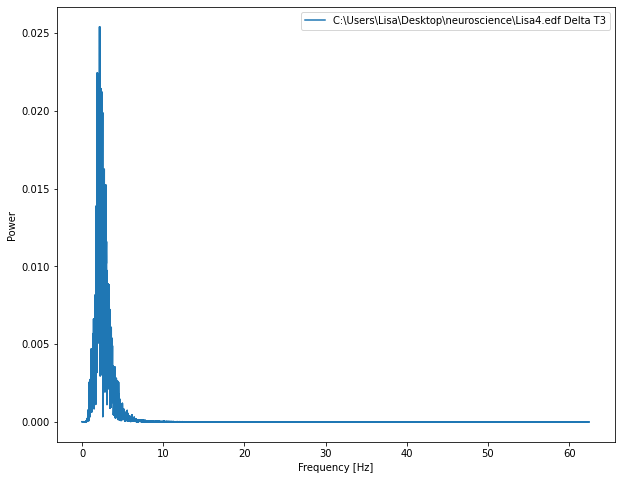

<Figure size 432x288 with 0 Axes>

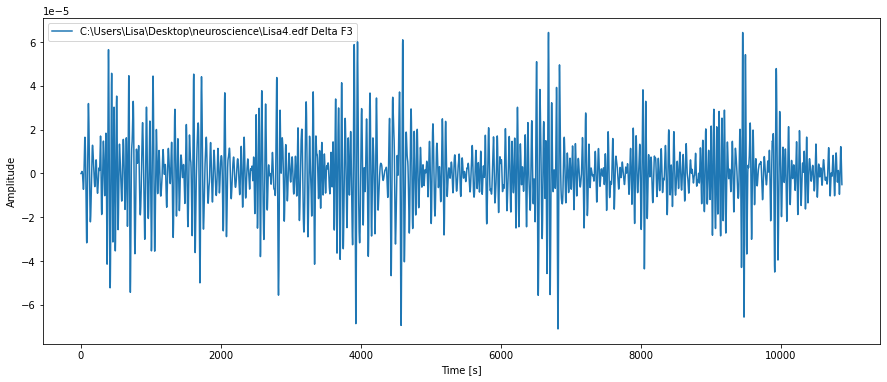

<Figure size 432x288 with 0 Axes>

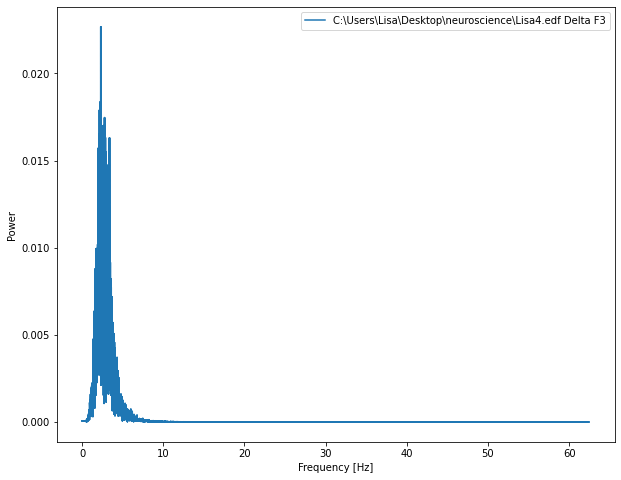

<Figure size 432x288 with 0 Axes>

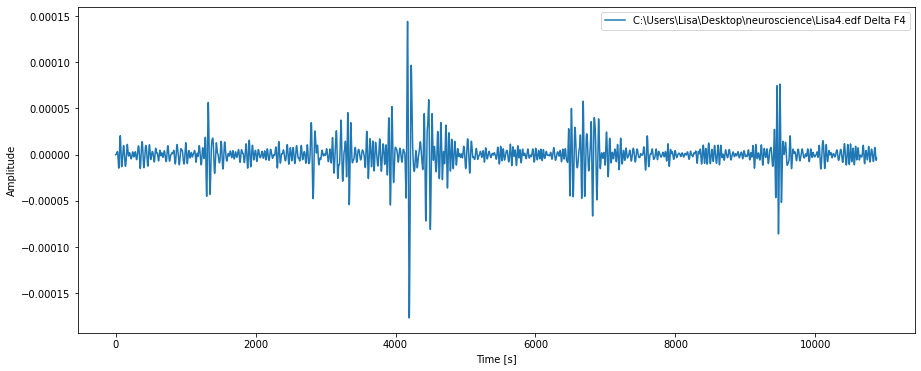

<Figure size 432x288 with 0 Axes>

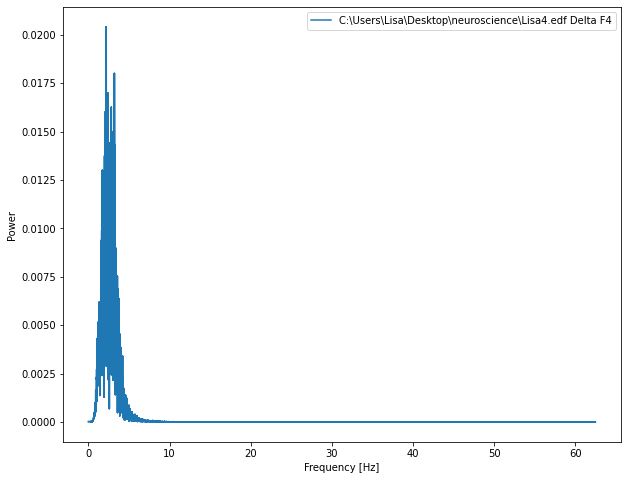

<Figure size 432x288 with 0 Axes>

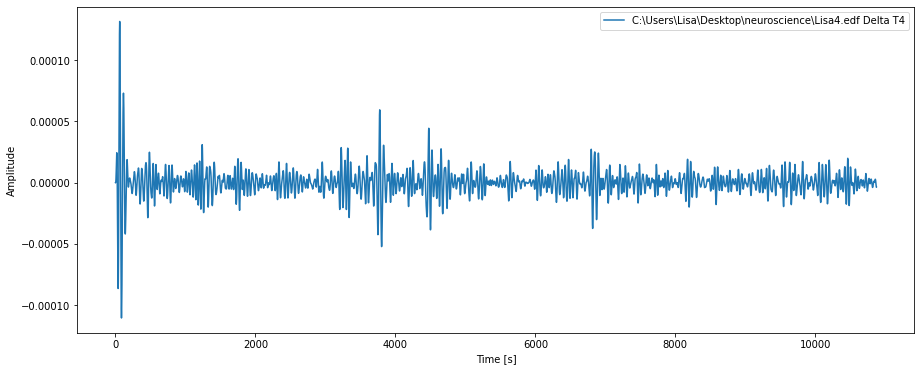

<Figure size 432x288 with 0 Axes>

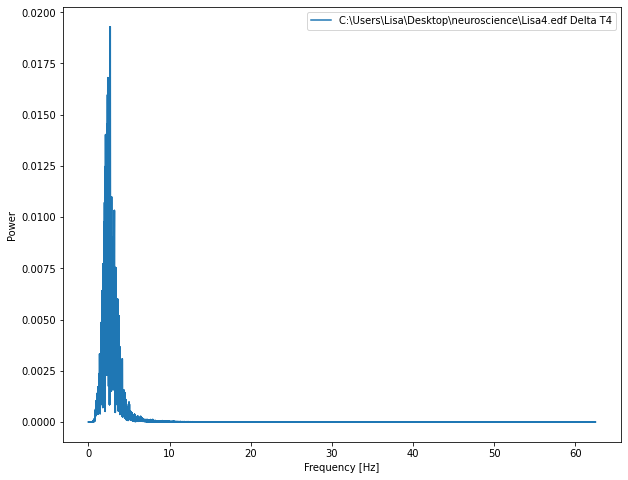

<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.00015


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

9125


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:14: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  alpha_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\485920552.py:16: DeprecationWarning: `np.object` is a deprecated alias for the buil

<Figure size 432x288 with 0 Axes>

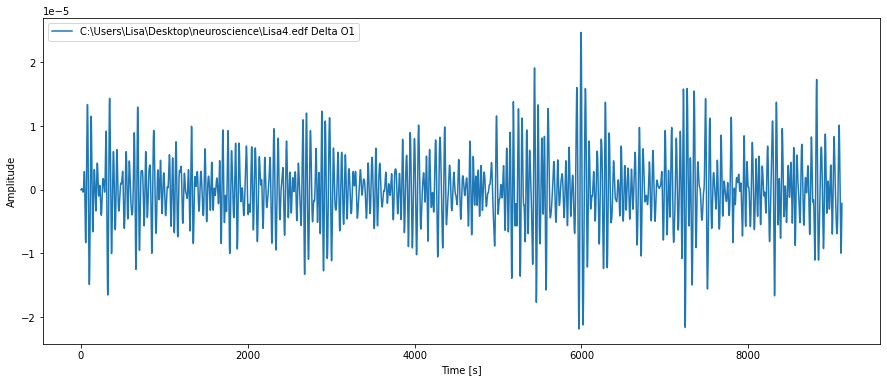

<Figure size 432x288 with 0 Axes>

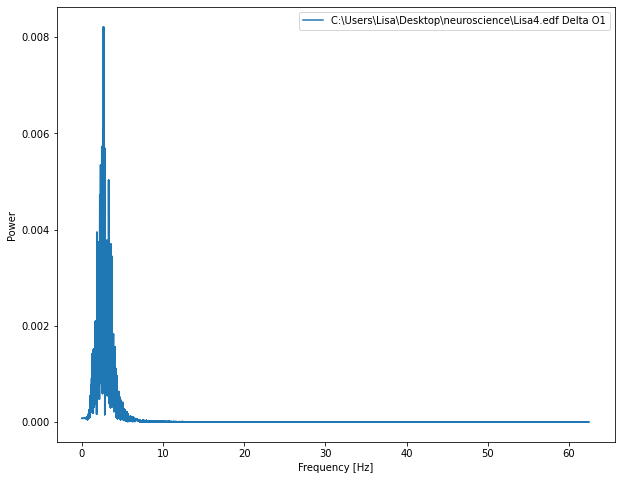

<Figure size 432x288 with 0 Axes>

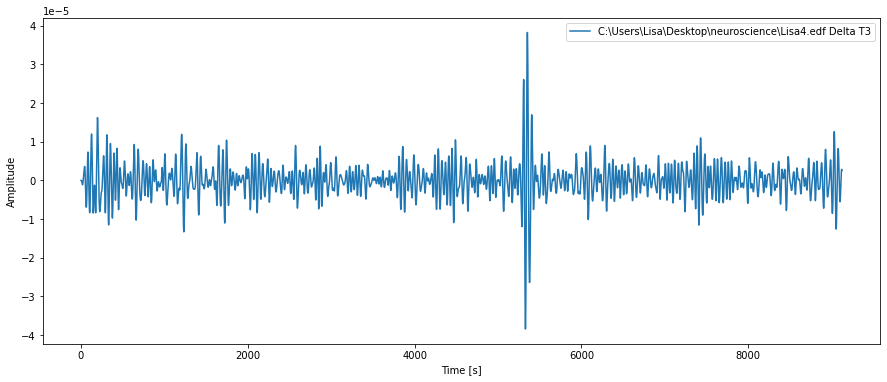

<Figure size 432x288 with 0 Axes>

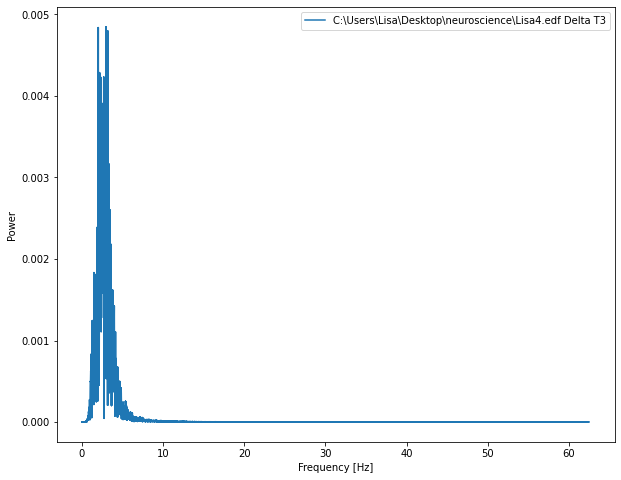

<Figure size 432x288 with 0 Axes>

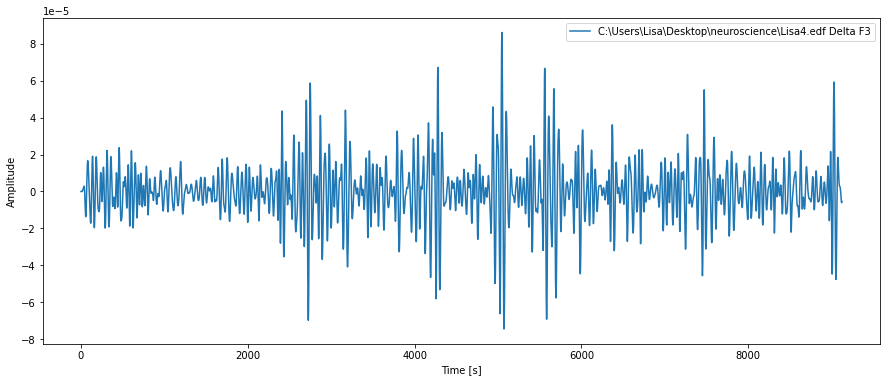

<Figure size 432x288 with 0 Axes>

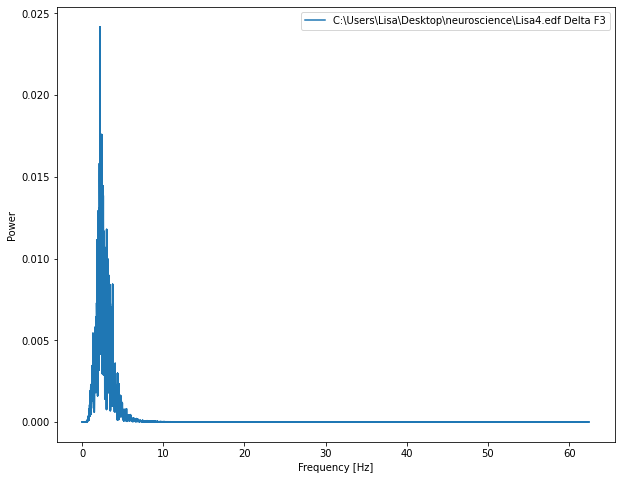

<Figure size 432x288 with 0 Axes>

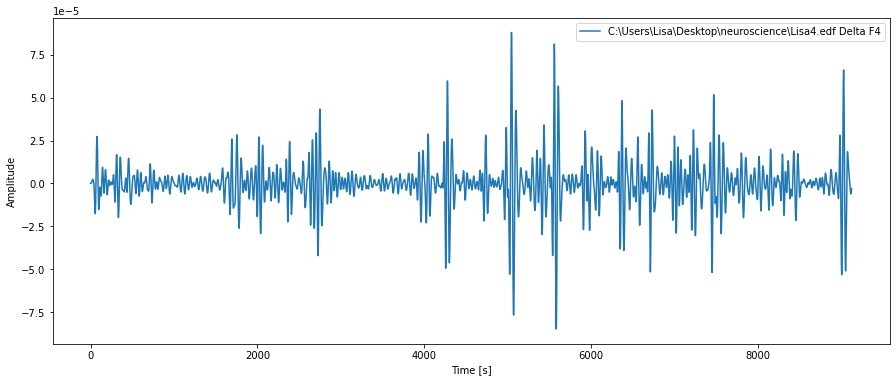

<Figure size 432x288 with 0 Axes>

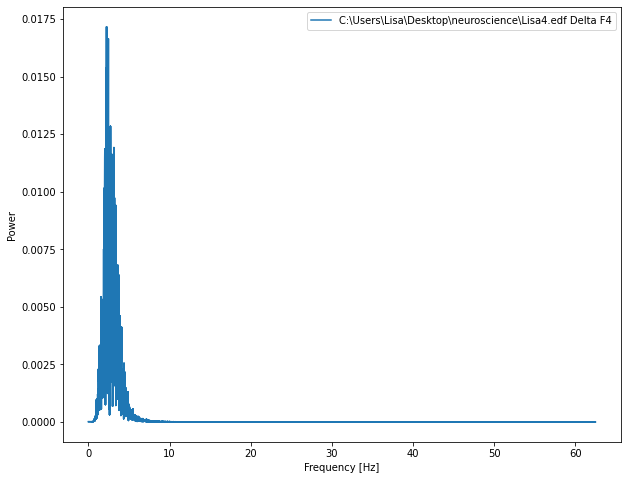

<Figure size 432x288 with 0 Axes>

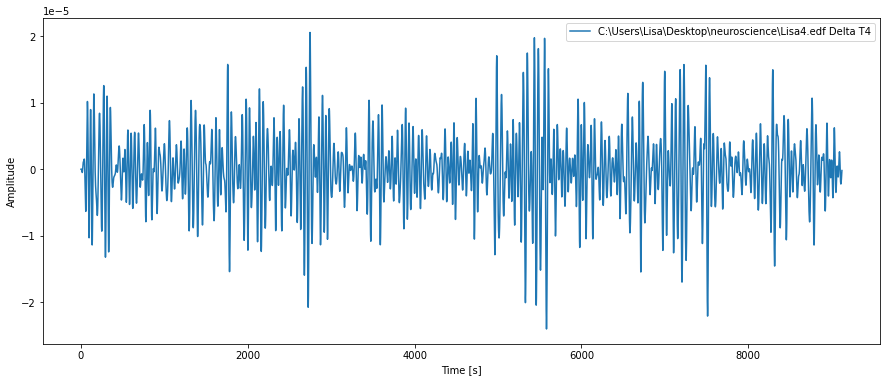

<Figure size 432x288 with 0 Axes>

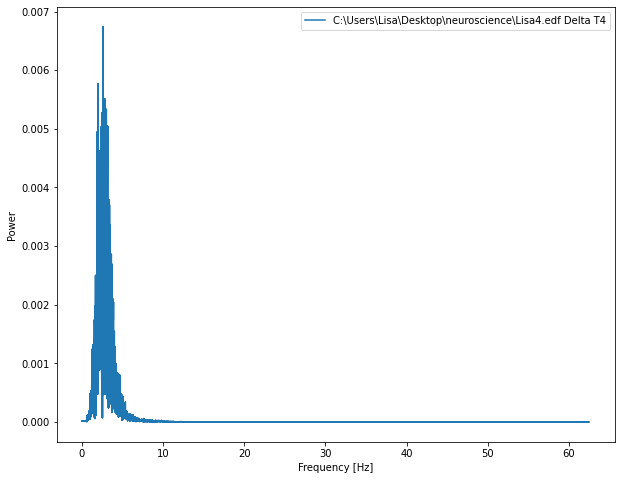

<Figure size 432x288 with 0 Axes>

In [24]:
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    threshhold=float(input())
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[chan]
    length_main = len(new_file_with_record1[0])
    print(length_main)
    file_with_record_main = new_file_with_record1
    sample_rate_main = sample_rate1
    delta_signal = np.empty((nchan,length_main),dtype=np.object)
    theta_signal = np.empty((nchan,length_main),dtype=np.object)
    alpha_signal = np.empty((nchan,length_main),dtype=np.object)
    beta1_signal = np.empty((nchan,length_main),dtype=np.object)
    beta2_signal = np.empty((nchan,length_main),dtype=np.object)
    gamma_signal = np.empty((nchan,length_main),dtype=np.object)
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)
    for chan in range(0,nchan-1):
        draw_signal(delta_signal[chan],length_main,1,filename+' Delta '+raw_mne1.ch_names[chan])
        draw_spectr(delta_signal[chan],sample_rate_main,filename+' Delta '+raw_mne1.ch_names[chan])

In [25]:
# Сначала анализируем первую запись, потом вторую
# Ниже будет часть, который автоматически начнет сравнивать обе записи

## Calculating characteristics

In [26]:
def Total(delta_signal, alpha_signal, theta_signal, beta1_signal, beta2_signal, gamma_signal, length_main):
    Total_Power1 = []
    concentration = []
    meditation = []
    for chan in range(0,nchan-1):
        data1 = alpha_signal[chan]
        data2 = delta_signal[chan]
        data3 = theta_signal[chan]
        data4 = beta1_signal[chan]
        data5 = beta2_signal[chan]
        data6 = gamma_signal[chan]
        dic = dict()
        dic['alpha'] = np.sum(data1**2)/length_main 
        dic['delta'] = np.sum(data2**2)/length_main
        dic['theta'] = np.sum(data3**2)/length_main
        dic['beta1'] = np.sum(data4**2)/length_main
        dic['beta2'] = np.sum(data5**2)/length_main
        dic['gamma'] = np.sum(data6**2)/length_main
        Total_Power1.append(dic)
        concentration.append((dic['beta1']+dic['beta2'])/dic['theta'])
        meditation.append(dic['alpha']/sum(dic.values()))
        
    good = Total_Power1[3]['alpha']/Total_Power1[2]['alpha']
    return good, concentration, meditation


In [32]:
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    threshhold=float(input())
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[chan]
    length_main = len(new_file_with_record1[0])
    print(length_main)
    file_with_record_main = new_file_with_record1
    delta_signal = np.empty((nchan,length_main),dtype=np.object)
    theta_signal = np.empty((nchan,length_main),dtype=np.object)
    alpha_signal = np.empty((nchan,length_main),dtype=np.object)
    beta1_signal = np.empty((nchan,length_main),dtype=np.object)
    beta2_signal = np.empty((nchan,length_main),dtype=np.object)
    gamma_signal = np.empty((nchan,length_main),dtype=np.object)
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)
    good1, conc1, meditation1 = Total(delta_signal, alpha_signal, theta_signal, beta1_signal, beta2_signal, gamma_signal, length_main)
    print('good', good1)
    print('концентрация', conc1)
    print('медитация', meditation1)

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
0.0004


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

8500
good 0.02016387373647732
концентрация [1.7683512905198773, 2.253463769835123, 0.5546317281207267, 0.491262068833933, 2.303302545593792]
медитация [0.244231980576995, 0.14762428124056032, 0.18756430920218933, 0.11001899649161168, 0.13712567071271514]
<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
0.0007
7750
good 0.016592756338896543
концентрация [2.5463043630898303, 1.7899816987537691, 0.9252539633646399, 1.2400645241354067, 1.1107769726091492]
медитация [0.8002047908589113, 0.34443291679407934, 0.22665725426161737, 0.35184464214499395, 0.23825673721779653]
<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
0.0002
6125
good 0.051060851152515616
концентрация [1.9304347319337392, 0.7468846669500031, 1.007977665985886, 0.24689619060162663, 0.943017371114283]
медитация [0.5073373668357474, 0.1233921756349741, 0.19029309336447284, 0.089463135921247, 0.08558543611108345]
<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.0004
12500
good 0.02499

## Comparison of samples

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
0.0004


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


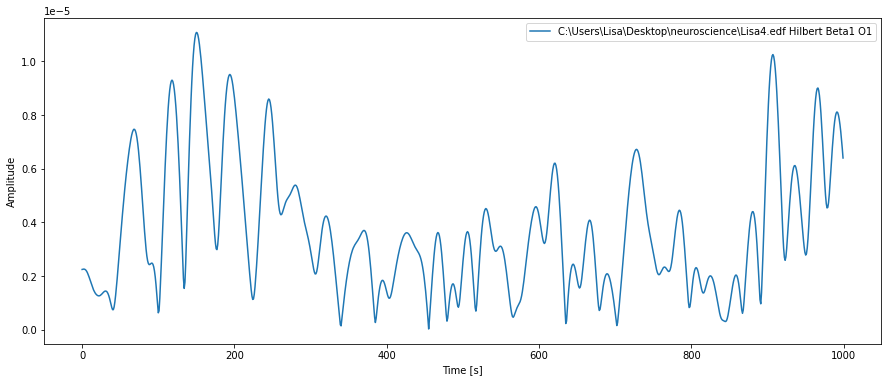

<Figure size 432x288 with 0 Axes>

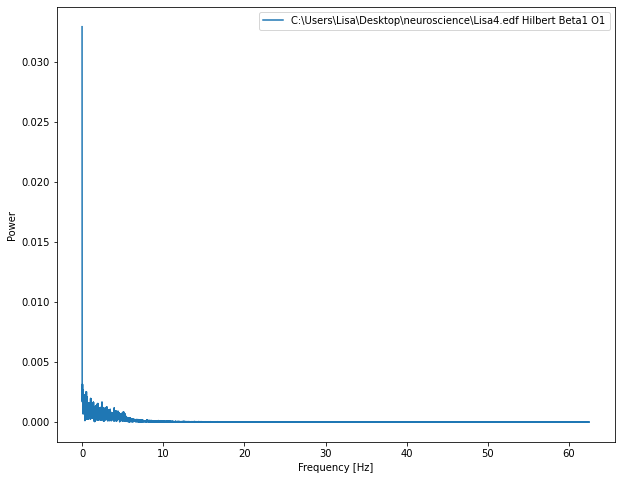

<Figure size 432x288 with 0 Axes>

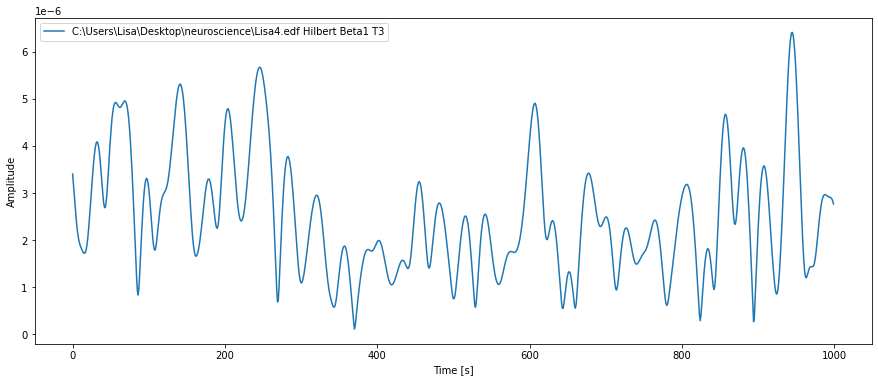

<Figure size 432x288 with 0 Axes>

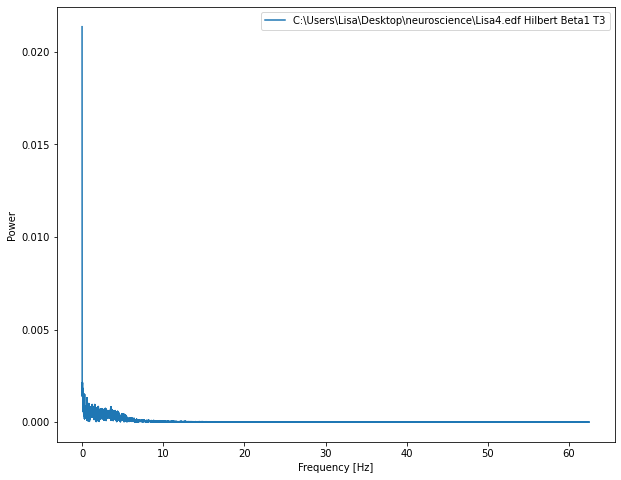

<Figure size 432x288 with 0 Axes>

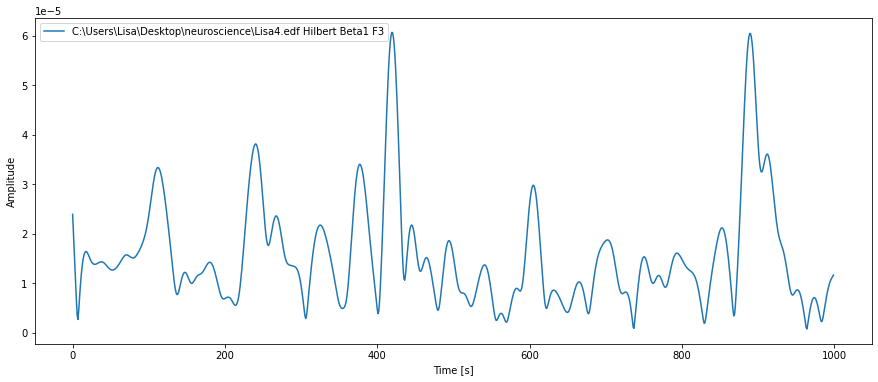

<Figure size 432x288 with 0 Axes>

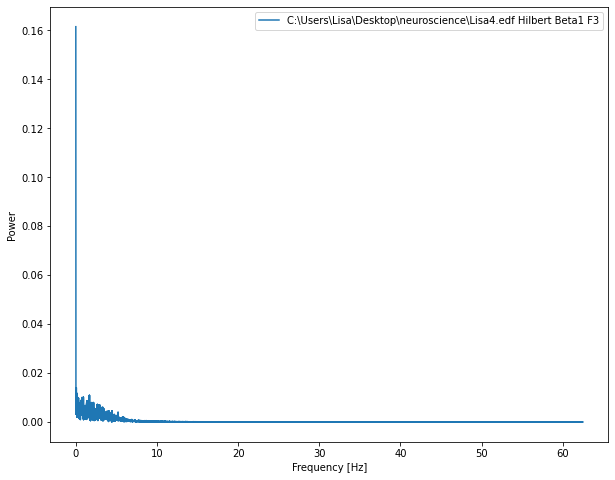

<Figure size 432x288 with 0 Axes>

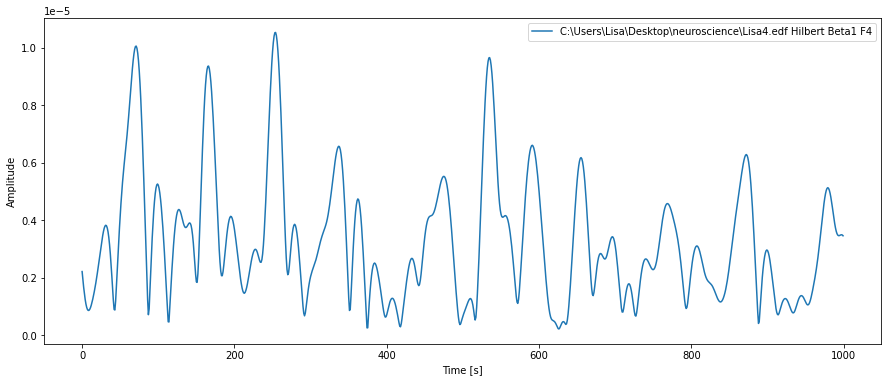

<Figure size 432x288 with 0 Axes>

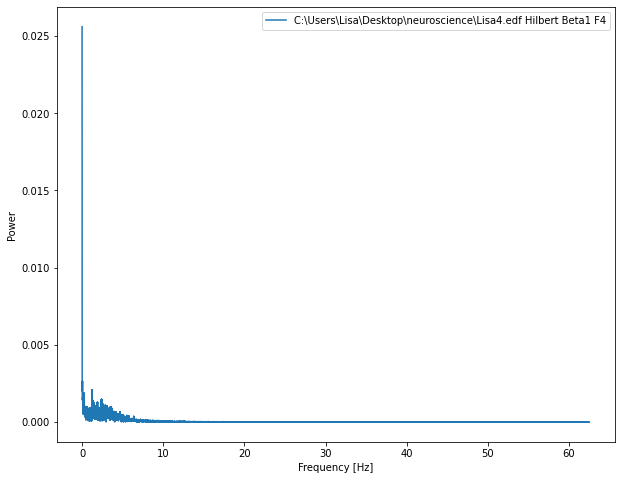

<Figure size 432x288 with 0 Axes>

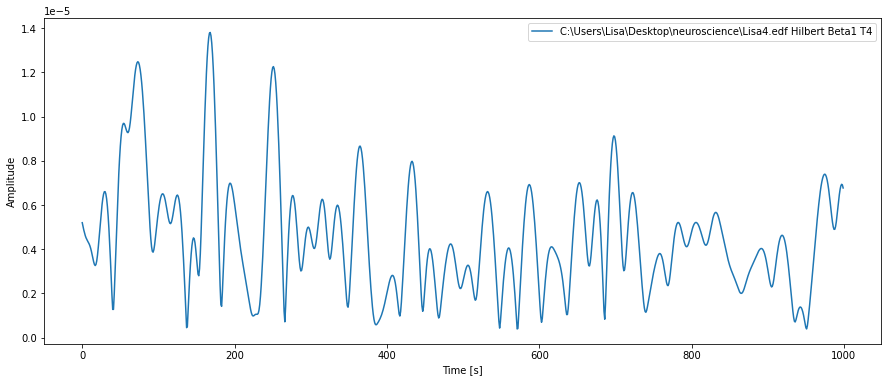

<Figure size 432x288 with 0 Axes>

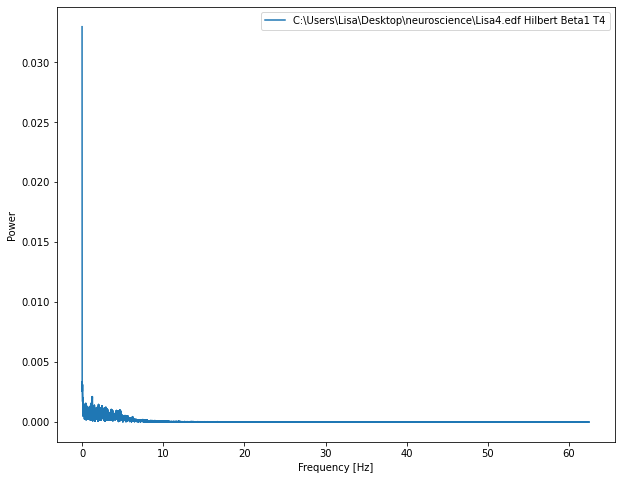

<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
0.0007


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


<Figure size 432x288 with 0 Axes>

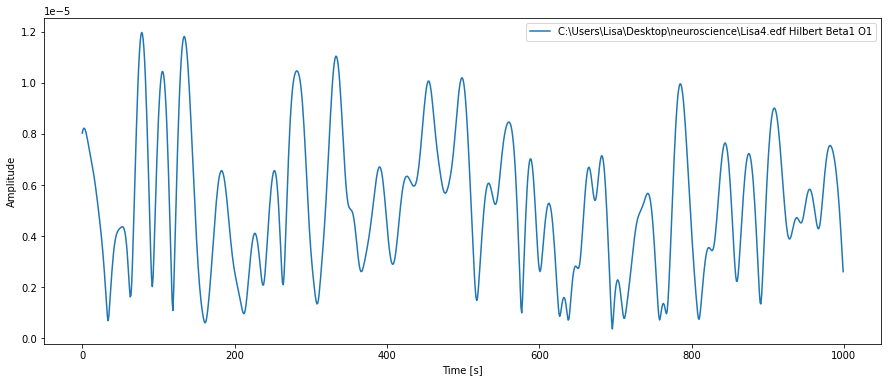

<Figure size 432x288 with 0 Axes>

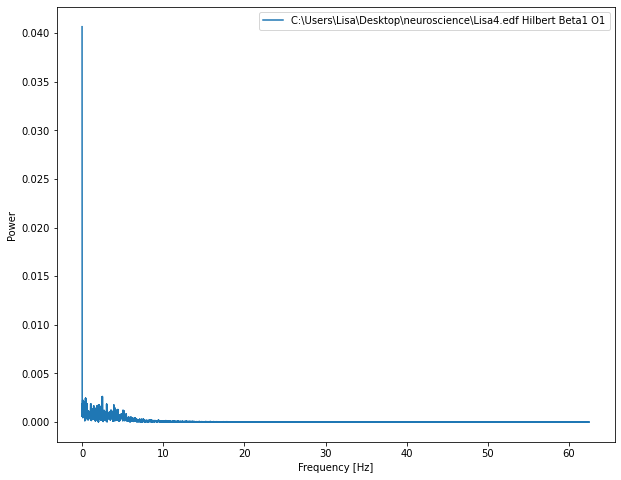

<Figure size 432x288 with 0 Axes>

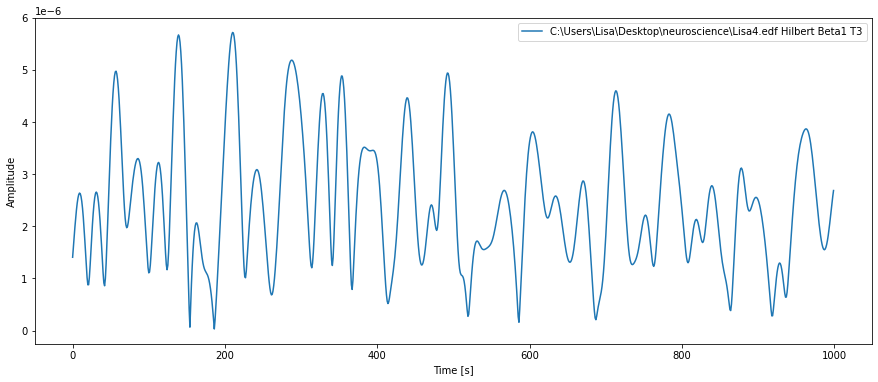

<Figure size 432x288 with 0 Axes>

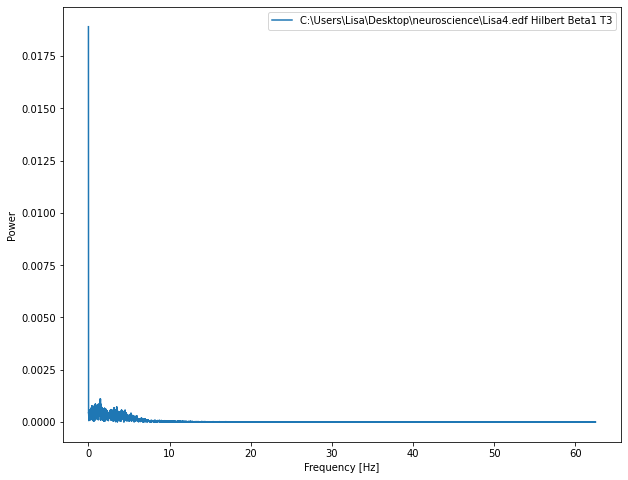

<Figure size 432x288 with 0 Axes>

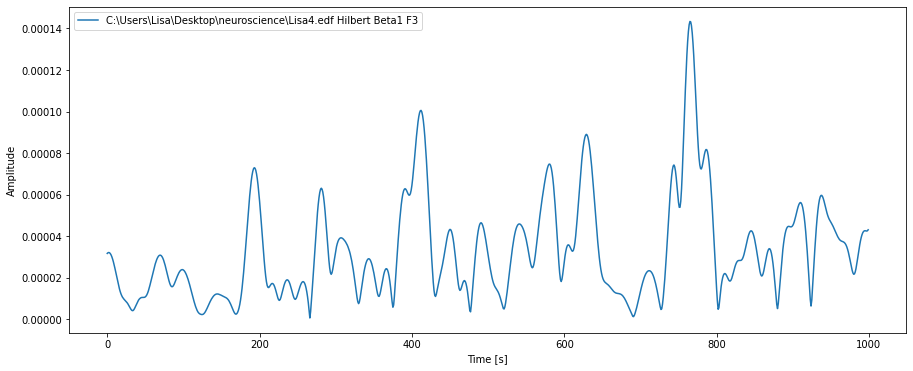

<Figure size 432x288 with 0 Axes>

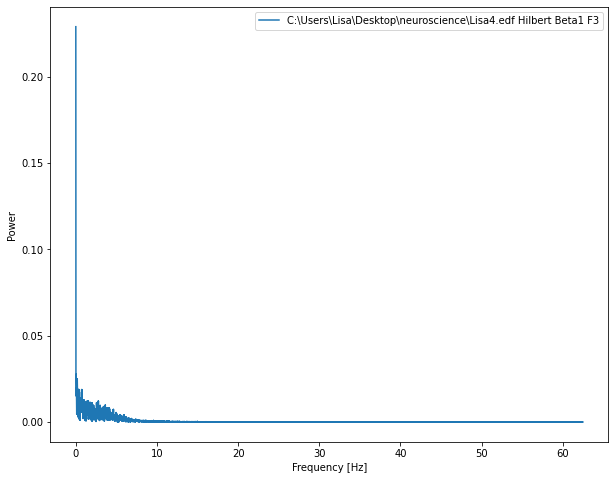

<Figure size 432x288 with 0 Axes>

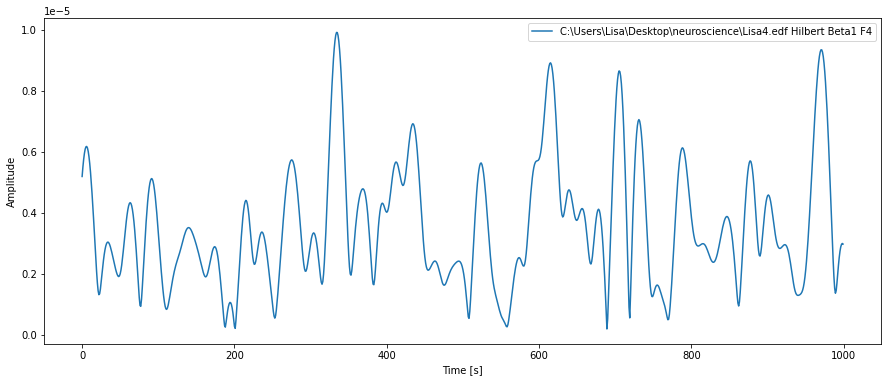

<Figure size 432x288 with 0 Axes>

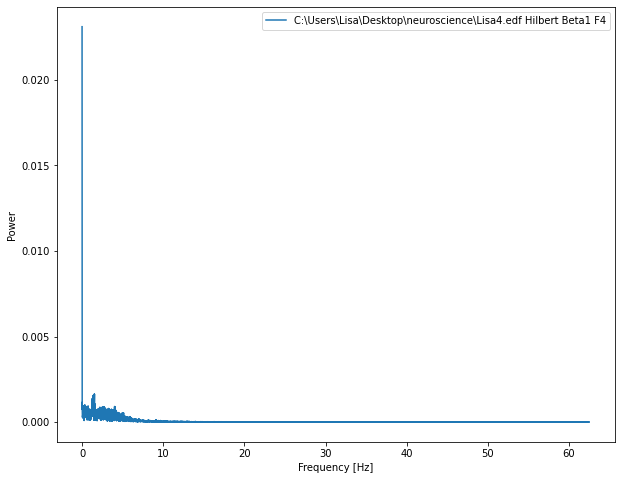

<Figure size 432x288 with 0 Axes>

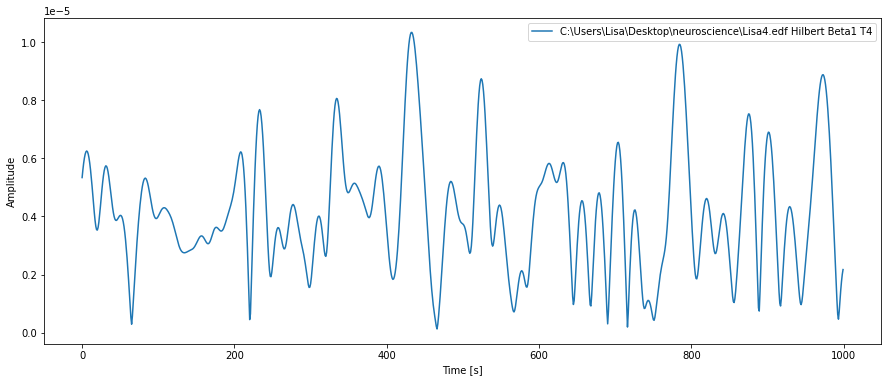

<Figure size 432x288 with 0 Axes>

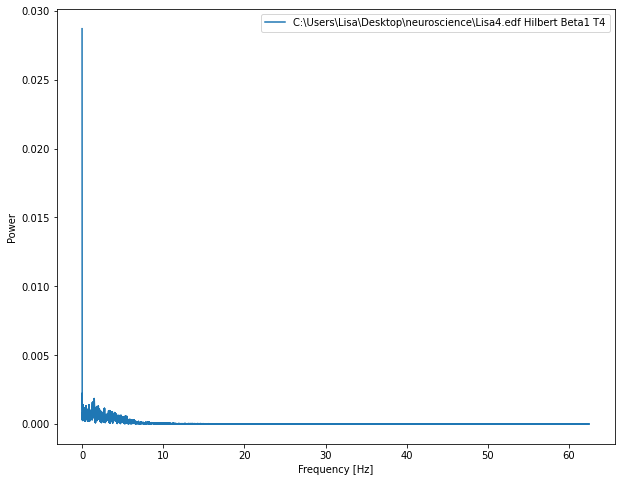

<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
0.0002
Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

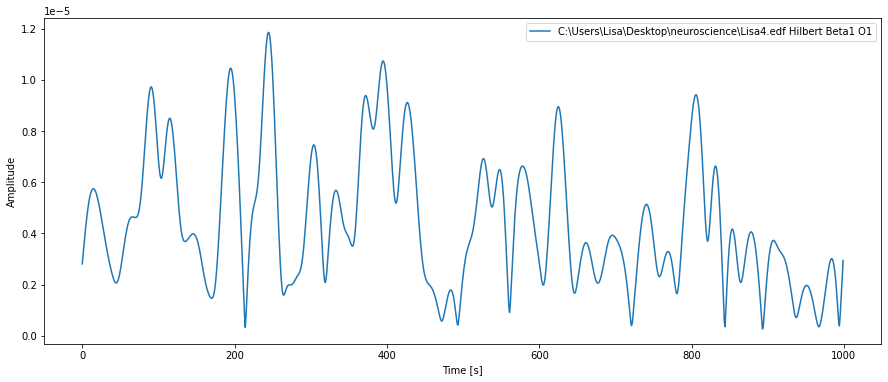

<Figure size 432x288 with 0 Axes>

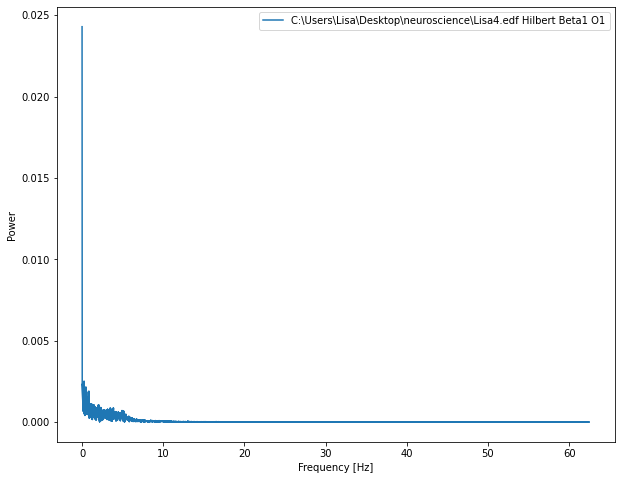

<Figure size 432x288 with 0 Axes>

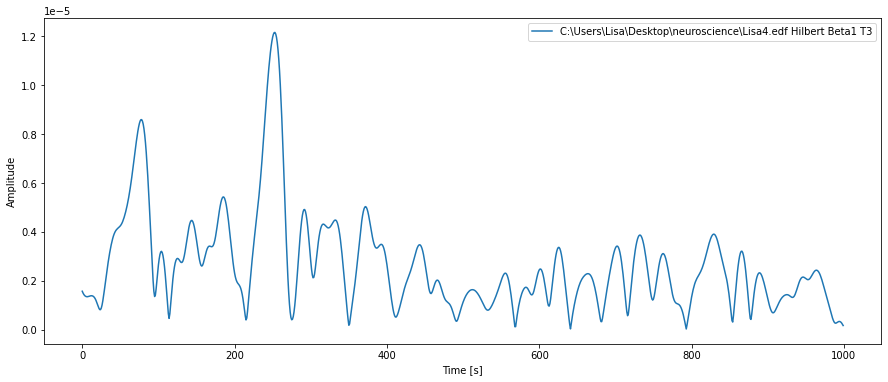

<Figure size 432x288 with 0 Axes>

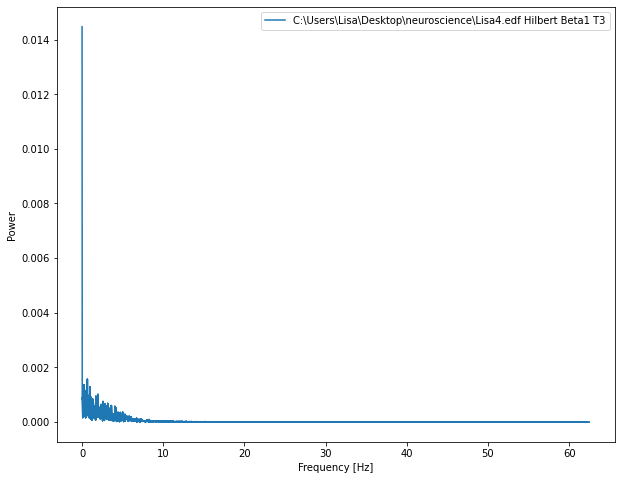

<Figure size 432x288 with 0 Axes>

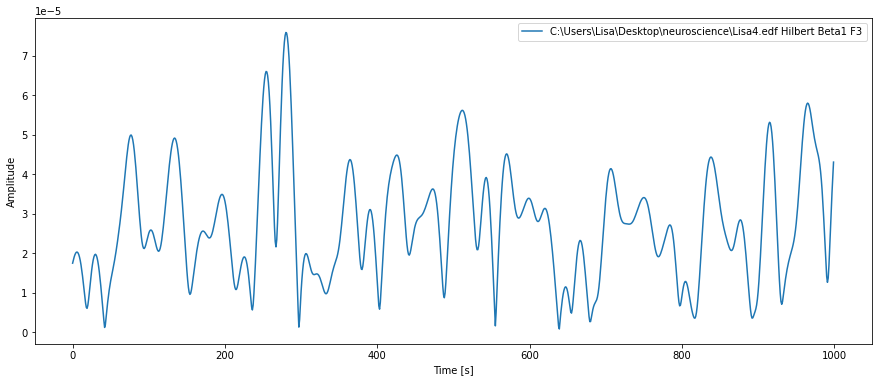

<Figure size 432x288 with 0 Axes>

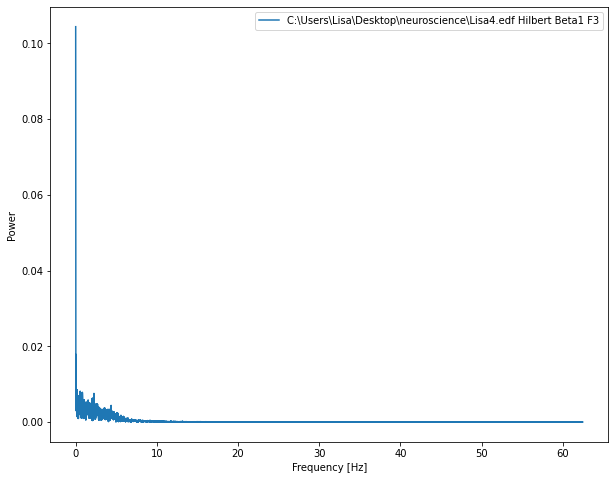

<Figure size 432x288 with 0 Axes>

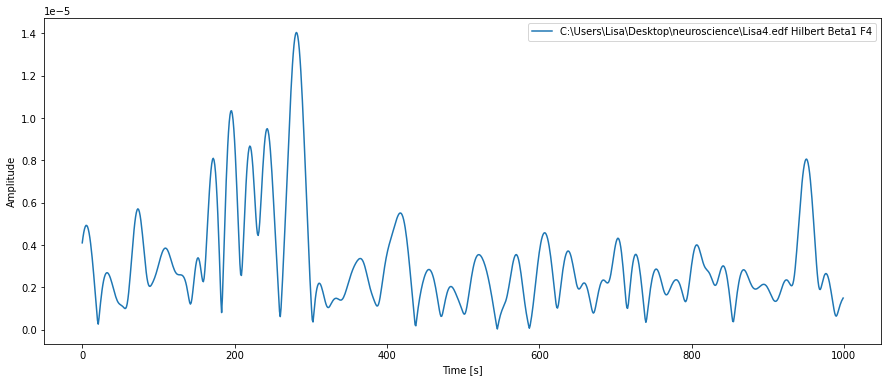

<Figure size 432x288 with 0 Axes>

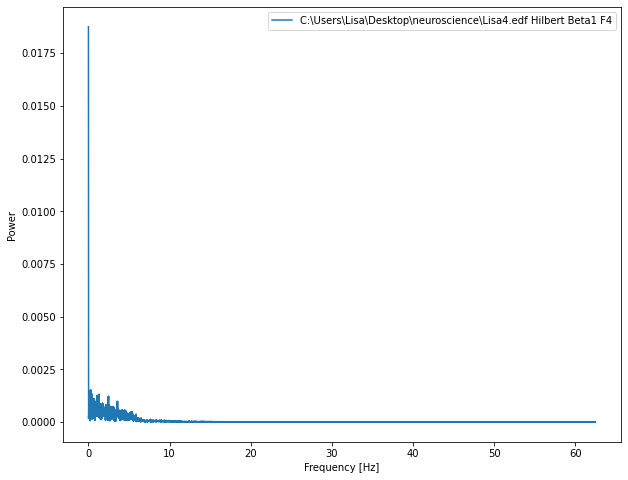

<Figure size 432x288 with 0 Axes>

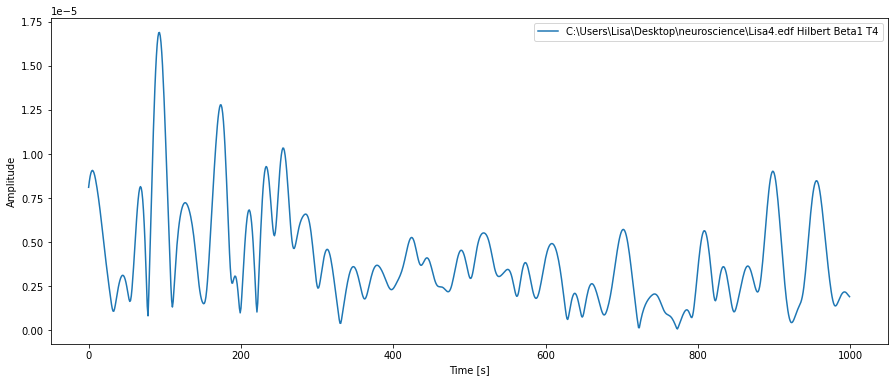

<Figure size 432x288 with 0 Axes>

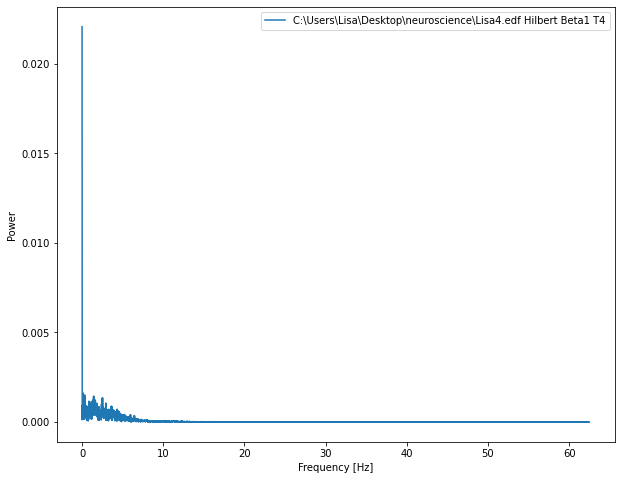

<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.0004


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:11: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  delta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:12: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  theta_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:14: DeprecationWarning: `np.object` is a deprecated alias for the b

<Figure size 432x288 with 0 Axes>

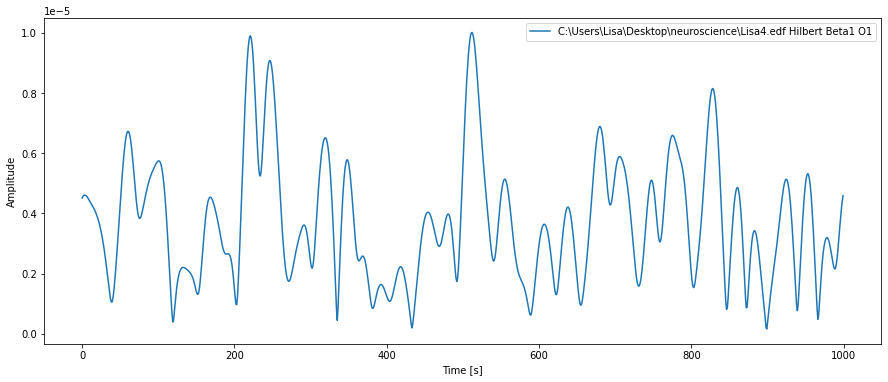

<Figure size 432x288 with 0 Axes>

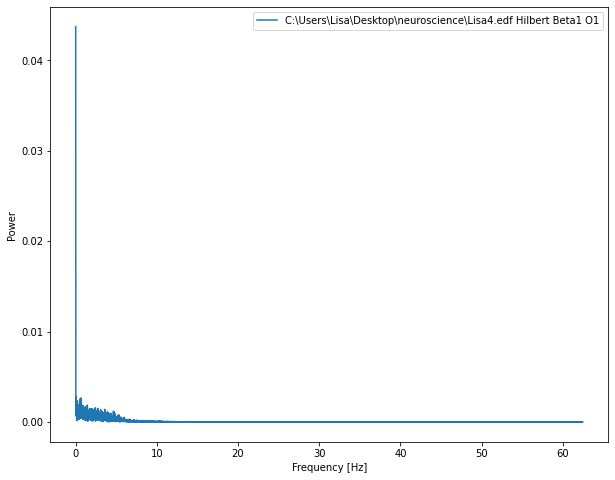

<Figure size 432x288 with 0 Axes>

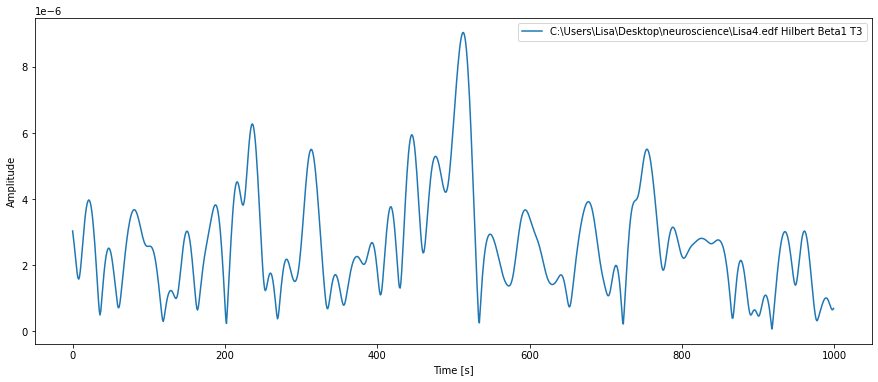

<Figure size 432x288 with 0 Axes>

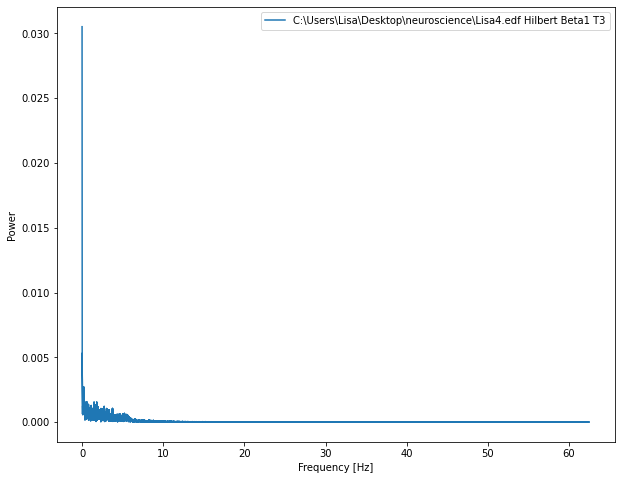

<Figure size 432x288 with 0 Axes>

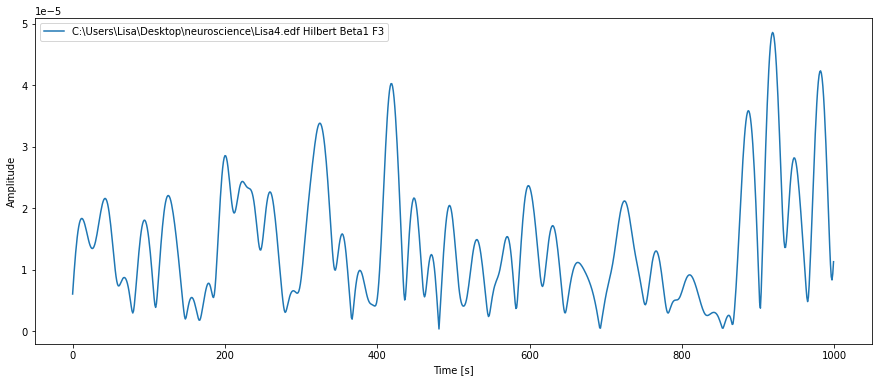

<Figure size 432x288 with 0 Axes>

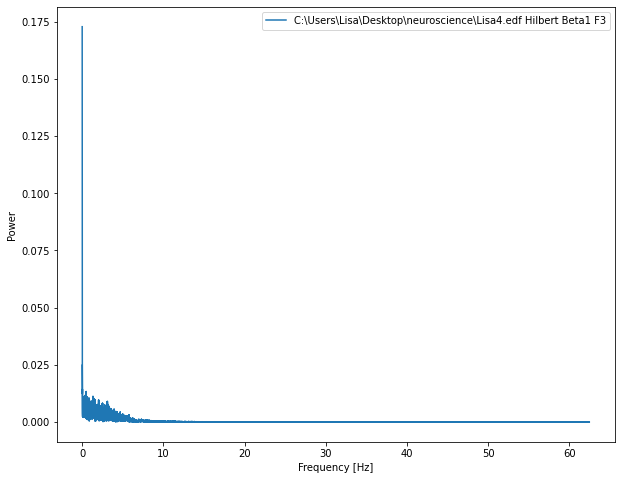

<Figure size 432x288 with 0 Axes>

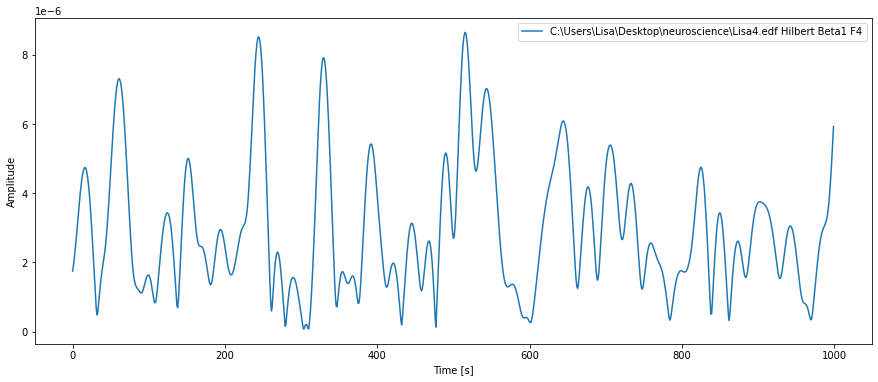

<Figure size 432x288 with 0 Axes>

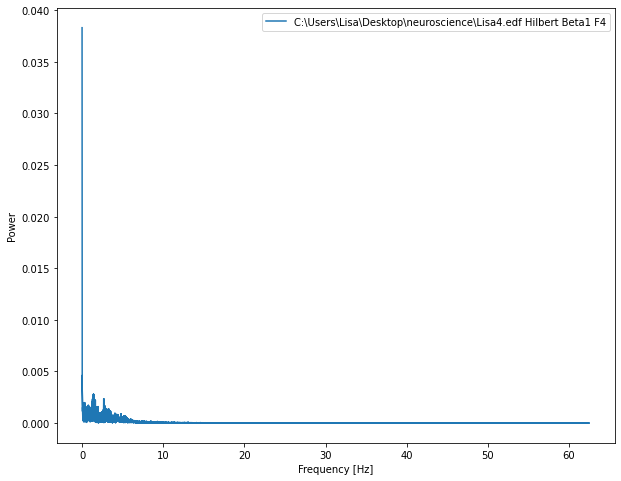

<Figure size 432x288 with 0 Axes>

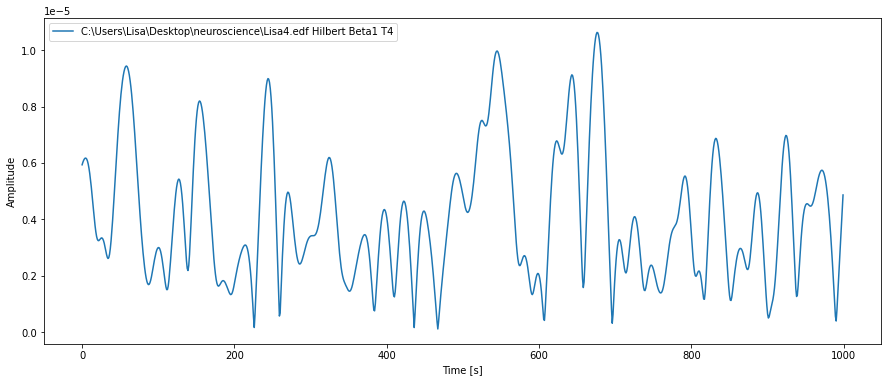

<Figure size 432x288 with 0 Axes>

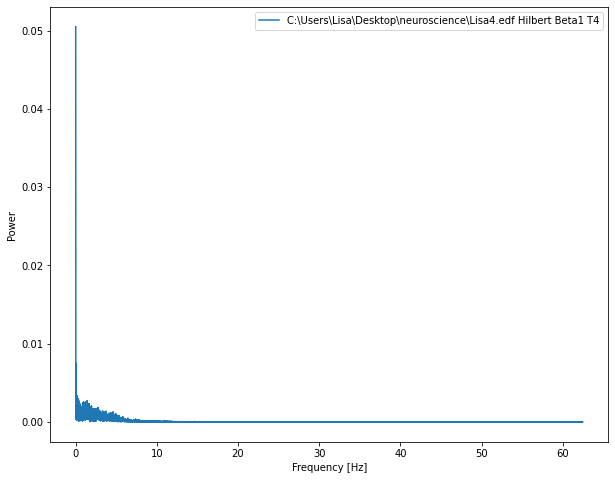

<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>
0.00085


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


<Figure size 432x288 with 0 Axes>

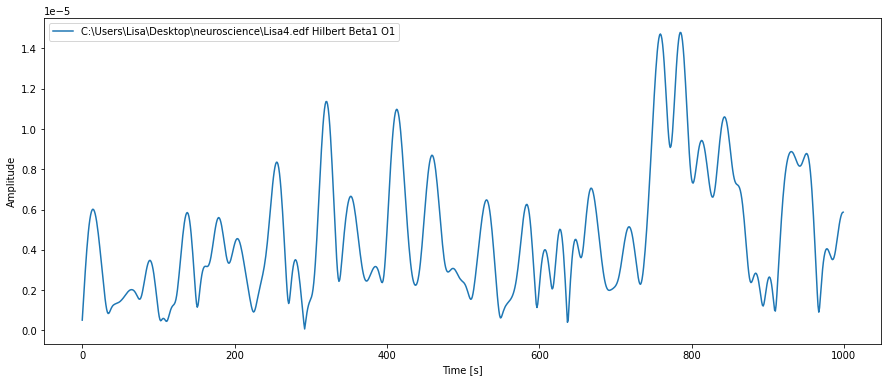

<Figure size 432x288 with 0 Axes>

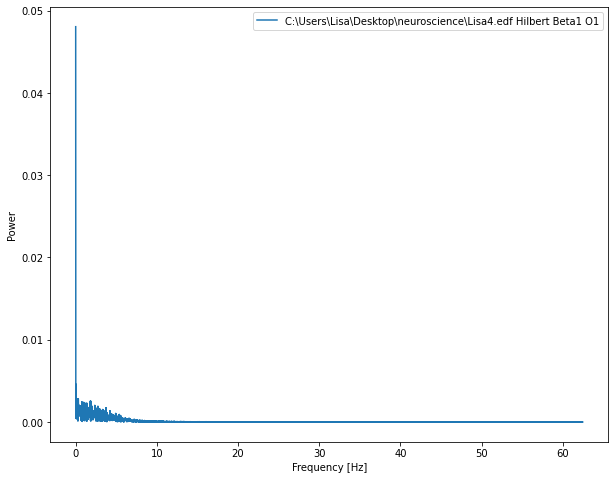

<Figure size 432x288 with 0 Axes>

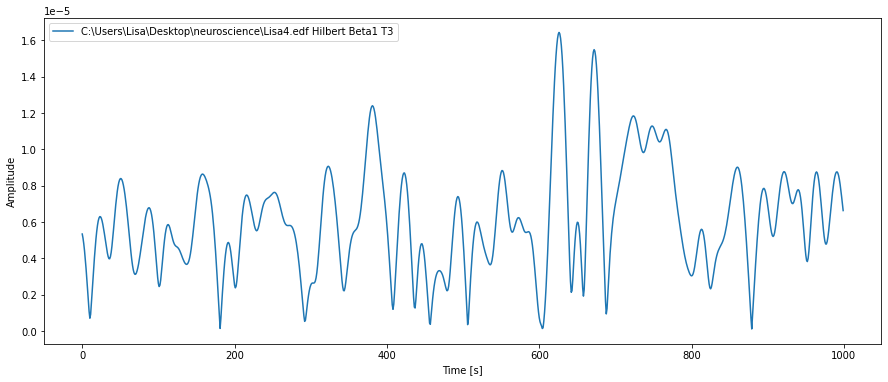

<Figure size 432x288 with 0 Axes>

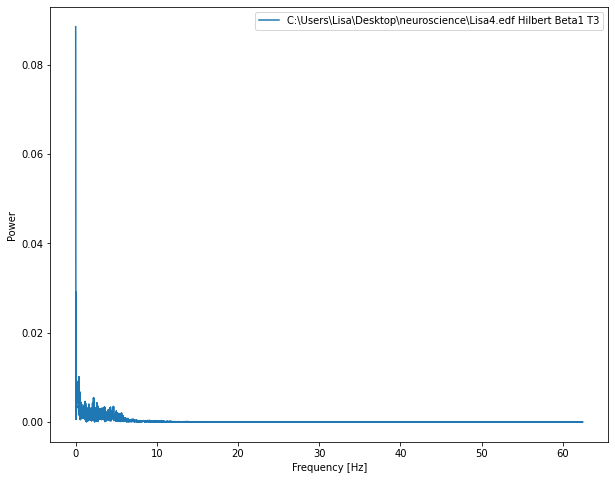

<Figure size 432x288 with 0 Axes>

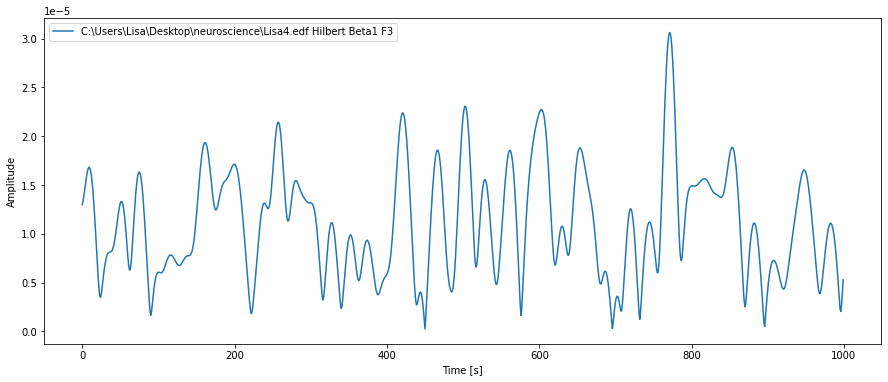

<Figure size 432x288 with 0 Axes>

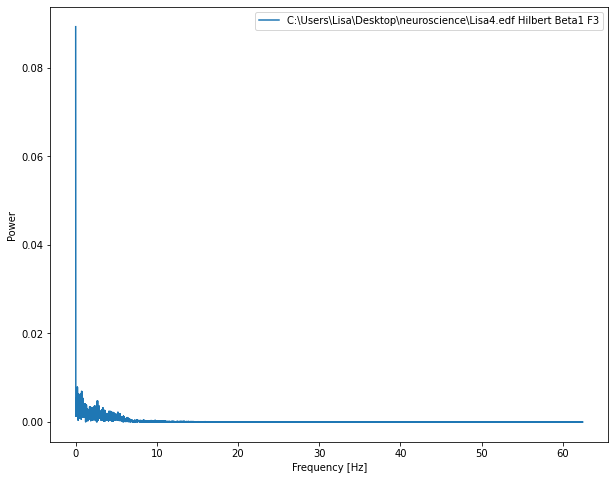

<Figure size 432x288 with 0 Axes>

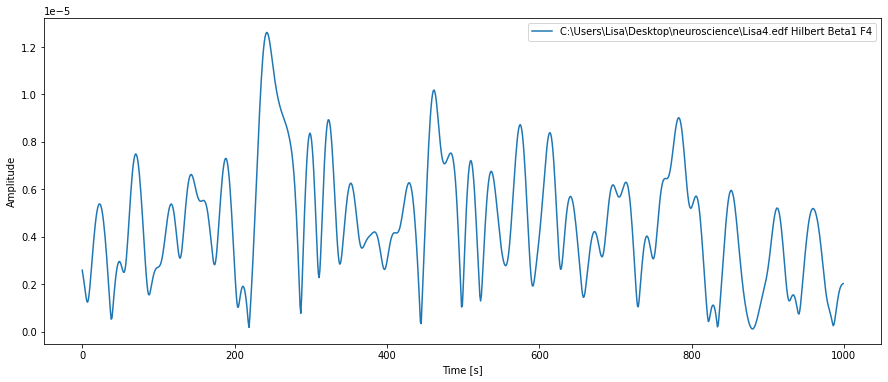

<Figure size 432x288 with 0 Axes>

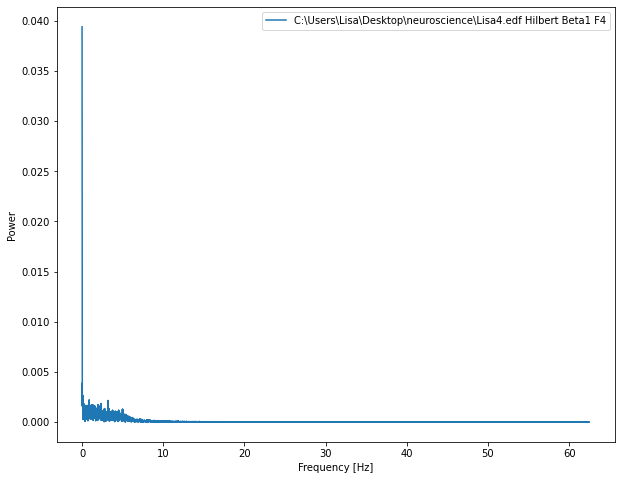

<Figure size 432x288 with 0 Axes>

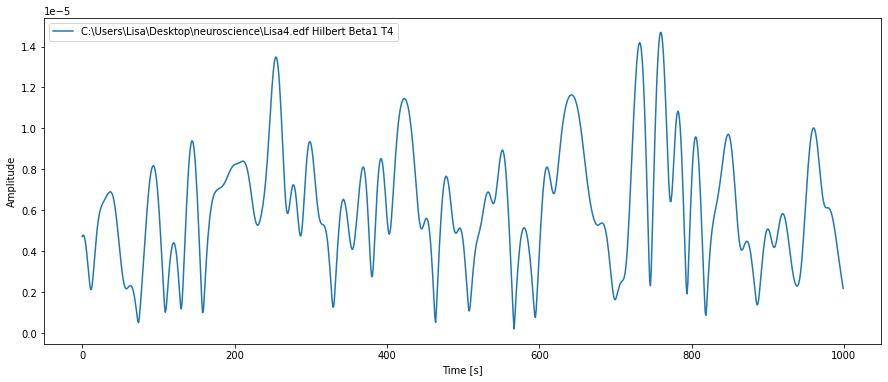

<Figure size 432x288 with 0 Axes>

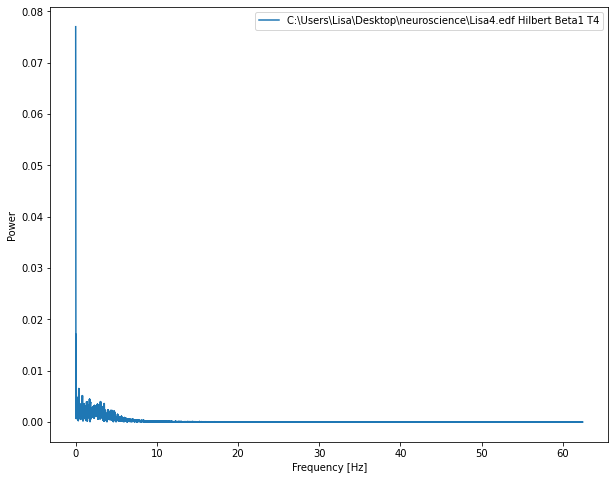

<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>
0.00015


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


<Figure size 432x288 with 0 Axes>

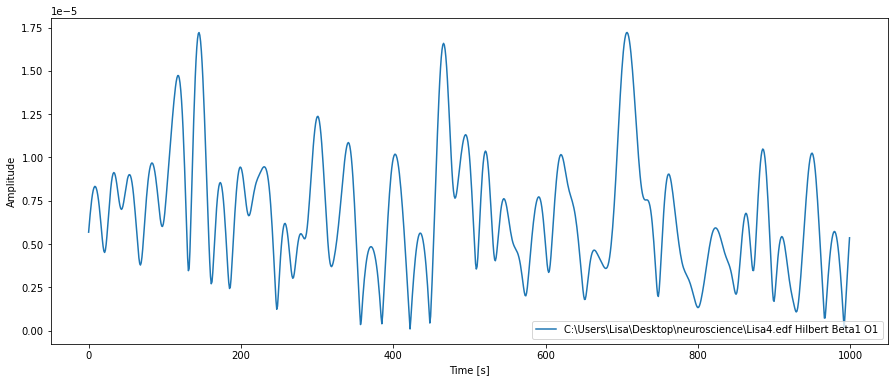

<Figure size 432x288 with 0 Axes>

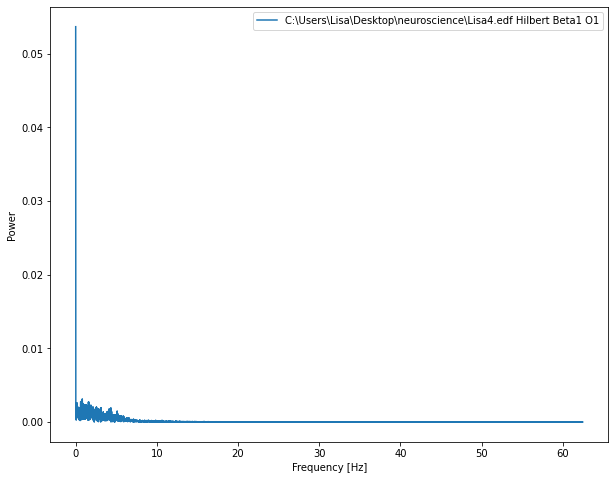

<Figure size 432x288 with 0 Axes>

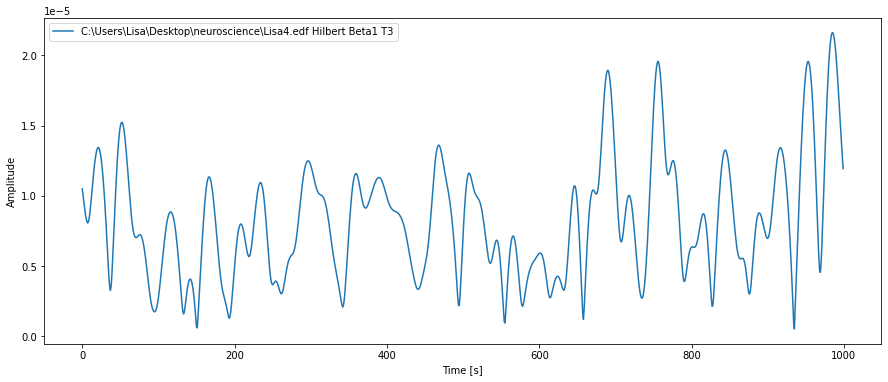

<Figure size 432x288 with 0 Axes>

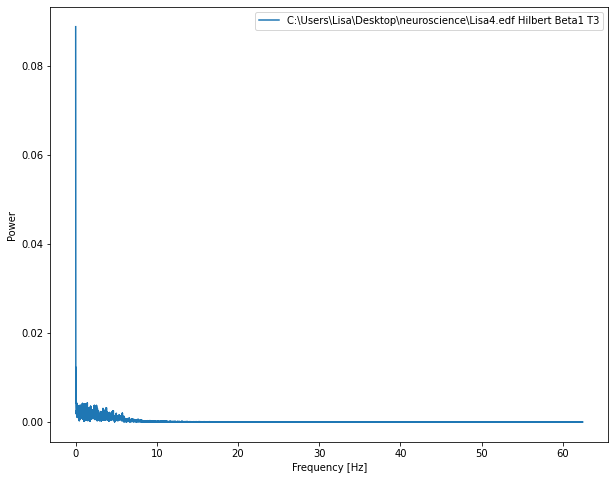

<Figure size 432x288 with 0 Axes>

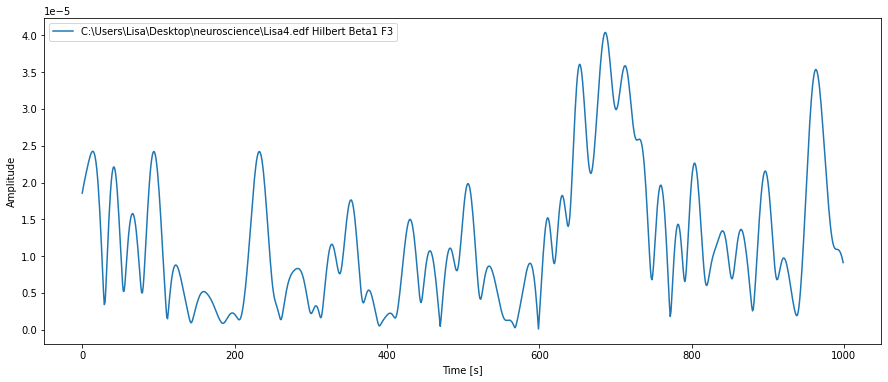

<Figure size 432x288 with 0 Axes>

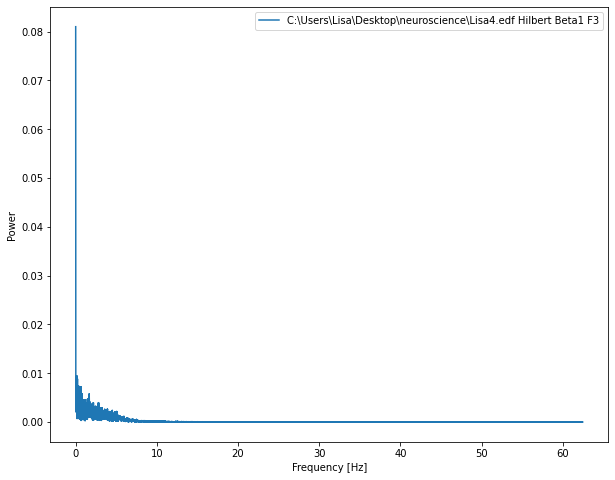

<Figure size 432x288 with 0 Axes>

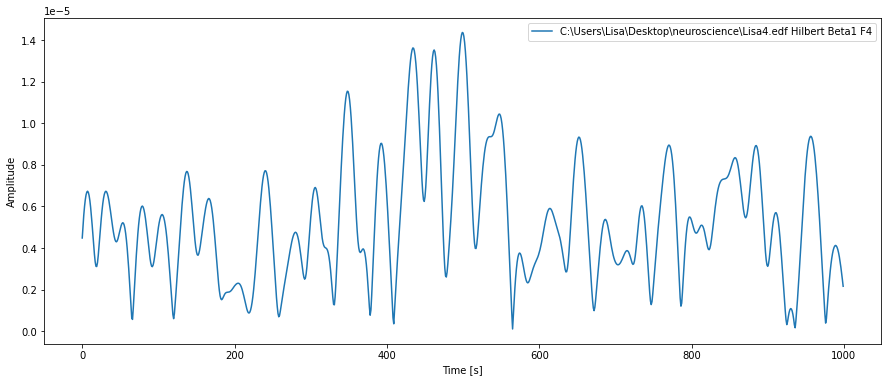

<Figure size 432x288 with 0 Axes>

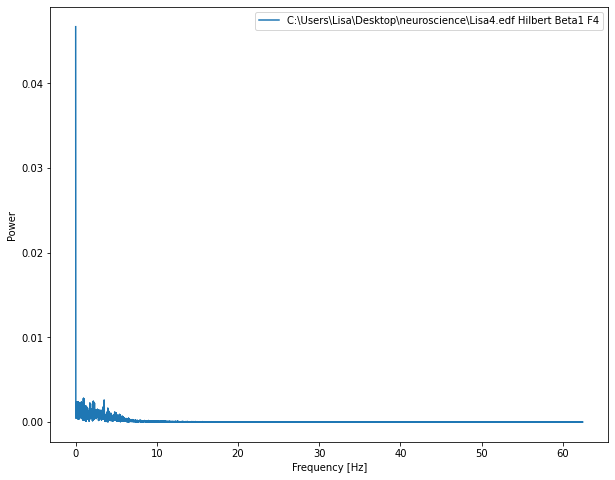

<Figure size 432x288 with 0 Axes>

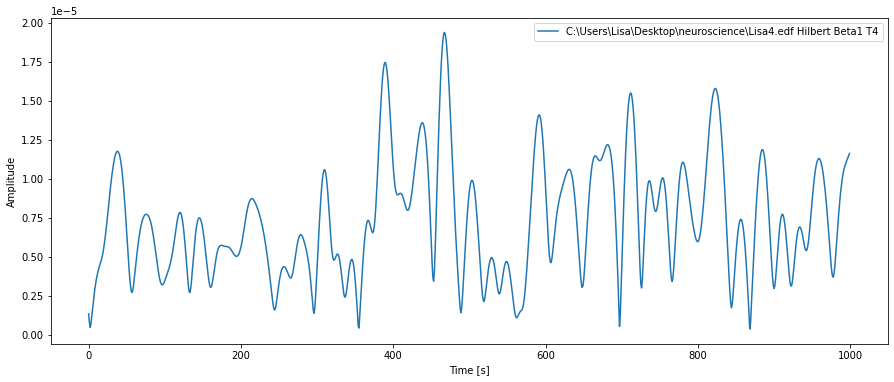

<Figure size 432x288 with 0 Axes>

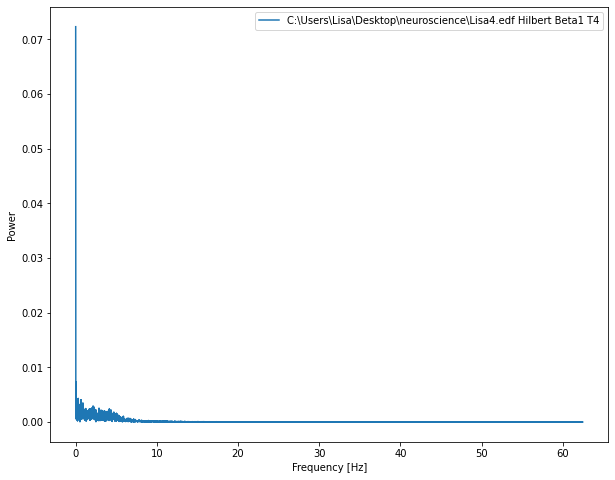

<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>
0.0003


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


<Figure size 432x288 with 0 Axes>

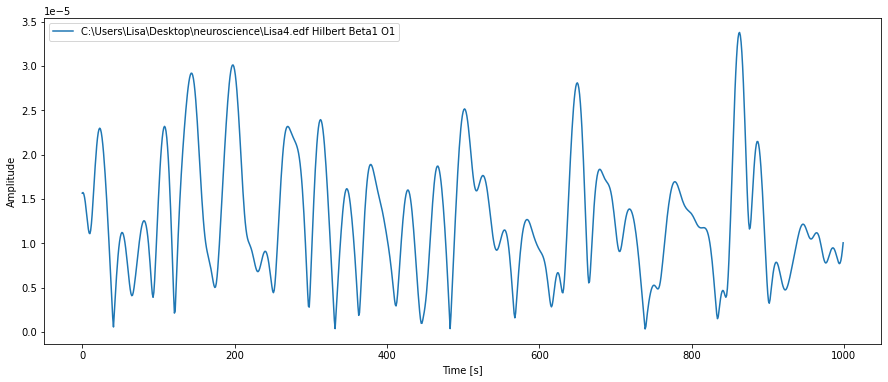

<Figure size 432x288 with 0 Axes>

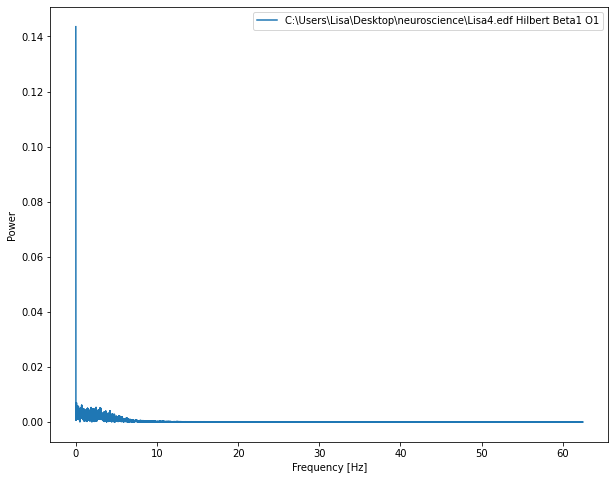

<Figure size 432x288 with 0 Axes>

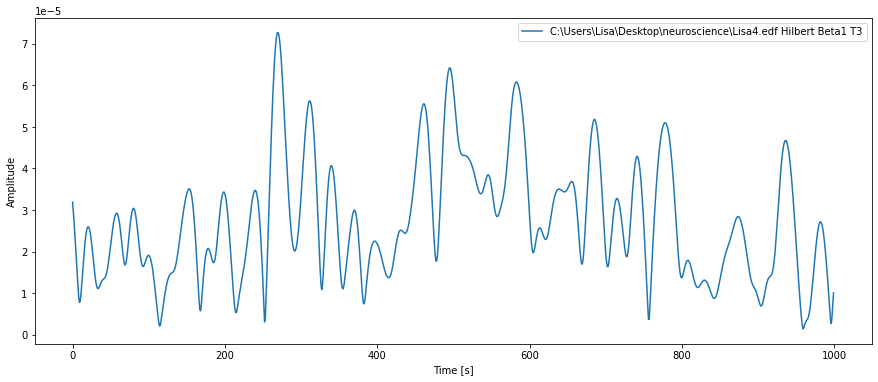

<Figure size 432x288 with 0 Axes>

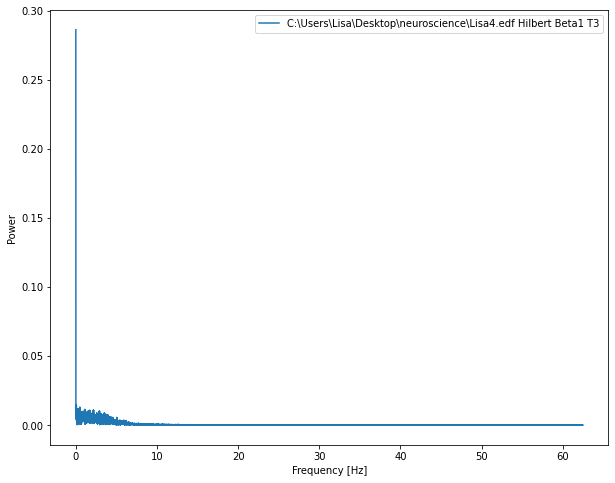

<Figure size 432x288 with 0 Axes>

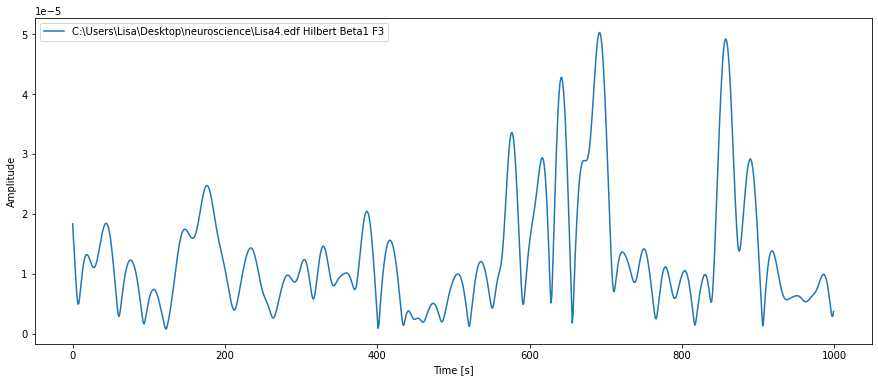

<Figure size 432x288 with 0 Axes>

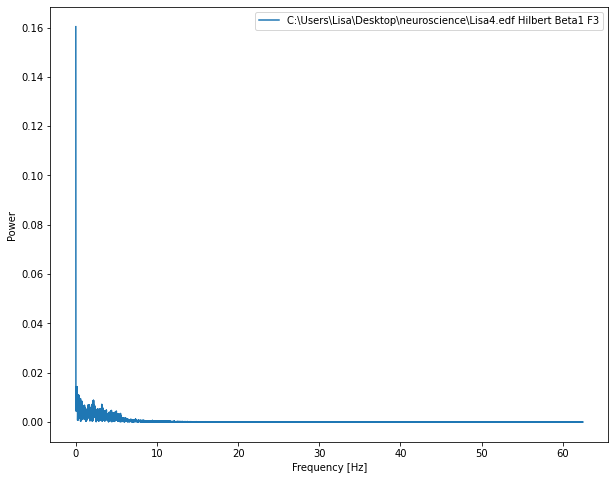

<Figure size 432x288 with 0 Axes>

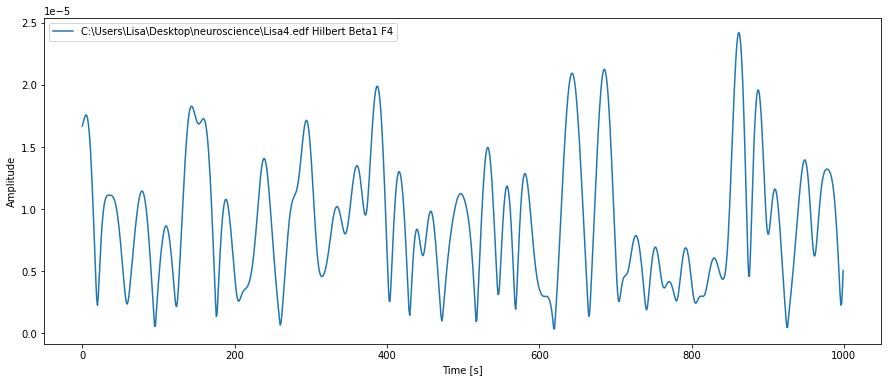

<Figure size 432x288 with 0 Axes>

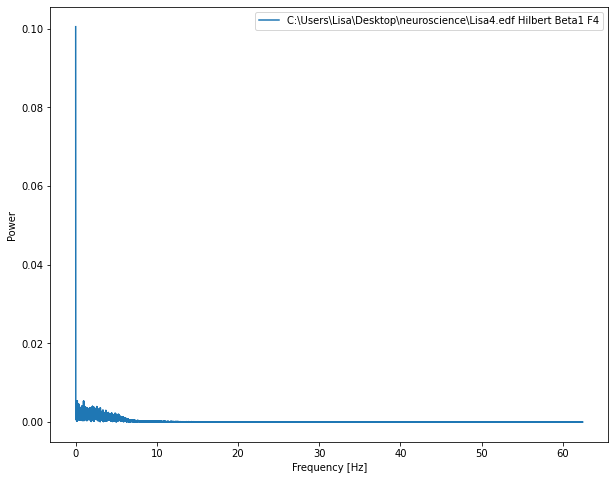

<Figure size 432x288 with 0 Axes>

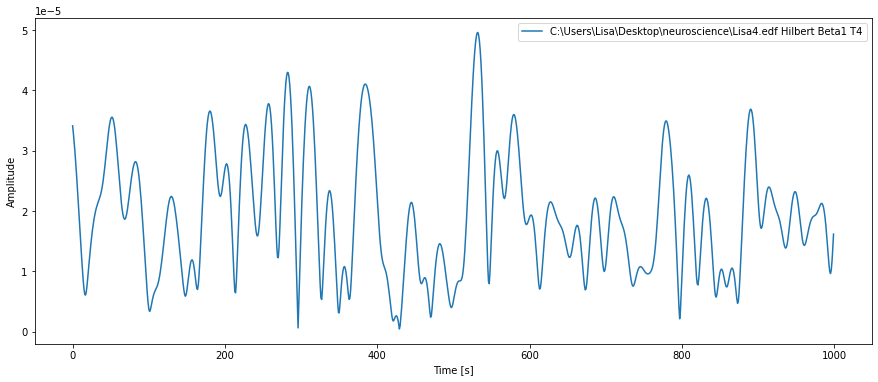

<Figure size 432x288 with 0 Axes>

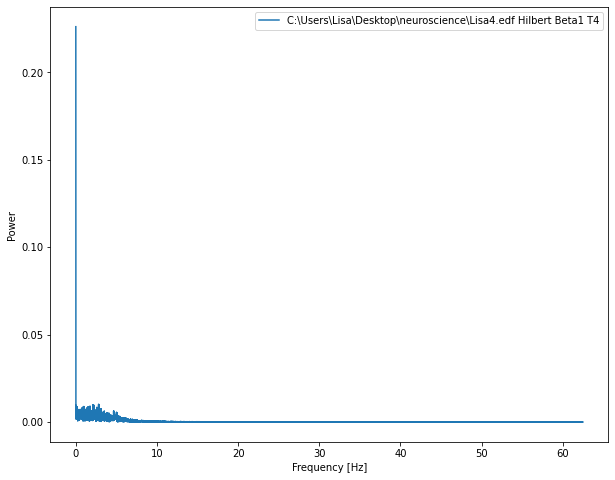

<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
0.00015


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:15: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  beta2_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:16: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  gamma_signal = np.empty((nchan,length_main),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\2549821175.py:24: DeprecationWarning: `np.object` is a deprecated alias for the b

<Figure size 432x288 with 0 Axes>

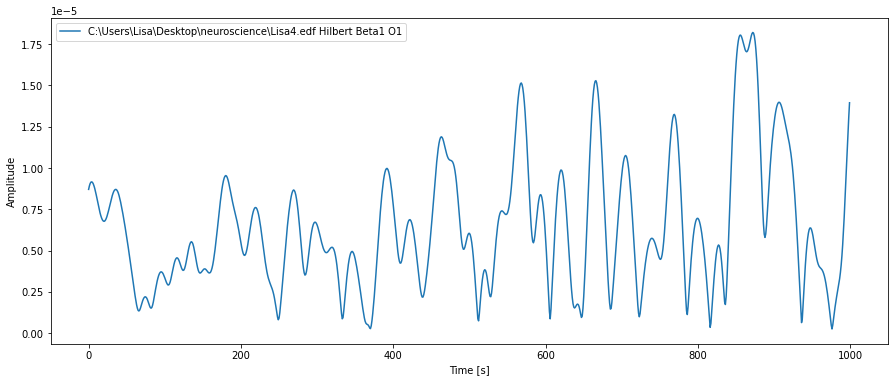

<Figure size 432x288 with 0 Axes>

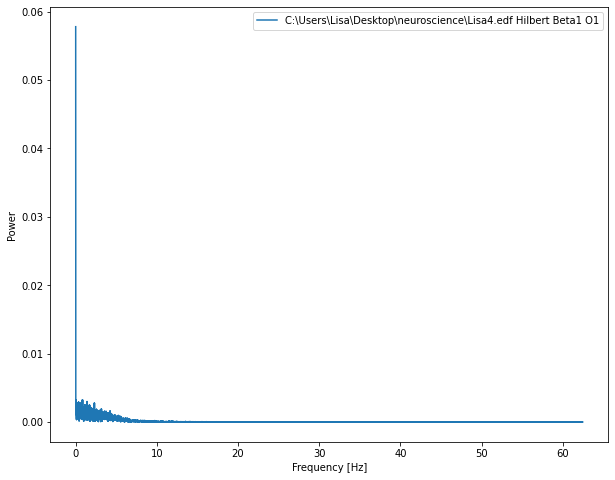

<Figure size 432x288 with 0 Axes>

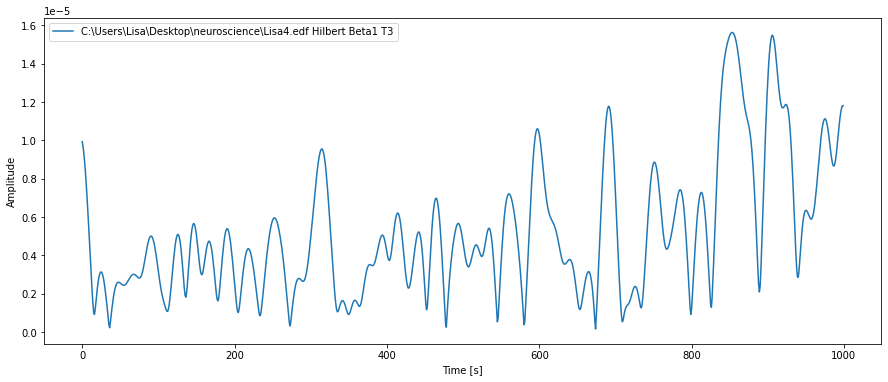

<Figure size 432x288 with 0 Axes>

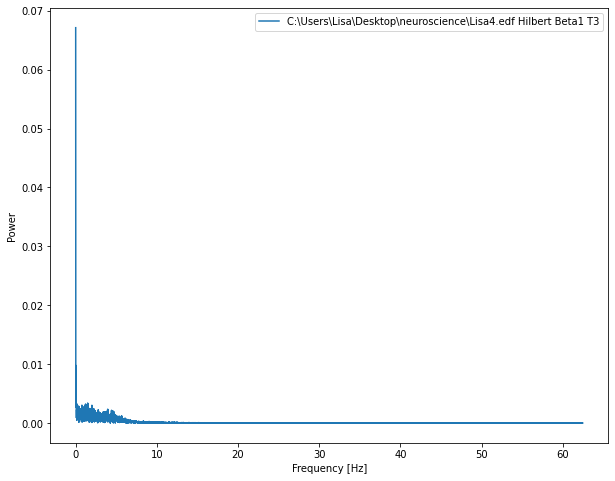

<Figure size 432x288 with 0 Axes>

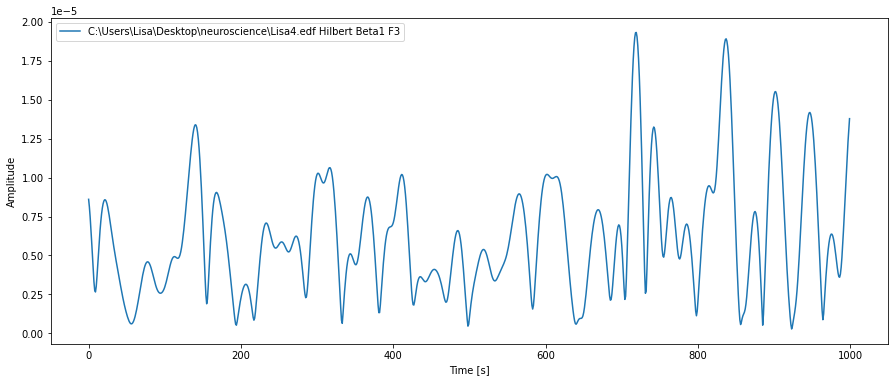

<Figure size 432x288 with 0 Axes>

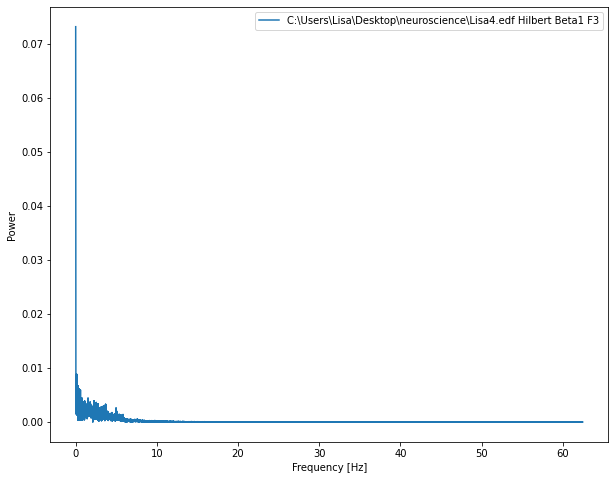

<Figure size 432x288 with 0 Axes>

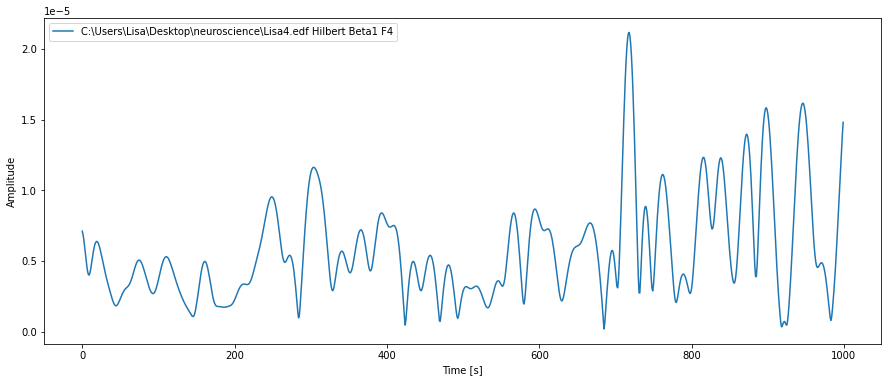

<Figure size 432x288 with 0 Axes>

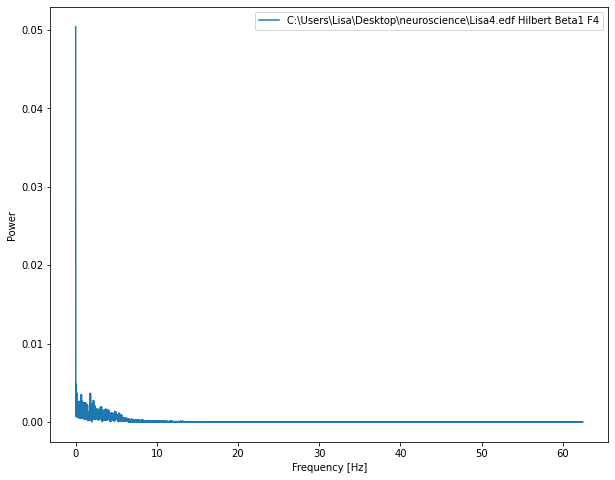

<Figure size 432x288 with 0 Axes>

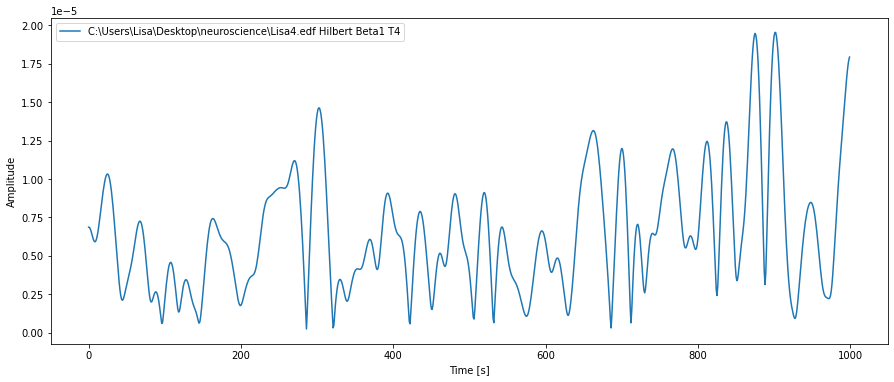

<Figure size 432x288 with 0 Axes>

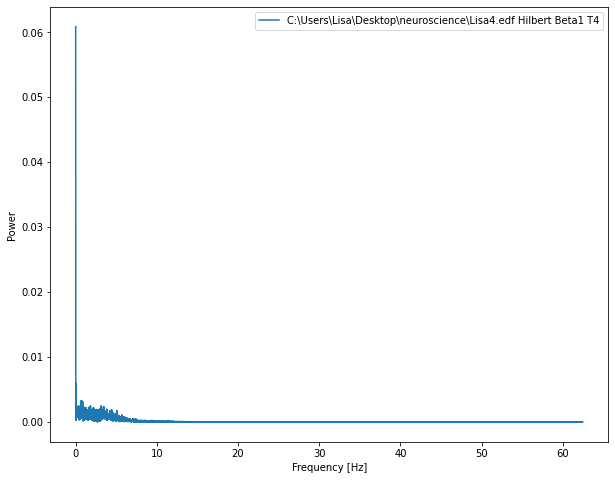

<Figure size 432x288 with 0 Axes>

In [36]:
for raw_mne1 in list_edf:
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    threshhold=float(input())
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[chan]
    length_main = len(new_file_with_record1[0])
    file_with_record_main = new_file_with_record1
    delta_signal = np.empty((nchan,length_main),dtype=np.object)
    theta_signal = np.empty((nchan,length_main),dtype=np.object)
    alpha_signal = np.empty((nchan,length_main),dtype=np.object)
    beta1_signal = np.empty((nchan,length_main),dtype=np.object)
    beta2_signal = np.empty((nchan,length_main),dtype=np.object)
    gamma_signal = np.empty((nchan,length_main),dtype=np.object)
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)
    hilbert_delta_signal = np.empty((nchan,length_main),dtype=np.object)
    hilbert_theta_signal = np.empty((nchan,length_main),dtype=np.object)
    hilbert_alpha_signal = np.empty((nchan,length_main),dtype=np.object)
    hilbert_beta1_signal = np.empty((nchan,length_main),dtype=np.object)
    hilbert_beta2_signal = np.empty((nchan,length_main),dtype=np.object)
    hilbert_gamma_signal = np.empty((nchan,length_main),dtype=np.object)
    for chan in range(0,nchan):
        hilbert_delta_signal[chan] = np.abs(hilbert(delta_signal[chan]))
        hilbert_theta_signal[chan] = np.abs(hilbert(theta_signal[chan]))
        hilbert_alpha_signal[chan] = np.abs(hilbert(alpha_signal[chan]))
        hilbert_beta1_signal[chan] = np.abs(hilbert(beta1_signal[chan]))
        hilbert_beta2_signal[chan] = np.abs(hilbert(beta2_signal[chan]))
        hilbert_gamma_signal[chan] = np.abs(hilbert(gamma_signal[chan]))
        print('Channel ' + str(chan) + ' completed')
    for chan in range(0,nchan-1):
        draw_signal(hilbert_beta1_signal[chan][1000:2000],1000,1,filename+' Hilbert Beta1 '+raw_mne1.ch_names[chan])
        draw_spectr(hilbert_beta1_signal[chan],sample_rate_main,filename+' Hilbert Beta1 '+raw_mne1.ch_names[chan])

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

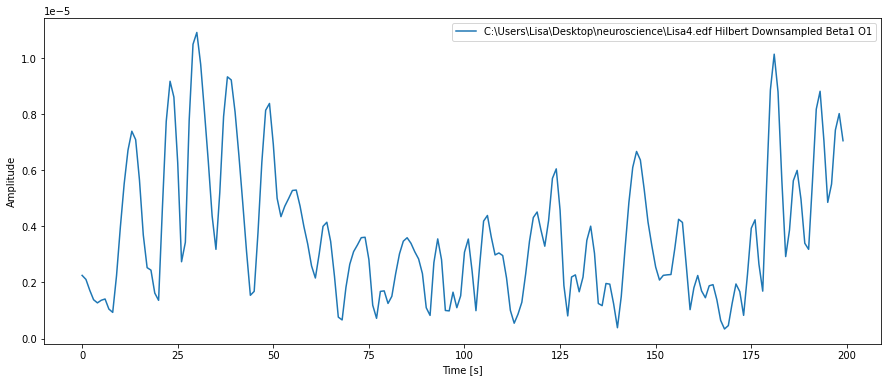

<Figure size 432x288 with 0 Axes>

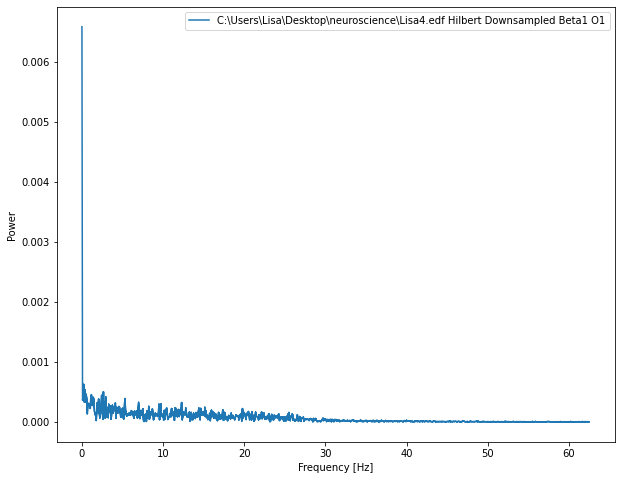

<Figure size 432x288 with 0 Axes>

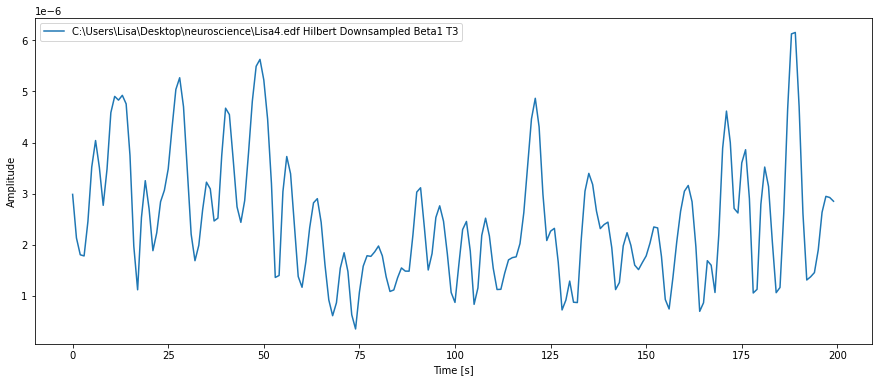

<Figure size 432x288 with 0 Axes>

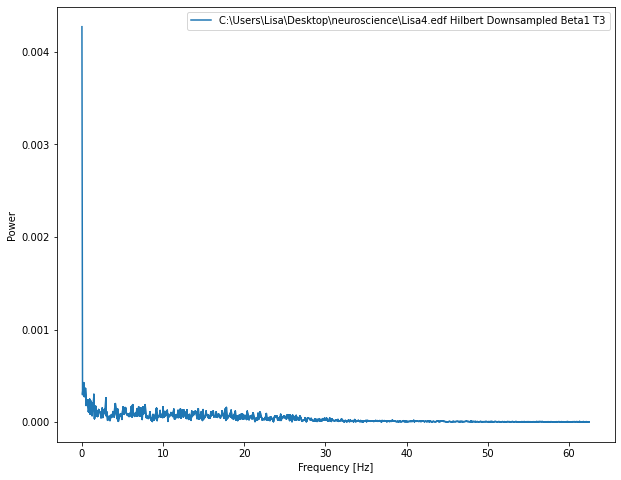

<Figure size 432x288 with 0 Axes>

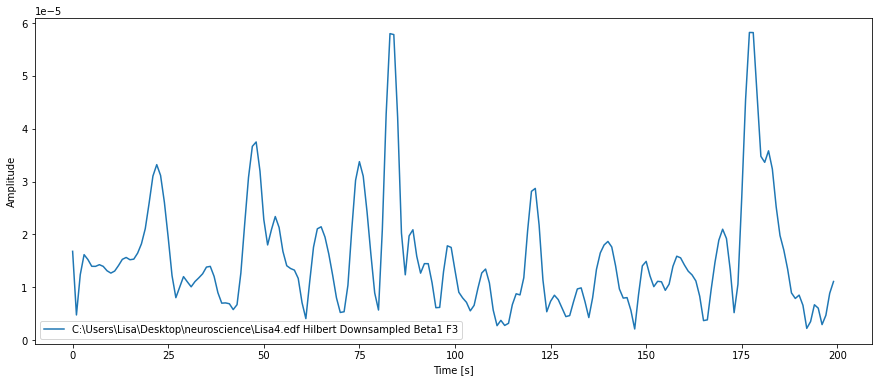

<Figure size 432x288 with 0 Axes>

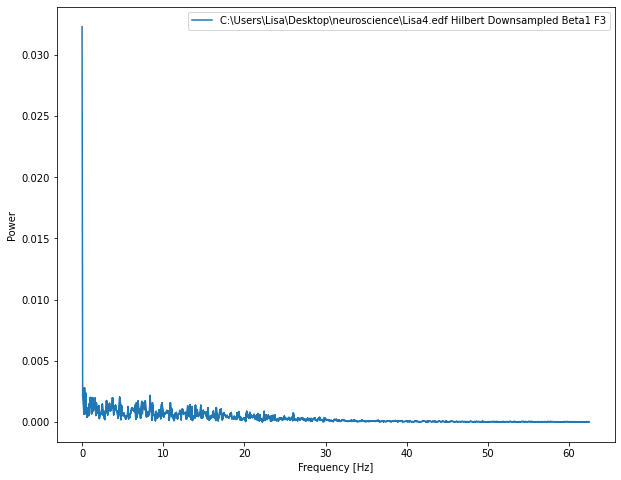

<Figure size 432x288 with 0 Axes>

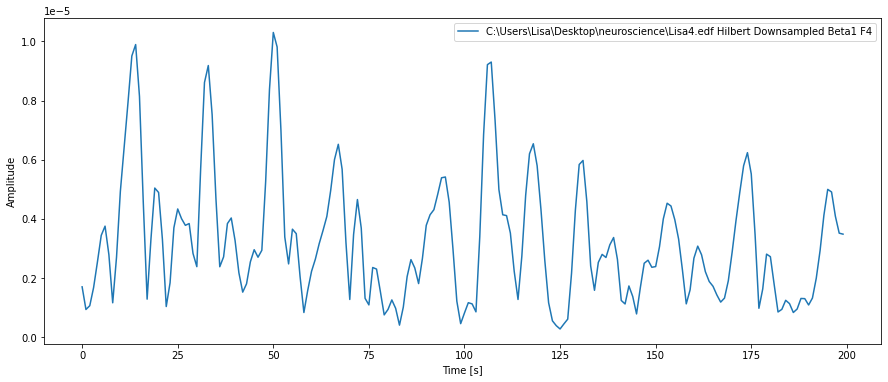

<Figure size 432x288 with 0 Axes>

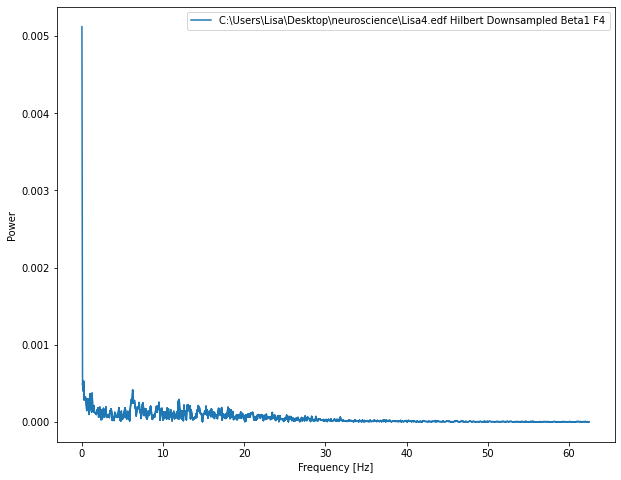

<Figure size 432x288 with 0 Axes>

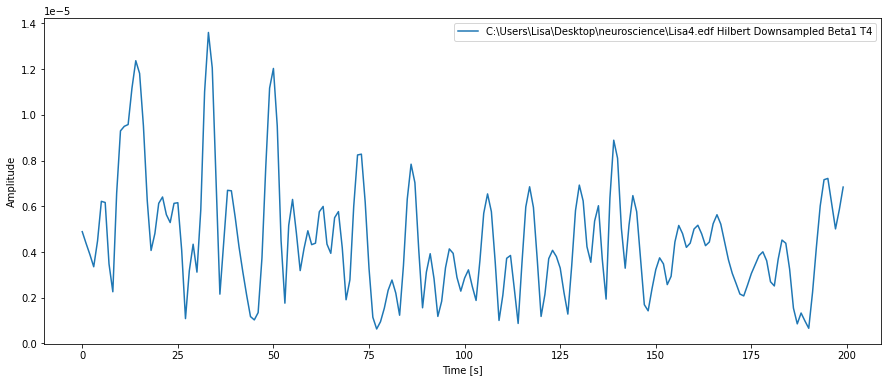

<Figure size 432x288 with 0 Axes>

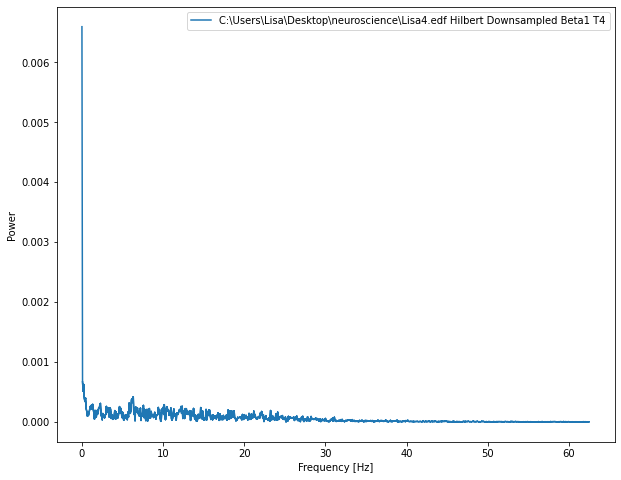

<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

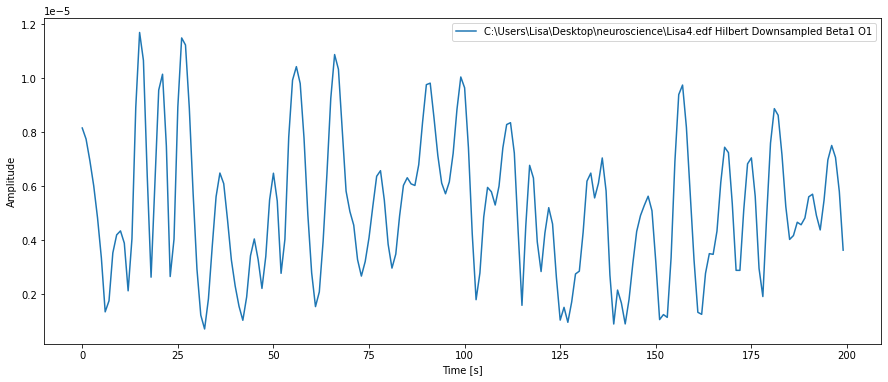

<Figure size 432x288 with 0 Axes>

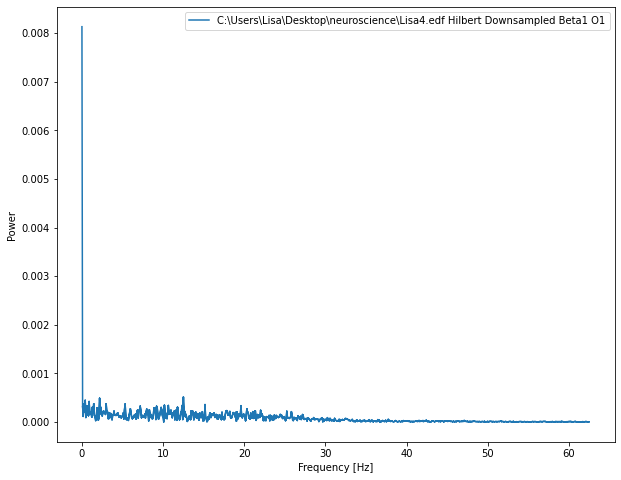

<Figure size 432x288 with 0 Axes>

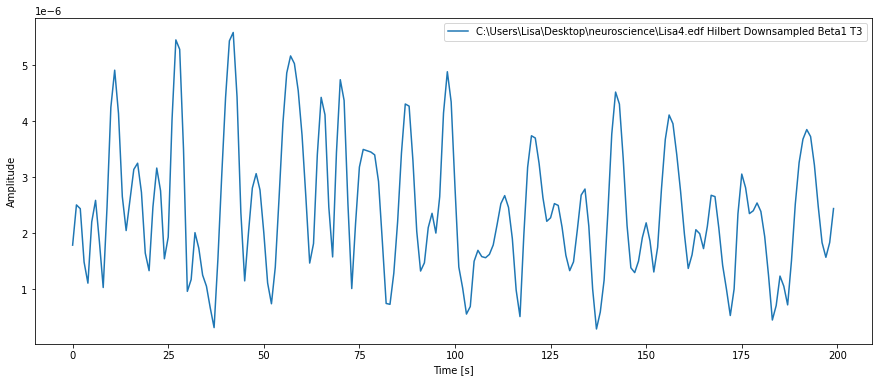

<Figure size 432x288 with 0 Axes>

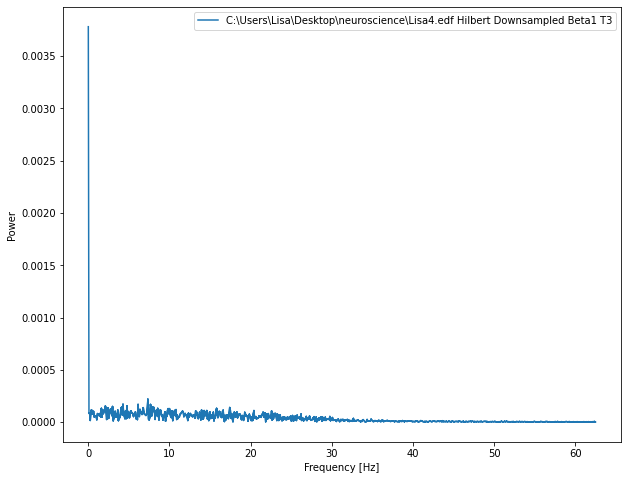

<Figure size 432x288 with 0 Axes>

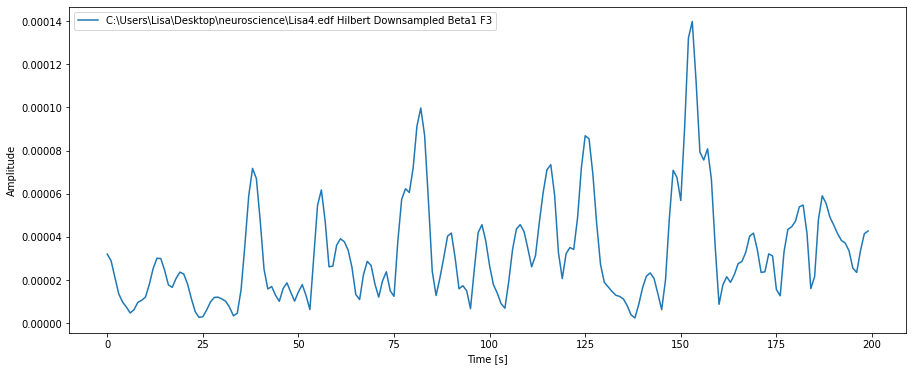

<Figure size 432x288 with 0 Axes>

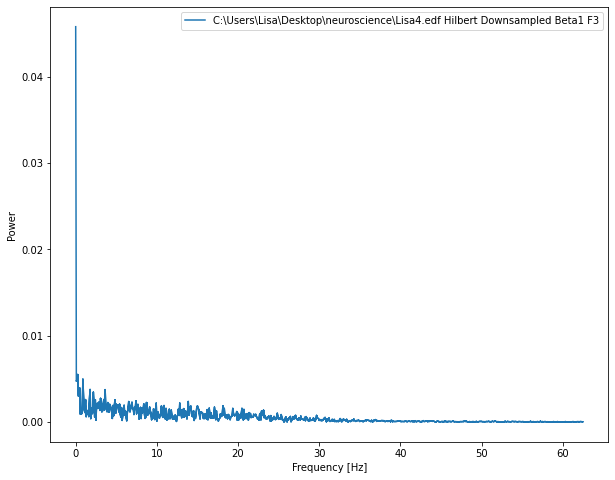

<Figure size 432x288 with 0 Axes>

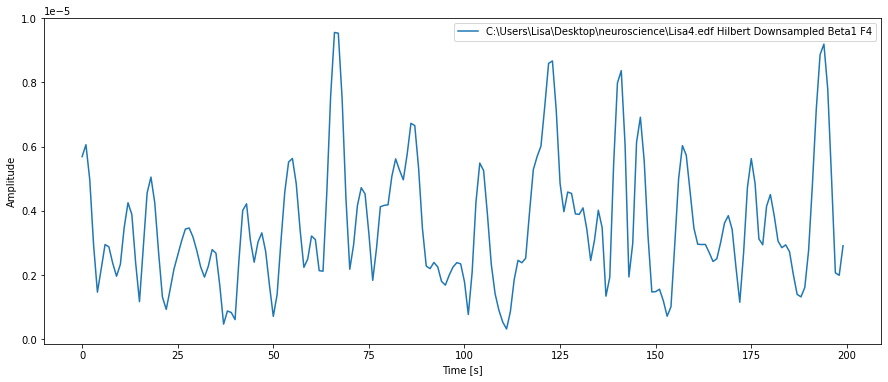

<Figure size 432x288 with 0 Axes>

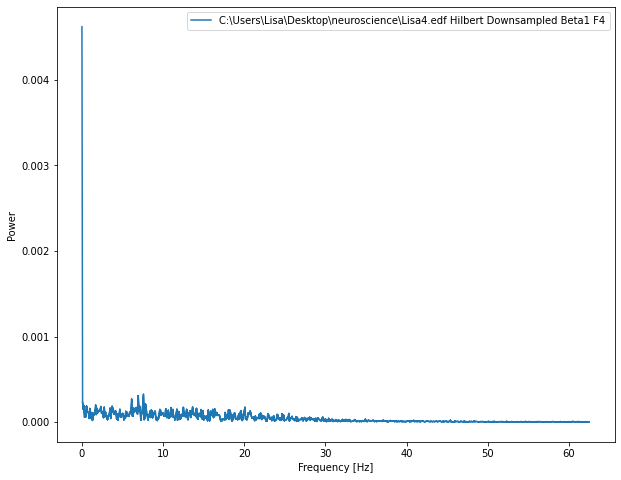

<Figure size 432x288 with 0 Axes>

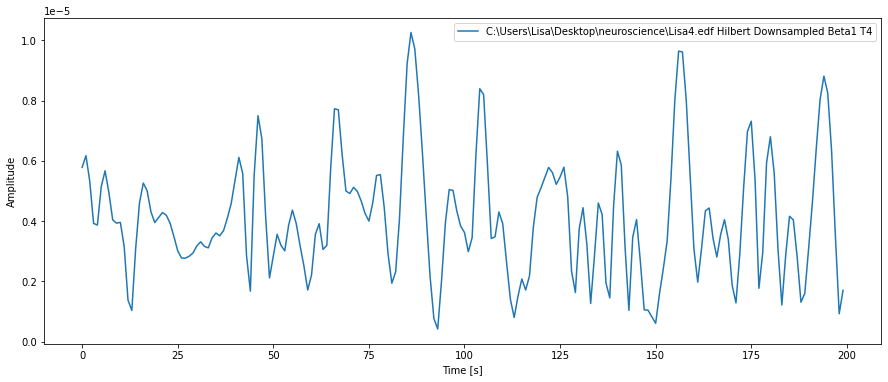

<Figure size 432x288 with 0 Axes>

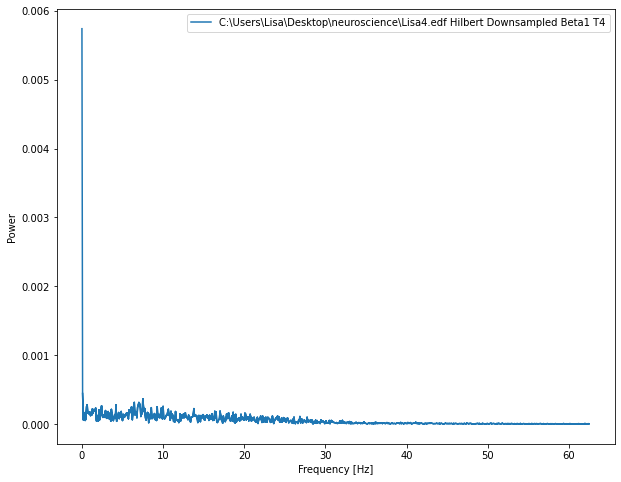

<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

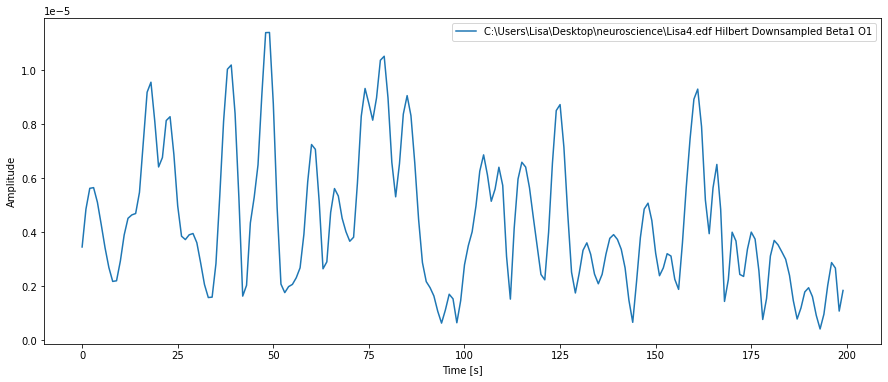

<Figure size 432x288 with 0 Axes>

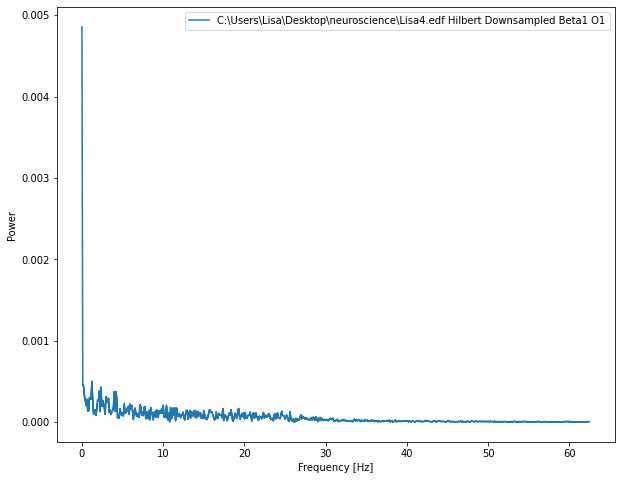

<Figure size 432x288 with 0 Axes>

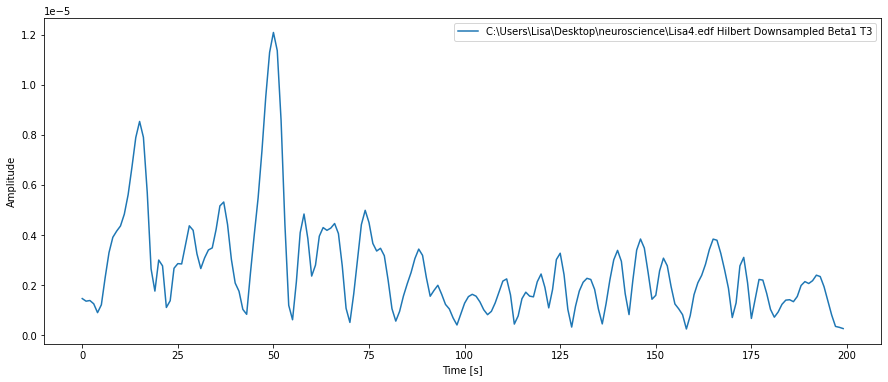

<Figure size 432x288 with 0 Axes>

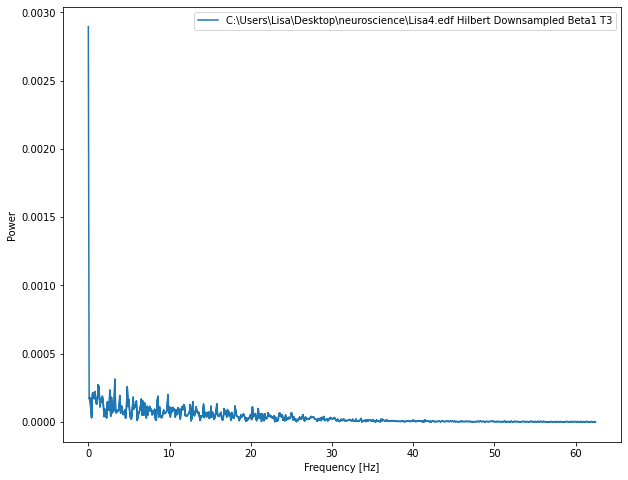

<Figure size 432x288 with 0 Axes>

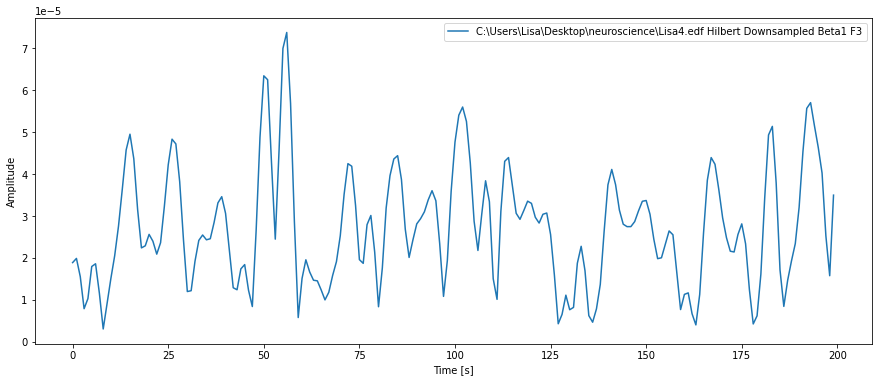

<Figure size 432x288 with 0 Axes>

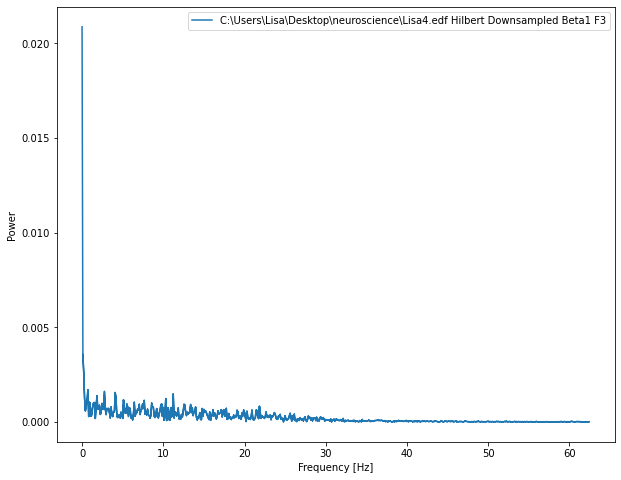

<Figure size 432x288 with 0 Axes>

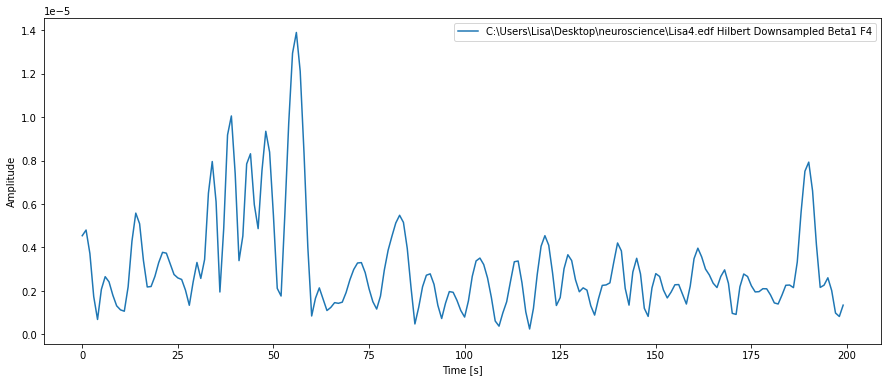

<Figure size 432x288 with 0 Axes>

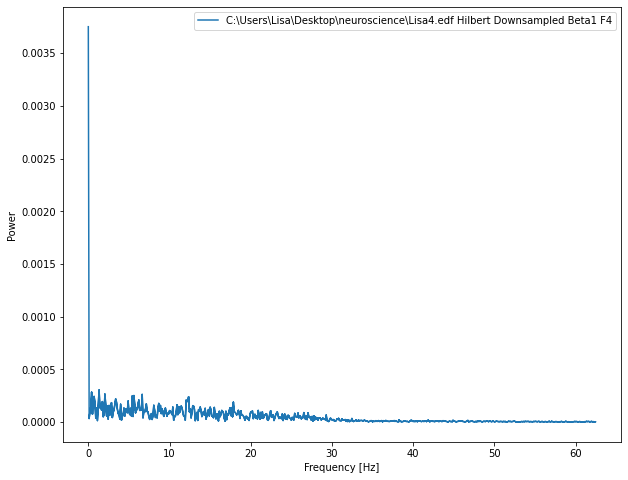

<Figure size 432x288 with 0 Axes>

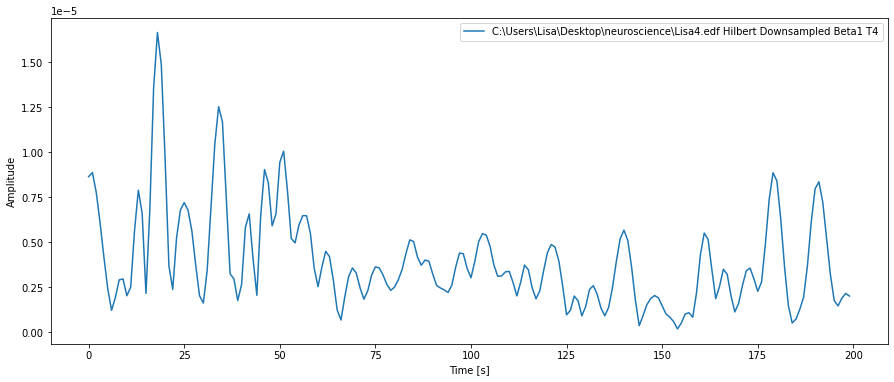

<Figure size 432x288 with 0 Axes>

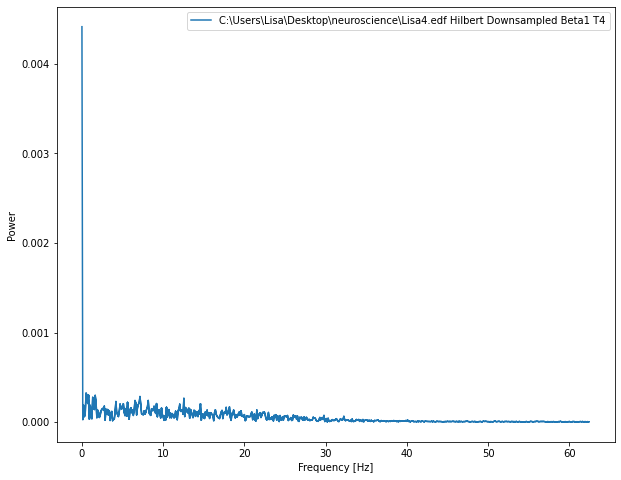

<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

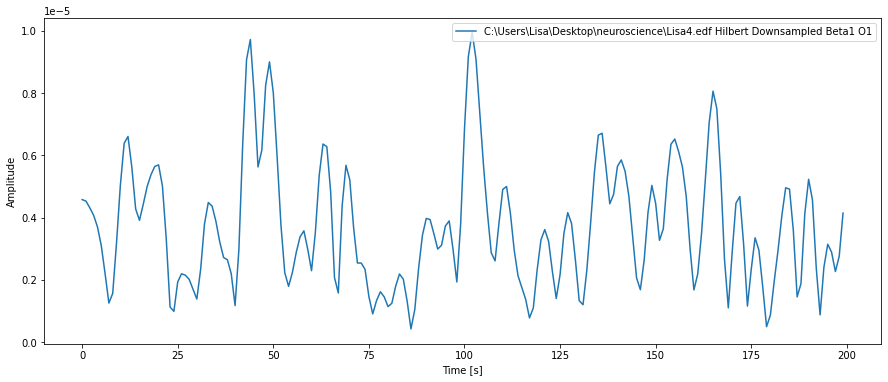

<Figure size 432x288 with 0 Axes>

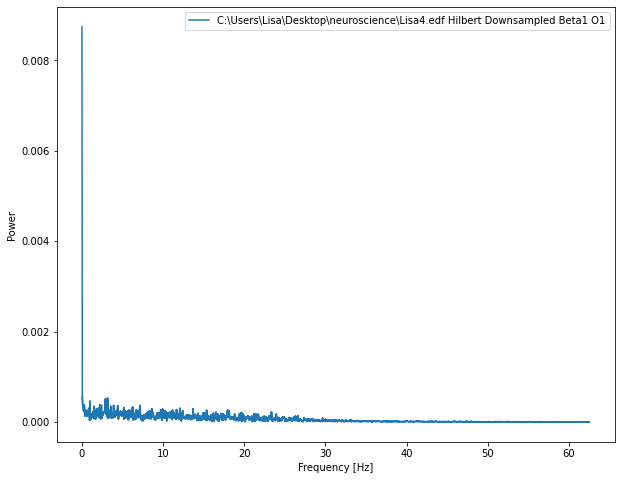

<Figure size 432x288 with 0 Axes>

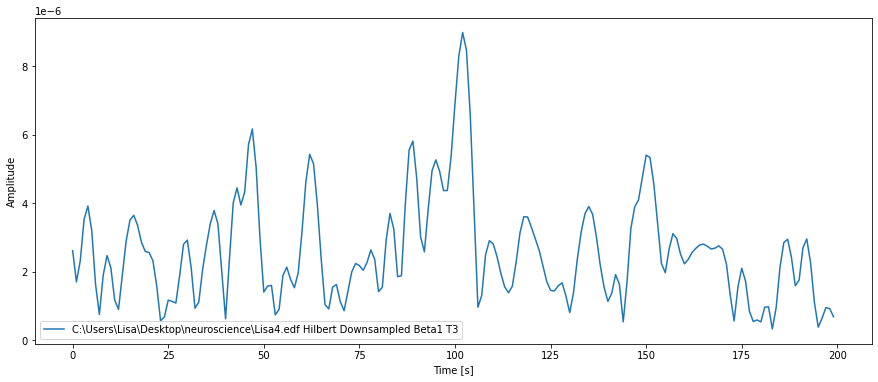

<Figure size 432x288 with 0 Axes>

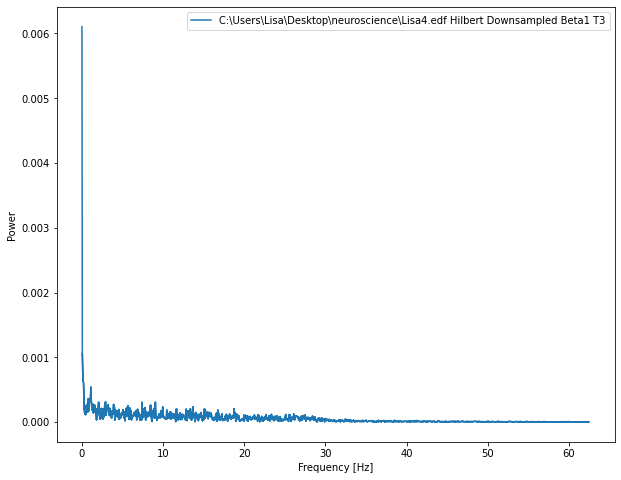

<Figure size 432x288 with 0 Axes>

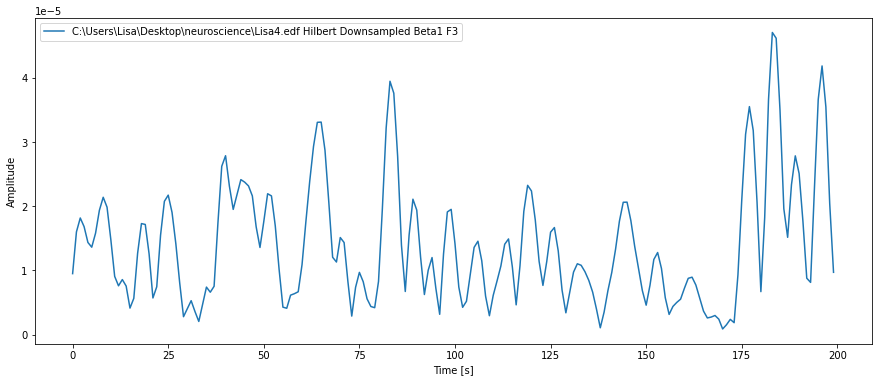

<Figure size 432x288 with 0 Axes>

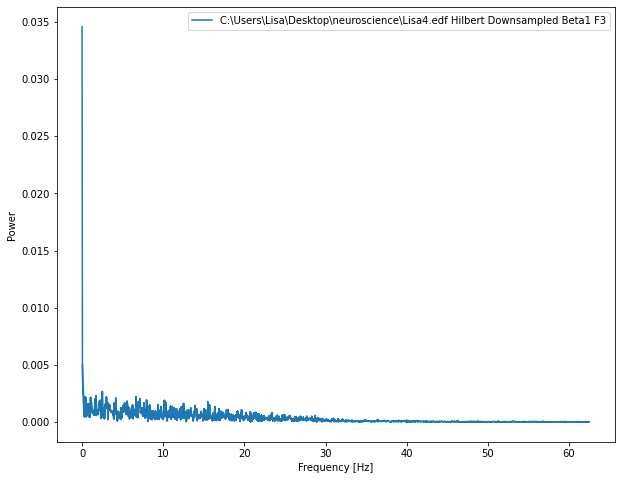

<Figure size 432x288 with 0 Axes>

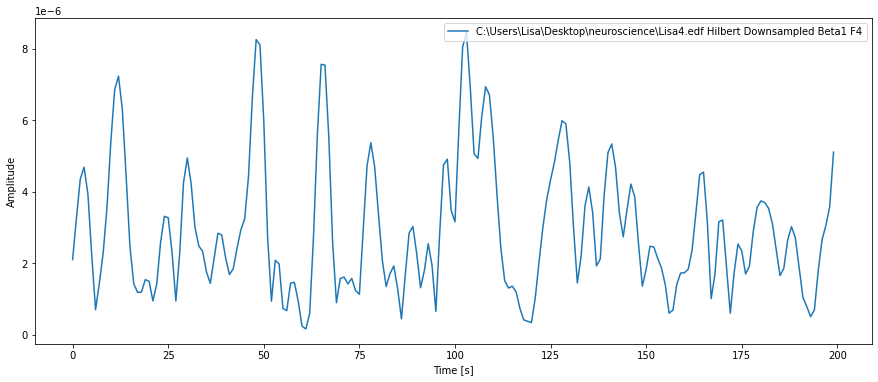

<Figure size 432x288 with 0 Axes>

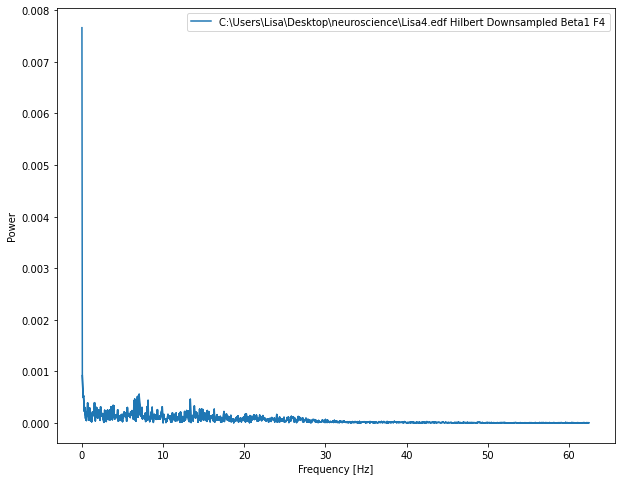

<Figure size 432x288 with 0 Axes>

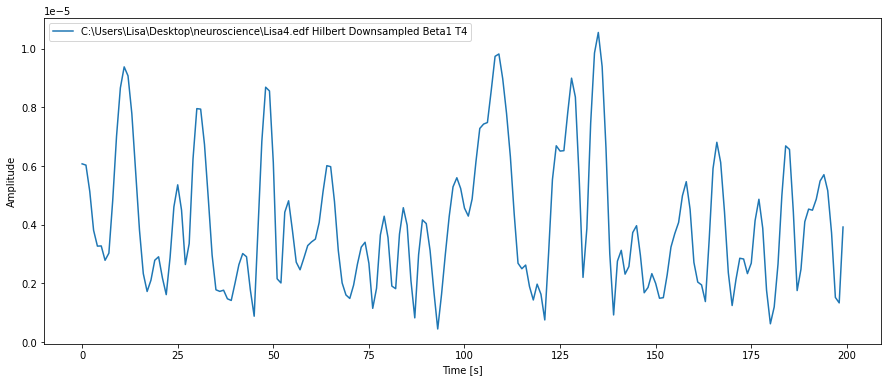

<Figure size 432x288 with 0 Axes>

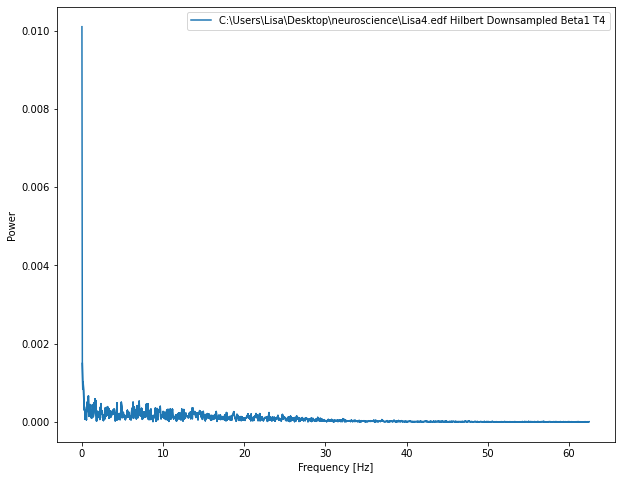

<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

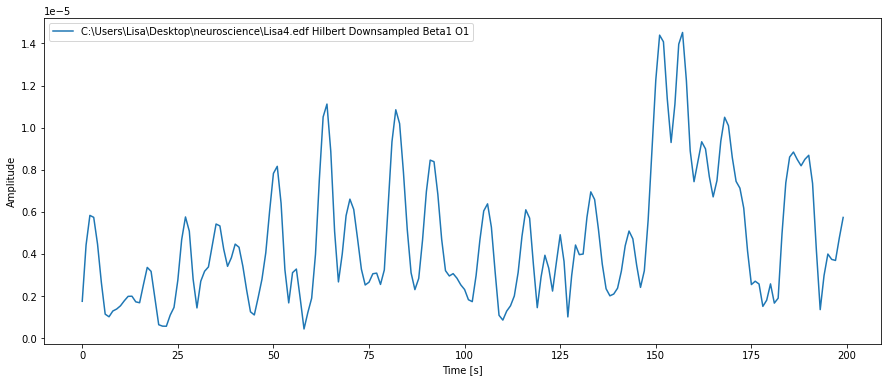

<Figure size 432x288 with 0 Axes>

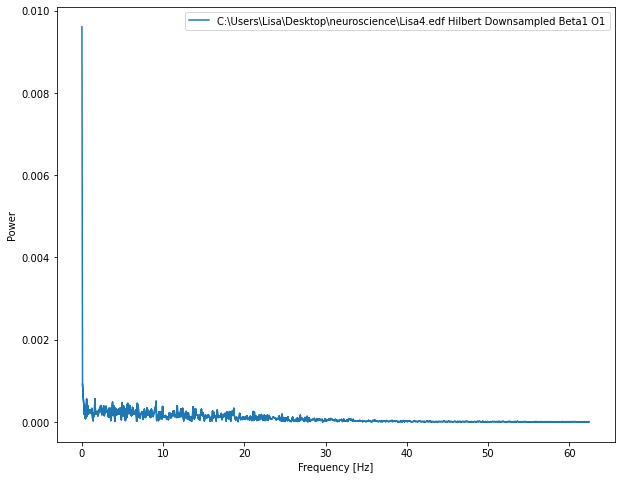

<Figure size 432x288 with 0 Axes>

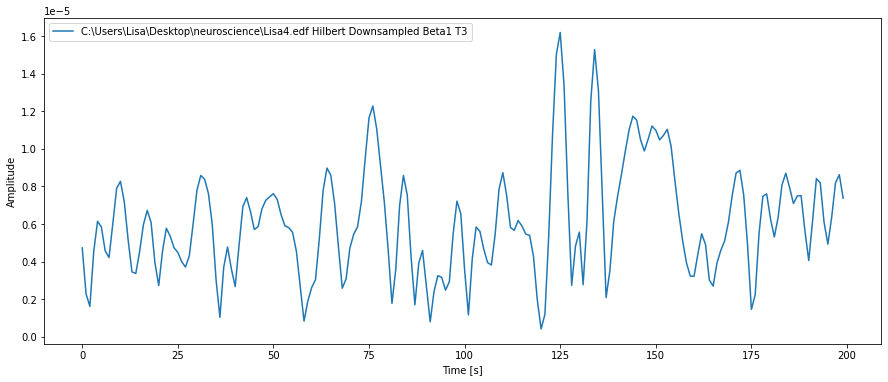

<Figure size 432x288 with 0 Axes>

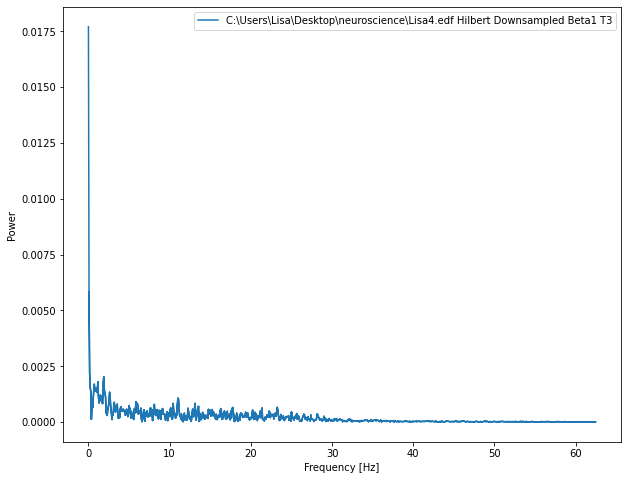

<Figure size 432x288 with 0 Axes>

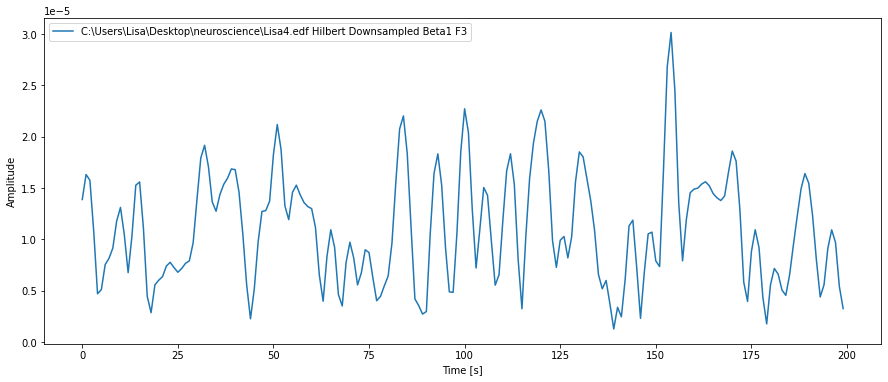

<Figure size 432x288 with 0 Axes>

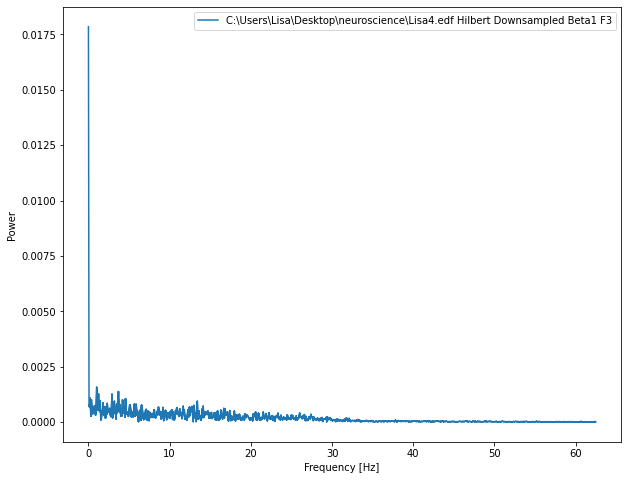

<Figure size 432x288 with 0 Axes>

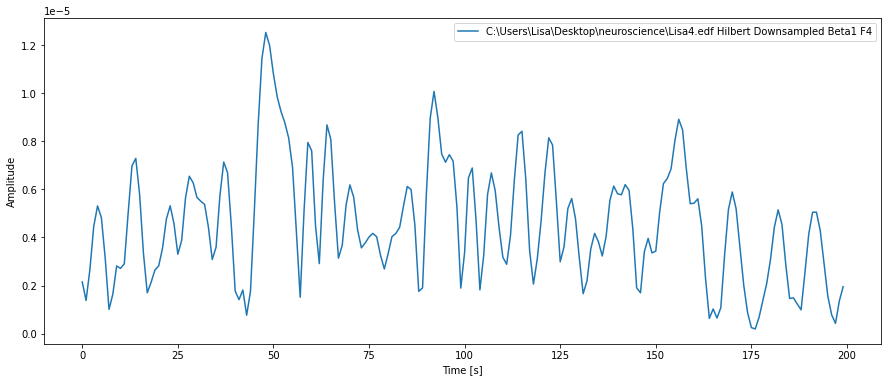

<Figure size 432x288 with 0 Axes>

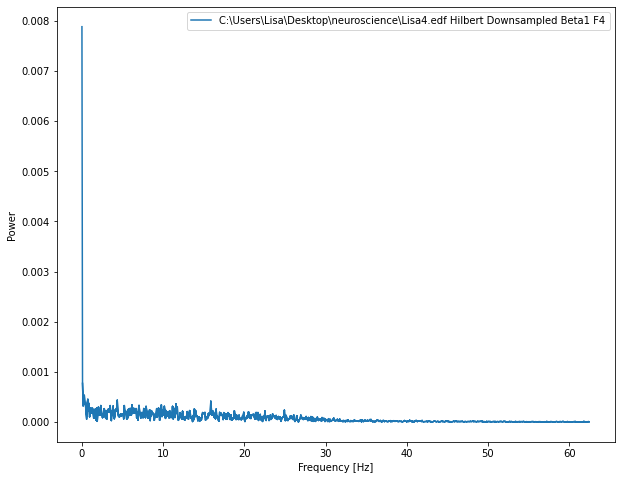

<Figure size 432x288 with 0 Axes>

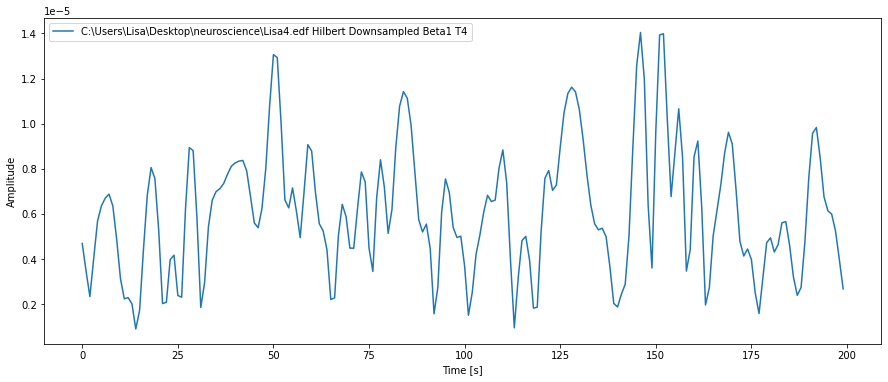

<Figure size 432x288 with 0 Axes>

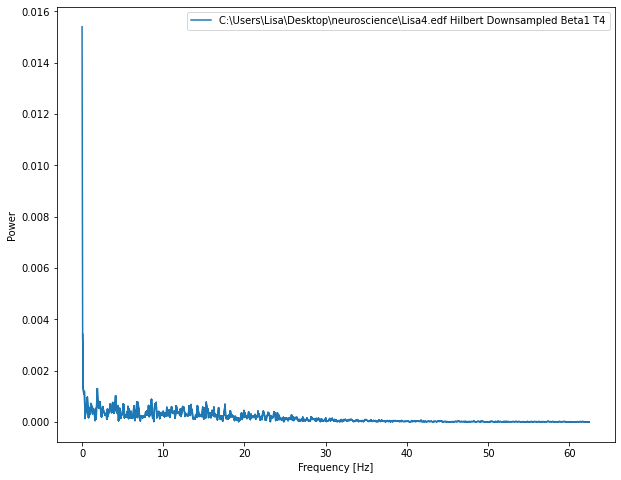

<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

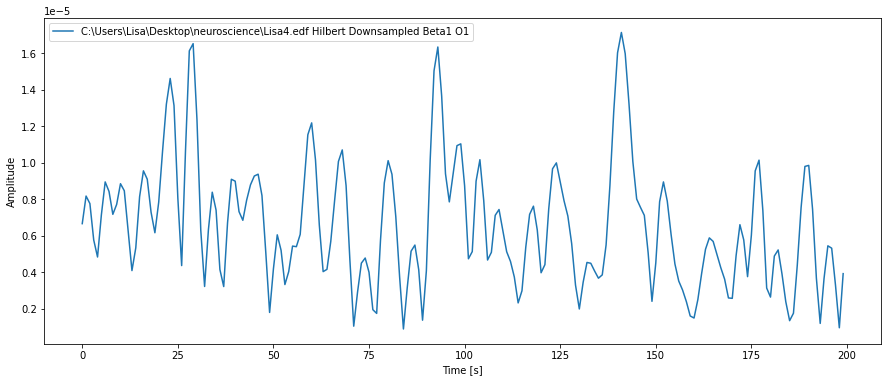

<Figure size 432x288 with 0 Axes>

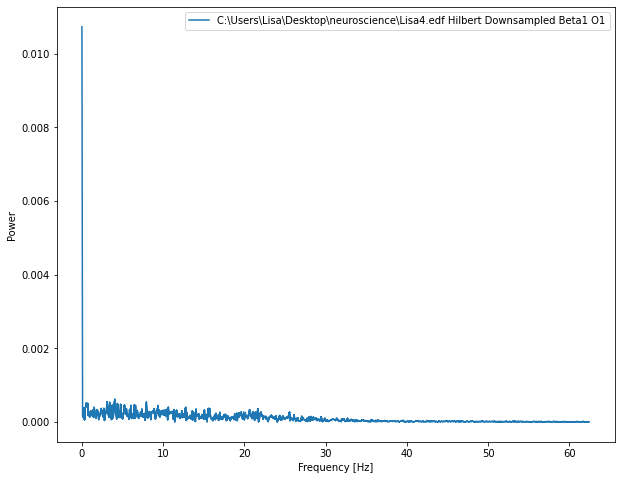

<Figure size 432x288 with 0 Axes>

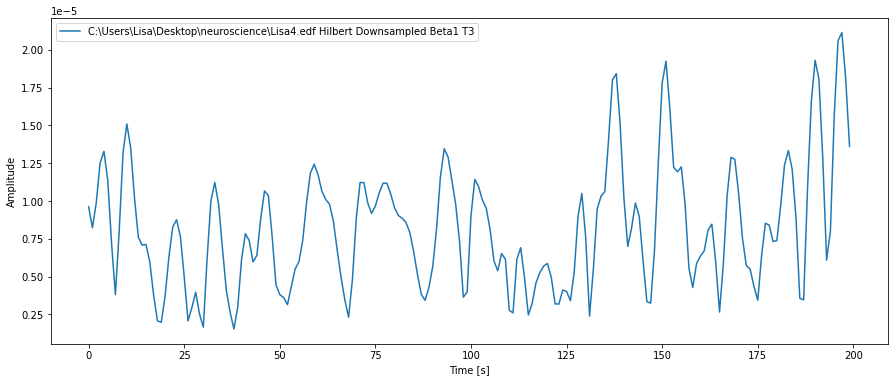

<Figure size 432x288 with 0 Axes>

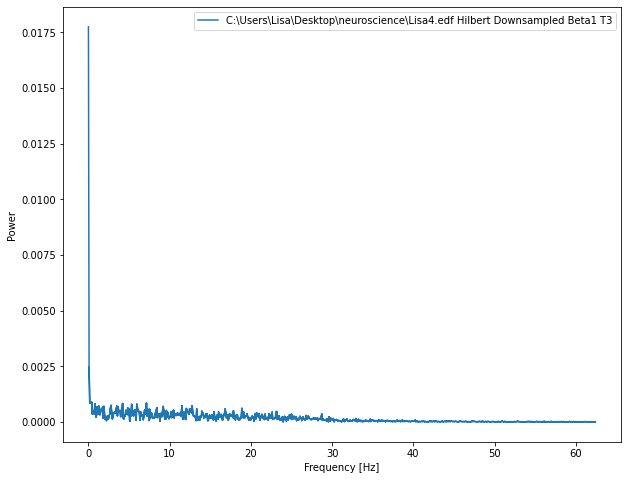

<Figure size 432x288 with 0 Axes>

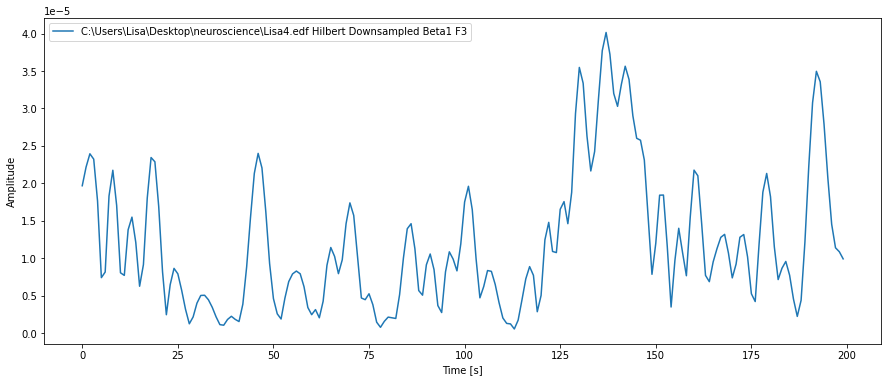

<Figure size 432x288 with 0 Axes>

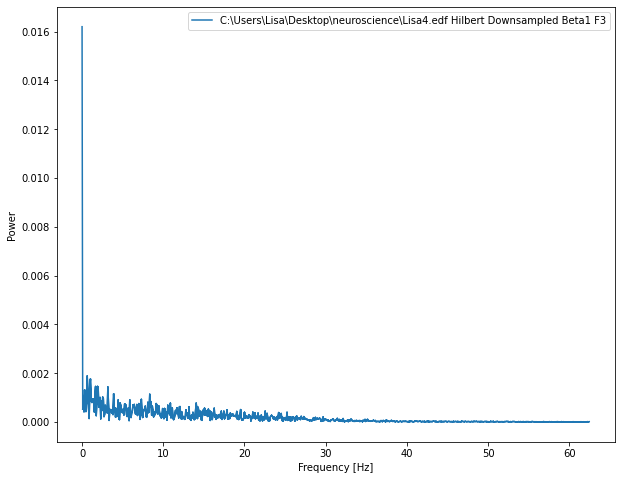

<Figure size 432x288 with 0 Axes>

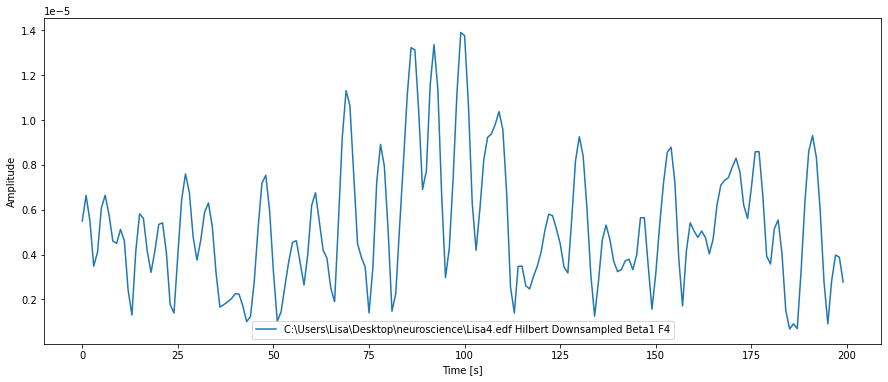

<Figure size 432x288 with 0 Axes>

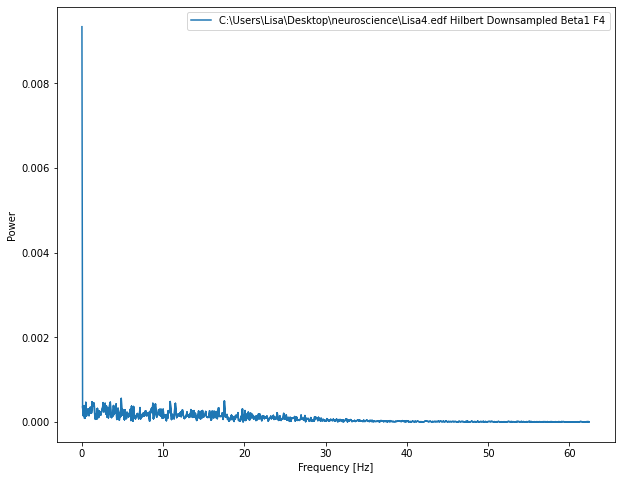

<Figure size 432x288 with 0 Axes>

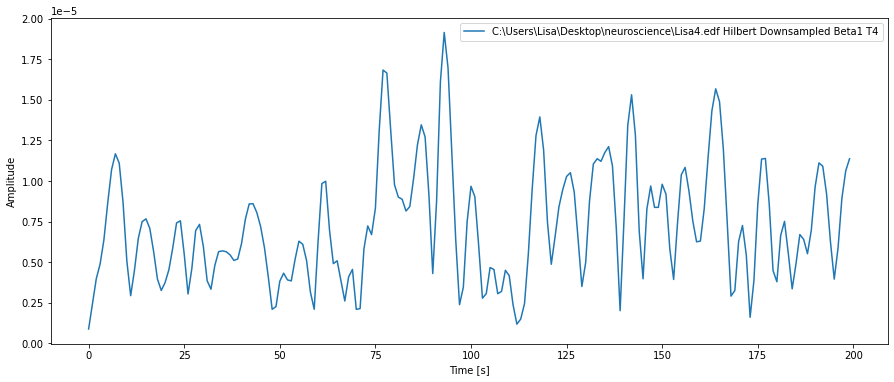

<Figure size 432x288 with 0 Axes>

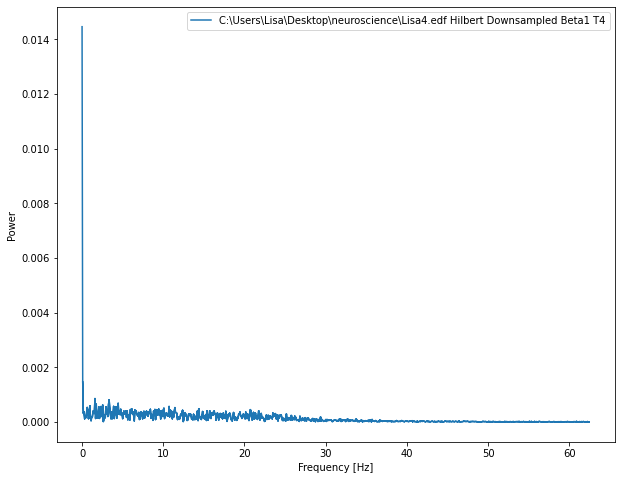

<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

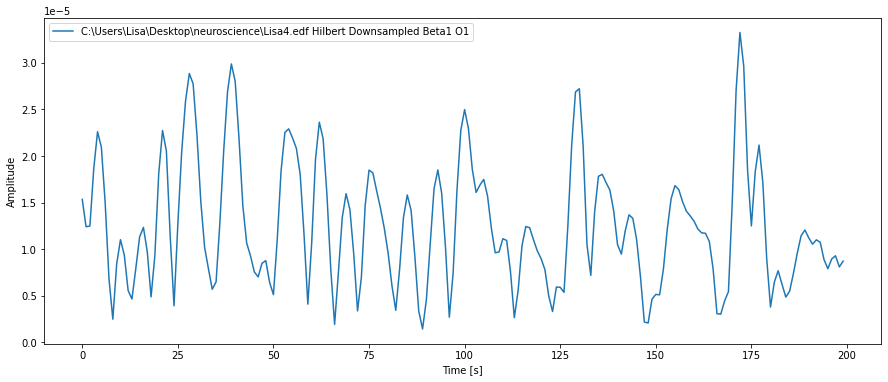

<Figure size 432x288 with 0 Axes>

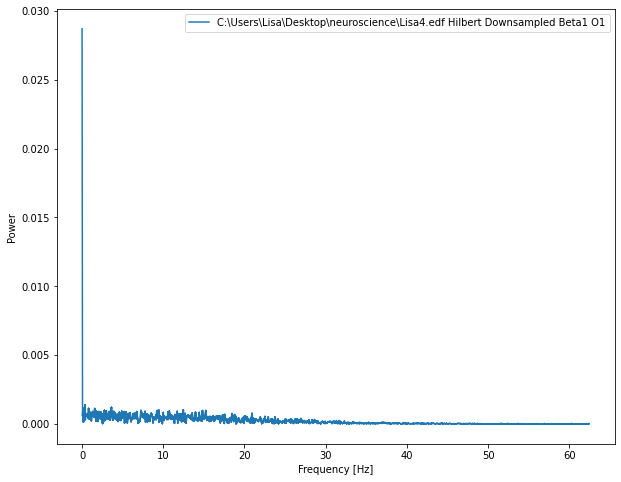

<Figure size 432x288 with 0 Axes>

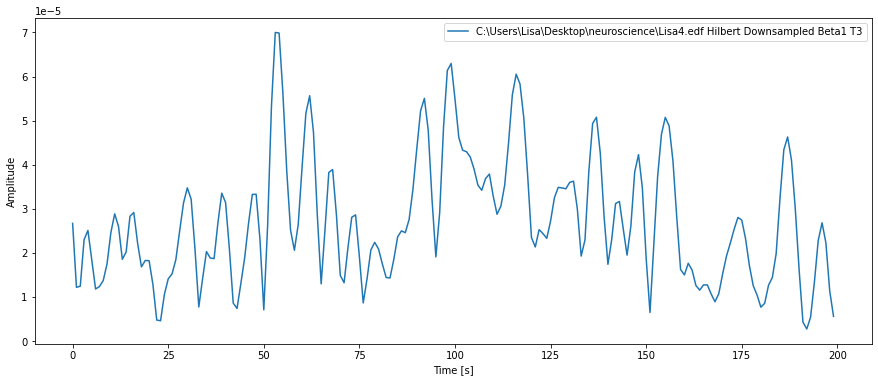

<Figure size 432x288 with 0 Axes>

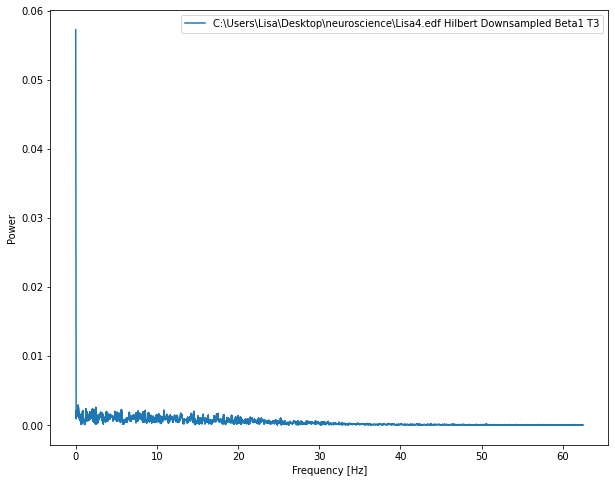

<Figure size 432x288 with 0 Axes>

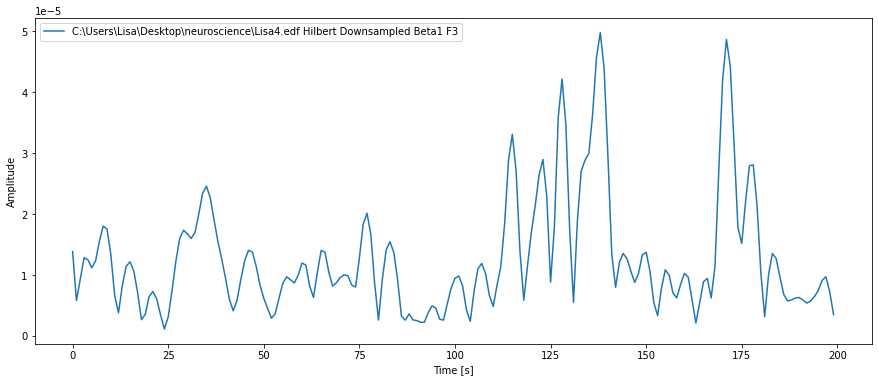

<Figure size 432x288 with 0 Axes>

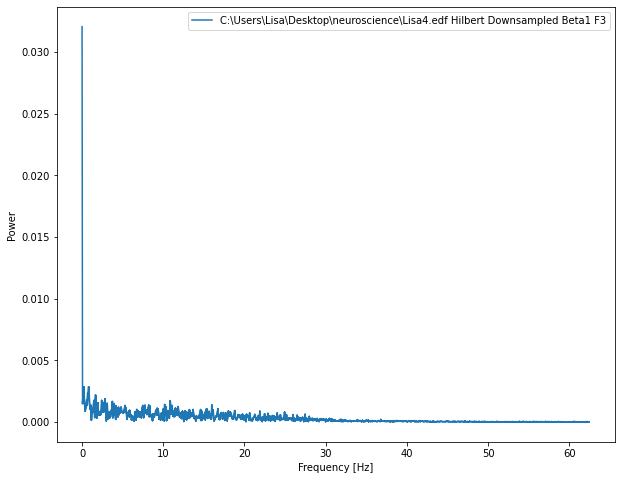

<Figure size 432x288 with 0 Axes>

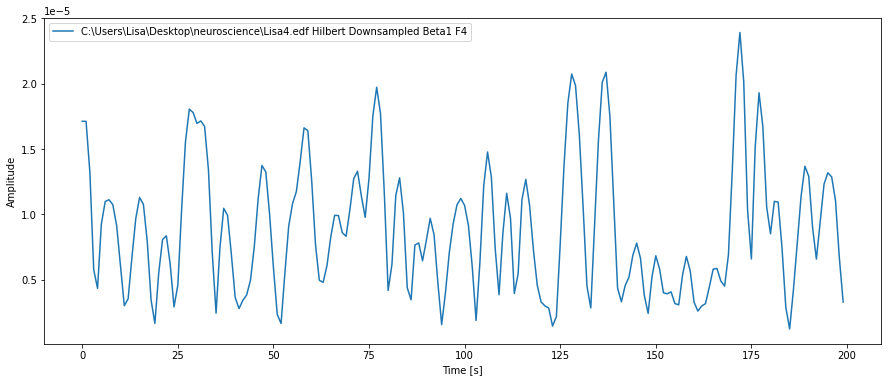

<Figure size 432x288 with 0 Axes>

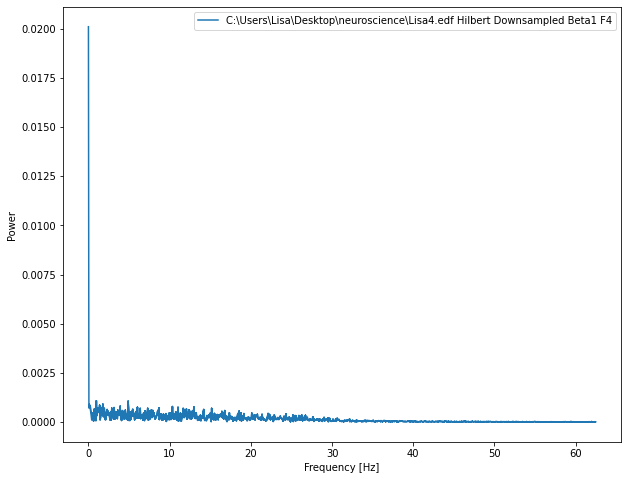

<Figure size 432x288 with 0 Axes>

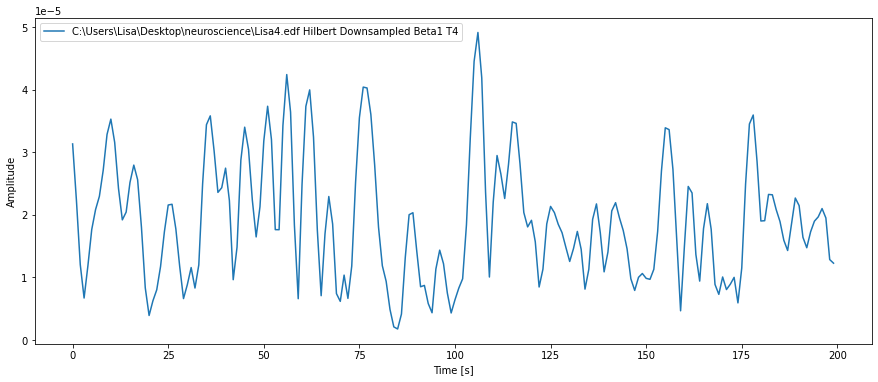

<Figure size 432x288 with 0 Axes>

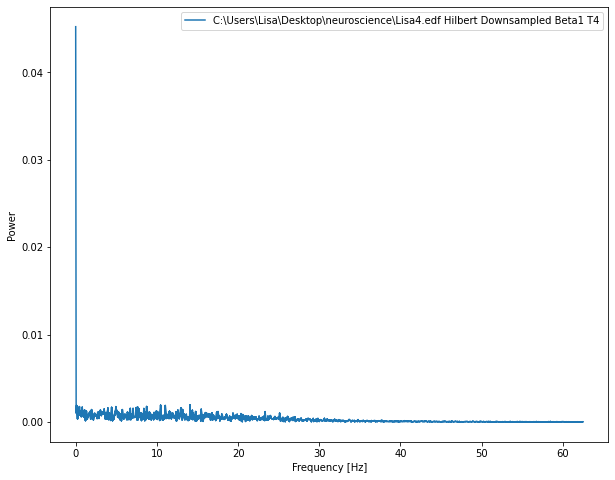

<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>


C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:4: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  temp_cleared_signal = np.empty((_nchan,_num_parts),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:13: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  cleared_signal = np.empty((_nchan,_num_parts-len(temp_bad_parts)),dtype=np.object)
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\105857325.py:17: DeprecationWarning: `np.object` is a d

<Figure size 432x288 with 0 Axes>

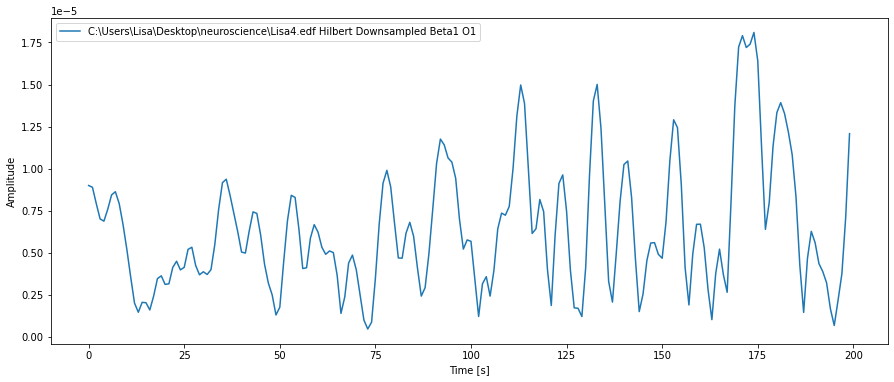

<Figure size 432x288 with 0 Axes>

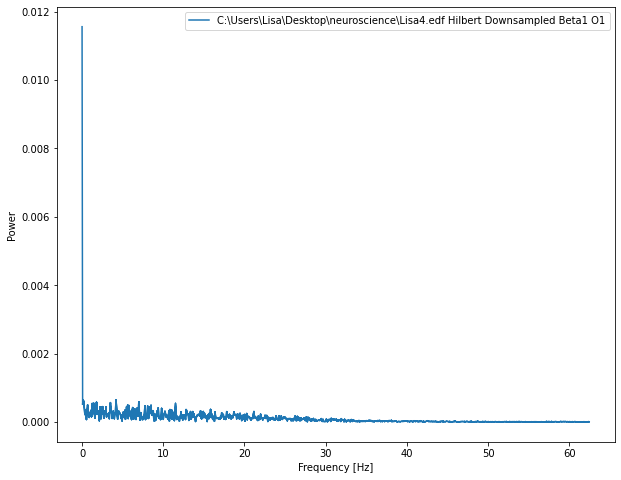

<Figure size 432x288 with 0 Axes>

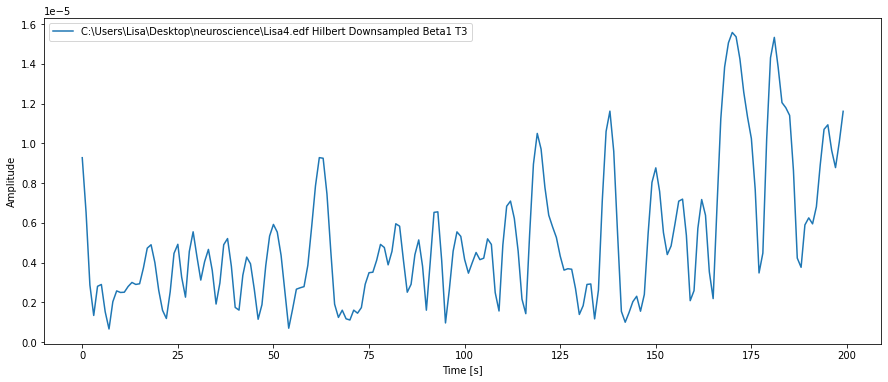

<Figure size 432x288 with 0 Axes>

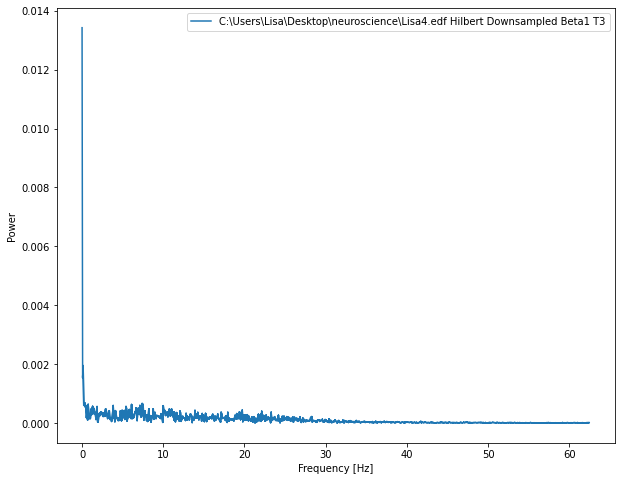

<Figure size 432x288 with 0 Axes>

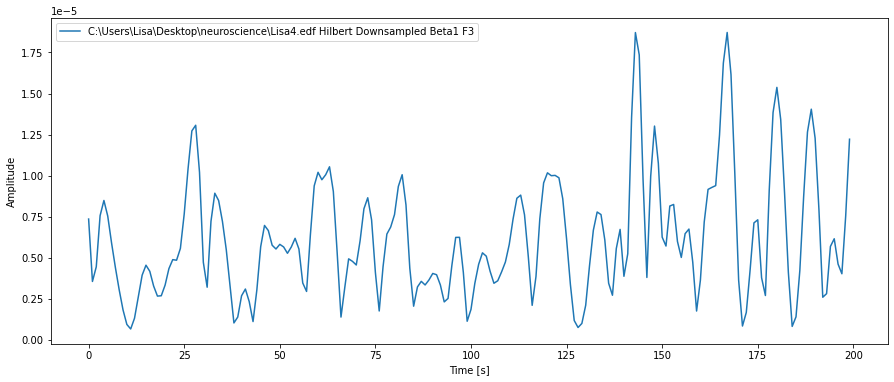

<Figure size 432x288 with 0 Axes>

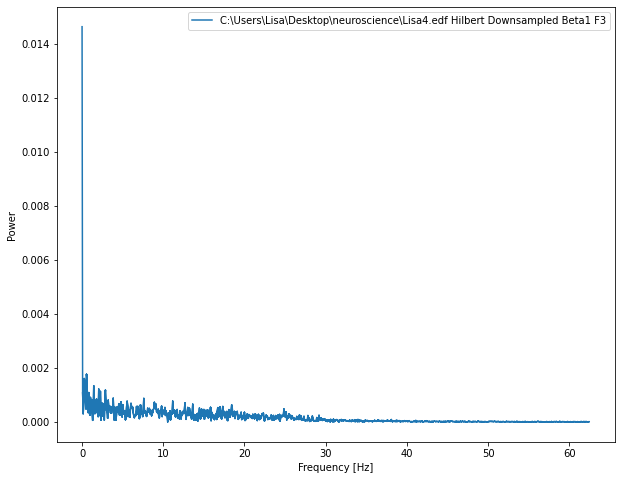

<Figure size 432x288 with 0 Axes>

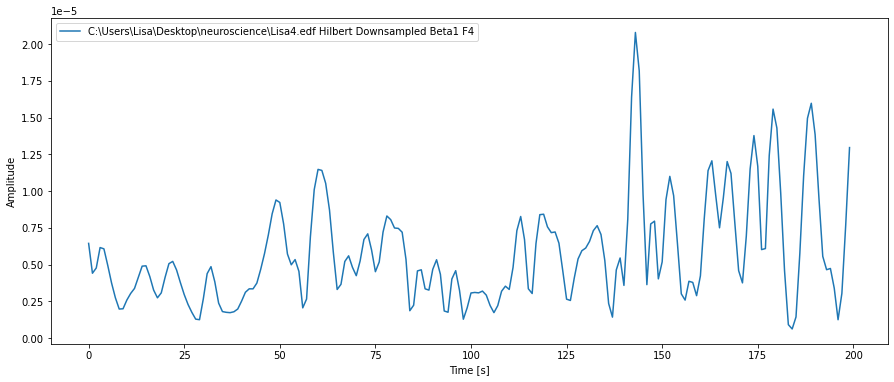

<Figure size 432x288 with 0 Axes>

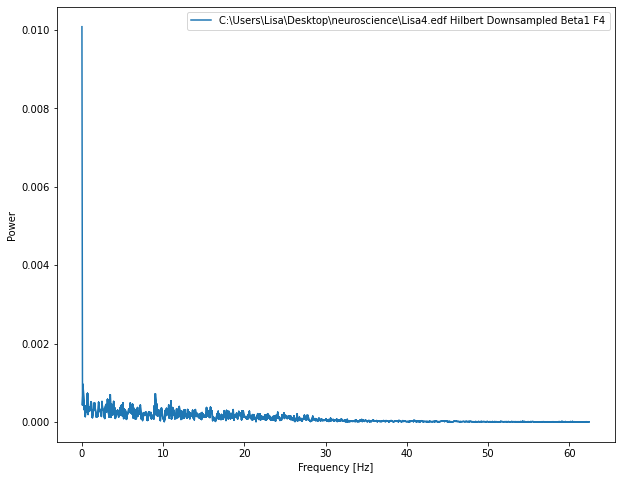

<Figure size 432x288 with 0 Axes>

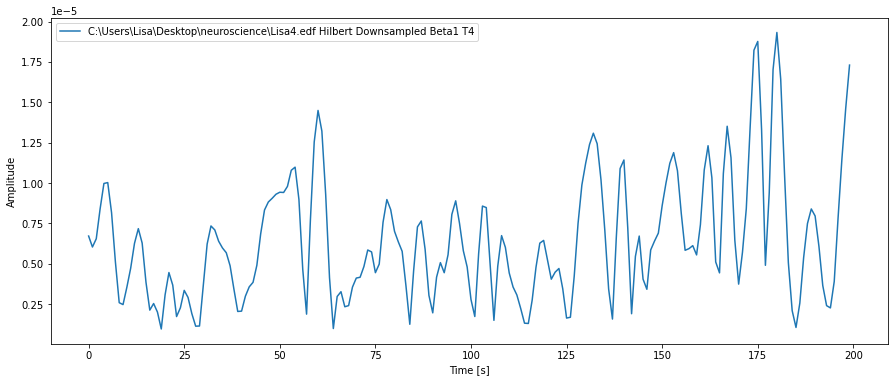

<Figure size 432x288 with 0 Axes>

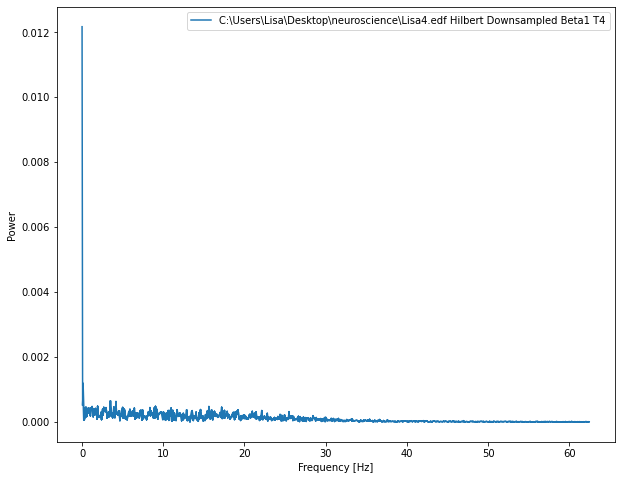

<Figure size 432x288 with 0 Axes>

In [51]:
threshold_v = [4*10**(-4),7*10**(-4),2*10**(-4),4*10**(-4),85*10**(-5),15*10**(-5),3*10**(-4),15*10**(-5)]
for tres, raw_mne1 in enumerate(list_edf):
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    #set threshold
    threshhold=threshold_v[tres]
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,threshhold,nchan)[chan]
    length_main = len(new_file_with_record1[0])
    file_with_record_main = new_file_with_record1
    delta_signal = np.empty((nchan,length_main),dtype= object)
    theta_signal = np.empty((nchan,length_main),dtype=object)
    alpha_signal = np.empty((nchan,length_main),dtype=object)
    beta1_signal = np.empty((nchan,length_main),dtype=object)
    beta2_signal = np.empty((nchan,length_main),dtype=object)
    gamma_signal = np.empty((nchan,length_main),dtype=object)
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)
# работаем с огибающей - преобразование Гильберта
    hilbert_delta_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_theta_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_alpha_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_beta1_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_beta2_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_gamma_signal = np.empty((nchan,length_main),dtype=object)

    for chan in range(0,nchan):
        hilbert_delta_signal[chan] = np.abs(hilbert(delta_signal[chan]))
        hilbert_theta_signal[chan] = np.abs(hilbert(theta_signal[chan]))
        hilbert_alpha_signal[chan] = np.abs(hilbert(alpha_signal[chan]))
        hilbert_beta1_signal[chan] = np.abs(hilbert(beta1_signal[chan]))
        hilbert_beta2_signal[chan] = np.abs(hilbert(beta2_signal[chan]))
        hilbert_gamma_signal[chan] = np.abs(hilbert(gamma_signal[chan]))
        # адаптируем для человеческого глаза 25 кадров в секунду 125/5
    downsampled_coeff = 5
    downsampled_length = int(round(length_main/downsampled_coeff,0))
    downsampled_hilbert_delta_signal = np.empty((nchan,downsampled_length),dtype=object)
    downsampled_hilbert_theta_signal = np.empty((nchan,downsampled_length),dtype=object)
    downsampled_hilbert_alpha_signal = np.empty((nchan,downsampled_length),dtype=object)
    downsampled_hilbert_beta1_signal = np.empty((nchan,downsampled_length),dtype=object)
    downsampled_hilbert_beta2_signal = np.empty((nchan,downsampled_length),dtype=object)
    downsampled_hilbert_gamma_signal = np.empty((nchan,downsampled_length),dtype=object)
    for chan in range(0,nchan):
        counter_downsampled = 0
        for i in range(0,length_main,downsampled_coeff):
            temp_sum_delta = 0
            temp_sum_theta = 0
            temp_sum_alpha = 0
            temp_sum_beta1 = 0
            temp_sum_beta2 = 0
            temp_sum_gamma = 0
            for j in range(0,downsampled_coeff,1):
                temp_sum_delta += hilbert_delta_signal[chan][i+j]
                temp_sum_theta += hilbert_theta_signal[chan][i+j]
                temp_sum_alpha += hilbert_alpha_signal[chan][i+j]
                temp_sum_beta1 += hilbert_beta1_signal[chan][i+j]
                temp_sum_beta2 += hilbert_beta2_signal[chan][i+j]
                temp_sum_gamma += hilbert_gamma_signal[chan][i+j]
            downsampled_hilbert_delta_signal[chan][counter_downsampled] = temp_sum_delta/downsampled_coeff
            downsampled_hilbert_theta_signal[chan][counter_downsampled] = temp_sum_theta/downsampled_coeff
            downsampled_hilbert_alpha_signal[chan][counter_downsampled] = temp_sum_alpha/downsampled_coeff
            downsampled_hilbert_beta1_signal[chan][counter_downsampled] = temp_sum_beta1/downsampled_coeff
            downsampled_hilbert_beta2_signal[chan][counter_downsampled] = temp_sum_beta2/downsampled_coeff
            downsampled_hilbert_gamma_signal[chan][counter_downsampled] = temp_sum_gamma/downsampled_coeff
            counter_downsampled += 1
    for chan in range(0,nchan-1):
        draw_signal(downsampled_hilbert_beta1_signal[chan][200:400],200,1,filename+' Hilbert Downsampled Beta1 '+raw_mne1.ch_names[chan])
        draw_spectr(downsampled_hilbert_beta1_signal[chan],sample_rate_main,filename+' Hilbert Downsampled Beta1 '+raw_mne1.ch_names[chan])

In [95]:
max_chan = max(threshold_v)
# все значения распределяем на 100 корзин/ячеек, аля % распределения по 100% до max
number_levels = 100
for i in range(4):
    print(len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,
                                                      treshhold,nchan)[i]))

9125
9125
9125
9125


In [98]:
# Блоки дальше - для рисования картинок внизу
list_percentage = []
for tres, raw_mne1 in enumerate(list_edf):
    print(raw_mne1)
    treshhold = threshold_v[tres]
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    #set threshold
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,
                                                                part_length_sec,sample_rate1,
                                                                treshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,
                                                      treshhold,nchan)[chan]
    length_main = len(new_file_with_record1[1])
    print(length_main)
    all_bands_tables_percentage_state1 = np.empty((6,nchan,number_levels),dtype=object)
    all_bands_tables_percentage_state1 = create_percent_table(new_file_with_record1,sample_rate1,
                                                        length_main,downsampled_coeff,max_chan,
                                                              number_levels)
    
    list_percentage.append(all_bands_tables_percentage_state1)

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
8500
Signal bands created
Hilbert Channel 0 completed
Hilbert Channel 1 completed
Hilbert Channel 2 completed
Hilbert Channel 3 completed
Hilbert Channel 4 completed
Hilbert Channel 5 completed
Hilbert completed
Downsampled completed
Percentage distribution completed
All bands processing completed
<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
7750
Signal bands created
Hilbert Channel 0 completed
Hilbert Channel 1 completed
Hilbert Channel 2 completed
Hilbert Channel 3 completed
Hilbert Channel 4 completed
Hilbert Channel 5 completed
Hilbert completed
Downsampled completed
Percentage distribution completed
All bands processing completed
<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
6125
Signal bands created
Hilbert Channel 0 completed
Hilbert Channel 1 completed
Hilbert Channel 2 completed
Hilbert Channel 3 completed
Hilbert Channel 4 completed
Hilbert Channel 5 completed
Hilbert completed
Do

In [123]:
weightedhead_chans_ = np.empty((nchan,8),dtype=np.object)
weightedhead_chans_

array([[None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None],
       [None, None, None, None, None, None, None, None]], dtype=object)

In [101]:
# Получаем из распределения по 100 ячеек - одно качественное значение для рисования 
# значения амплитуды по одному каналу для одной картинки (если делать видео, то )
for all_bands_tables_percentage_state1 in list_percentage:
weightedhead_chans_delta = np.empty((nchan,1),dtype=np.object)
weightedhead_chans_theta = np.empty((nchan,1),dtype=np.object)
weightedhead_chans_alpha = np.empty((nchan,1),dtype=np.object)
weightedhead_chans_beta1 = np.empty((nchan,1),dtype=np.object)
weightedhead_chans_beta2 = np.empty((nchan,1),dtype=np.object)
weightedhead_chans_gamma = np.empty((nchan,1),dtype=np.object)

# сюда опционально заносим или % распределение по 1му состоянию, или по 2му или разницу
weightedhead_chans_delta = weightedhead_chans(all_bands_tables_percentage_state1[0],number_levels)
weightedhead_chans_theta = weightedhead_chans(all_bands_tables_percentage_state1[1],number_levels)
weightedhead_chans_alpha = weightedhead_chans(all_bands_tables_percentage_state1[2],number_levels)
weightedhead_chans_beta1 = weightedhead_chans(all_bands_tables_percentage_state1[3],number_levels)
weightedhead_chans_beta2 = weightedhead_chans(all_bands_tables_percentage_state1[4],number_levels)
weightedhead_chans_gamma = weightedhead_chans(all_bands_tables_percentage_state1[5],number_levels)

In [131]:
# то же самое,только удобнее и с 8 файлами
weightedhead_chans_all_list = []
for all_bands_tables_percentage_state1 in list_percentage:
    weightedhead_chans_all = np.empty((nchan,6),dtype=np.object)
    weightedhead_chans_all = list(map(lambda table: weightedhead_chans(table, number_levels), all_bands_tables_percentage_state1))
    weightedhead_chans_all_list.append(weightedhead_chans_all)

In [132]:
# 8 файлов по 6 частотам по 6 электродов  
np.array(weightedhead_chans_all_list).shape

(8, 6, 6, 1)

In [102]:
print(weightedhead_chans_delta)
print(weightedhead_chans_theta)
print(weightedhead_chans_alpha)
print(weightedhead_chans_beta1)
print(weightedhead_chans_beta2)
print(weightedhead_chans_gamma)

[[1.26]
 [1.121]
 [2.4889999999999994]
 [1.986]
 [1.284]
 [1.326]]
[[1.111]
 [1.042]
 [1.9189999999999998]
 [1.559]
 [1.1189999999999998]
 [1.179]]
[[1.3920000000000001]
 [1.2759999999999998]
 [1.8380000000000003]
 [1.4480000000000002]
 [1.493]
 [1.567]]
[[1.247]
 [1.372]
 [1.4560000000000002]
 [1.183]
 [1.2899999999999998]
 [1.3070000000000002]]
[[1.3689999999999998]
 [1.972]
 [1.5499999999999998]
 [1.2659999999999998]
 [1.691]
 [1.377]]
[[1.612]
 [2.3119999999999994]
 [1.7000000000000002]
 [1.432]
 [1.9579999999999997]
 [1.635]]


In [103]:
nchan_aug = 20

# Дополняем обычные электроды воображаемыми, для лучшей картинки
augumented_weightedhead_chans_delta = np.empty((nchan_aug,1),dtype=np.object)
augumented_weightedhead_chans_theta = np.empty((nchan_aug,1),dtype=np.object)
augumented_weightedhead_chans_alpha = np.empty((nchan_aug,1),dtype=np.object)
augumented_weightedhead_chans_beta1 = np.empty((nchan_aug,1),dtype=np.object)
augumented_weightedhead_chans_beta2 = np.empty((nchan_aug,1),dtype=np.object)
augumented_weightedhead_chans_gamma = np.empty((nchan_aug,1),dtype=np.object)

augumented_weightedhead_chans_delta = augumenting_electrodes(weightedhead_chans_delta,1)
augumented_weightedhead_chans_theta = augumenting_electrodes(weightedhead_chans_theta,1)
augumented_weightedhead_chans_alpha = augumenting_electrodes(weightedhead_chans_alpha,1)
augumented_weightedhead_chans_beta1 = augumenting_electrodes(weightedhead_chans_beta1,1)
augumented_weightedhead_chans_beta2 = augumenting_electrodes(weightedhead_chans_beta2,1)
augumented_weightedhead_chans_gamma = augumenting_electrodes(weightedhead_chans_gamma,1)

In [136]:
# то же,только удобнее
augumented_weightedhead_chans_all_list = []
for weightedhead_chans_all in weightedhead_chans_all_list:
    augumented_weightedhead_chans_all = np.empty((nchan_aug,6),dtype=np.object)
    augumented_weightedhead_chans_all = list(map(lambda table: augumenting_electrodes(table, 1),
                                                 weightedhead_chans_all))
    augumented_weightedhead_chans_all_list.append(augumented_weightedhead_chans_all)

In [158]:
#1 файл ритм дельта 
augumented_weightedhead_chans_all_list[0][0][0][0]

1.5149249999999996

In [104]:
# смотрим значения, чтобы прикинуть шкалы для отображения
print(augumented_weightedhead_chans_delta)
print(augumented_weightedhead_chans_theta)
print(augumented_weightedhead_chans_alpha)
print(augumented_weightedhead_chans_beta1)
print(augumented_weightedhead_chans_beta2)
print(augumented_weightedhead_chans_gamma)

[[0.6642874999999998]
 [1.11875]
 [0.54465]
 [2.4889999999999994]
 [1.986]
 [1.2444999999999997]
 [0.993]
 [0.28025]
 [1.121]
 [0.5605]
 [0.642]
 [1.284]
 [0.321]
 [0.63]
 [0.663]
 [1.26]
 [1.326]
 [0.3570375]
 [0.6465000000000001]
 [0.37965000000000004]]
[[0.518825]
 [0.8694999999999999]
 [0.4317125]
 [1.9189999999999998]
 [1.559]
 [0.9594999999999999]
 [0.7795]
 [0.2605]
 [1.042]
 [0.521]
 [0.5594999999999999]
 [1.1189999999999998]
 [0.27974999999999994]
 [0.5555]
 [0.5895]
 [1.111]
 [1.179]
 [0.316825]
 [0.5725]
 [0.3367125]]
[[0.5073500000000001]
 [0.8215000000000001]
 [0.41798750000000007]
 [1.8380000000000003]
 [1.4480000000000002]
 [0.9190000000000002]
 [0.7240000000000001]
 [0.31899999999999995]
 [1.2759999999999998]
 [0.6379999999999999]
 [0.7465]
 [1.493]
 [0.37325]
 [0.6960000000000001]
 [0.7835]
 [1.3920000000000001]
 [1.567]
 [0.39585000000000004]
 [0.73975]
 [0.4477375]]
[[0.41545000000000004]
 [0.6597500000000001]
 [0.344125]
 [1.4560000000000002]
 [1.183]
 [0.7280000000

In [149]:
# max(augumented_weightedhead_chans_all_list[0][0])
# лист максимумов по всем ритмам по всем файлам
keys = ['delta', 'theta', 'alpha', 'beta1', 'beta2','gamma']
list_max = []
for file in augumented_weightedhead_chans_all_list:
    list_rythms = {}
    for i, rythm in enumerate(file):
        list_rythms[keys[i]] = max(rythm)
    list_max.append(list_rythms)

In [151]:
list_min = []
for file in augumented_weightedhead_chans_all_list:
    list_rythms = {}
    for i, rythm in enumerate(file):
        list_rythms[keys[i]] = min(rythm)
    list_min.append(list_rythms)     

48

In [165]:
# Задаем шкалы для рисования раскидываем значения из нашего массива;посчитаем для первого файла
for i in range(len(list_min)):
    step_main = 0.1
    max_delta = list_max[i]['delta']
    step_delta = step_main
    min_delta = list_min[i]['delta']
    max_theta = list_max[i]['theta']
    step_theta = step_main
    min_theta = list_min[i]['theta']
    max_alpha = list_max[i]['alpha']
    step_alpha = step_main
    min_alpha = list_min[i]['alpha']
    max_beta1 = list_max[i]['beta1']
    step_beta1 = step_main
    min_beta1 = list_min[i]['beta1']
    max_beta2 = list_max[i]['beta2']
    step_beta2 = step_main
    min_beta2 = list_min[i]['beta2']
    max_gamma = list_max[i]['gamma']
    step_gamma = step_main
    min_gamma = list_min[i]['gamma']


In [173]:
list_min

[{'delta': array([0.2645], dtype=object),
  'theta': array([0.2535], dtype=object),
  'alpha': array([0.253], dtype=object),
  'beta1': array([0.2525], dtype=object),
  'beta2': array([0.25375], dtype=object),
  'gamma': array([0.26575], dtype=object)},
 {'delta': array([0.26425], dtype=object),
  'theta': array([0.25075], dtype=object),
  'alpha': array([0.27525], dtype=object),
  'beta1': array([0.25], dtype=object),
  'beta2': array([0.25], dtype=object),
  'gamma': array([0.25075], dtype=object)},
 {'delta': array([0.326], dtype=object),
  'theta': array([0.27474999999999994], dtype=object),
  'alpha': array([0.26825], dtype=object),
  'beta1': array([0.253], dtype=object),
  'beta2': array([0.25699999999999995], dtype=object),
  'gamma': array([0.2695], dtype=object)},
 {'delta': array([0.29924999999999996], dtype=object),
  'theta': array([0.26225], dtype=object),
  'alpha': array([0.25799999999999995], dtype=object),
  'beta1': array([0.2545], dtype=object),
  'beta2': array([0.

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

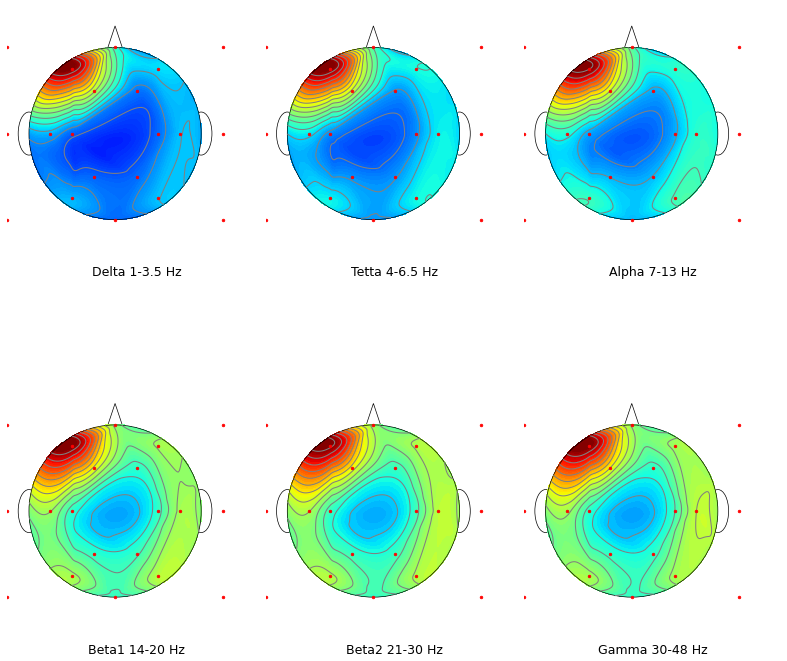

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

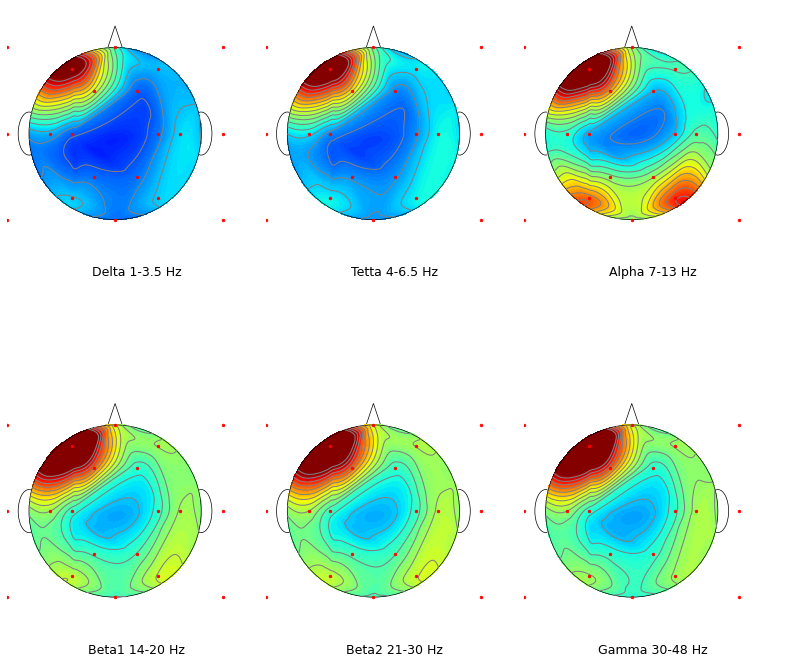

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

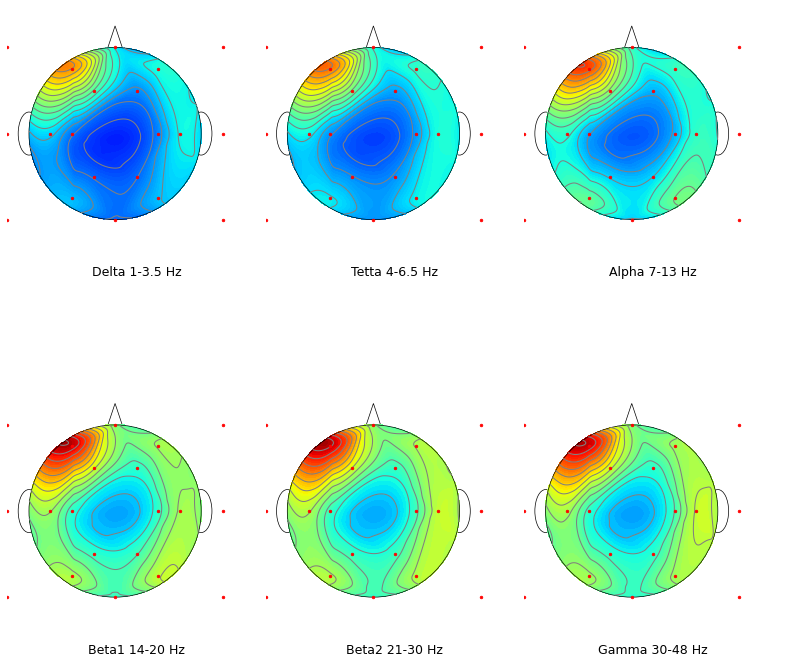

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

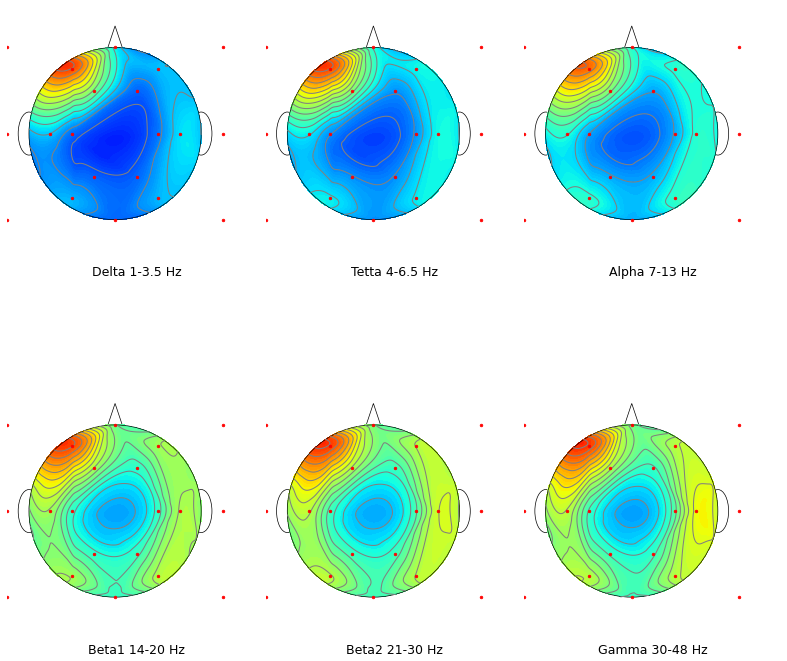

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

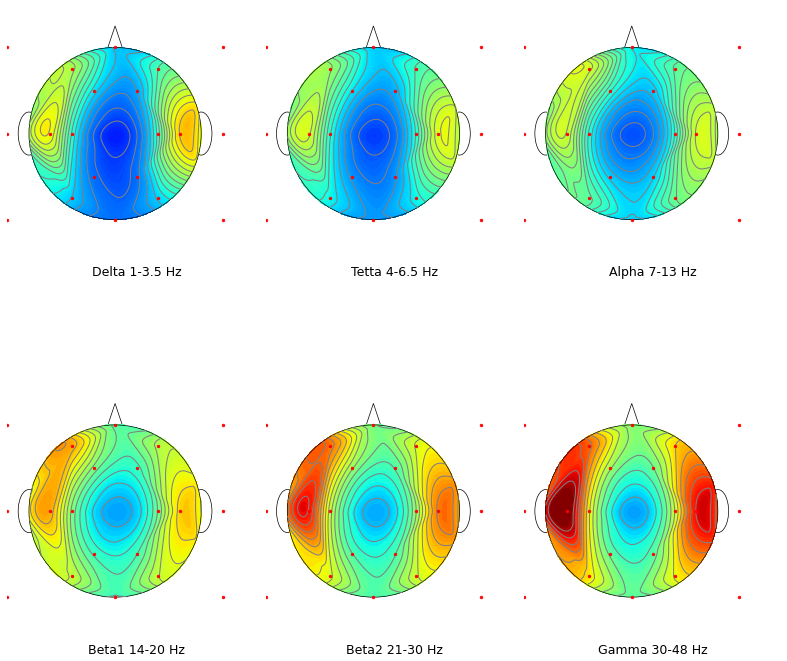

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

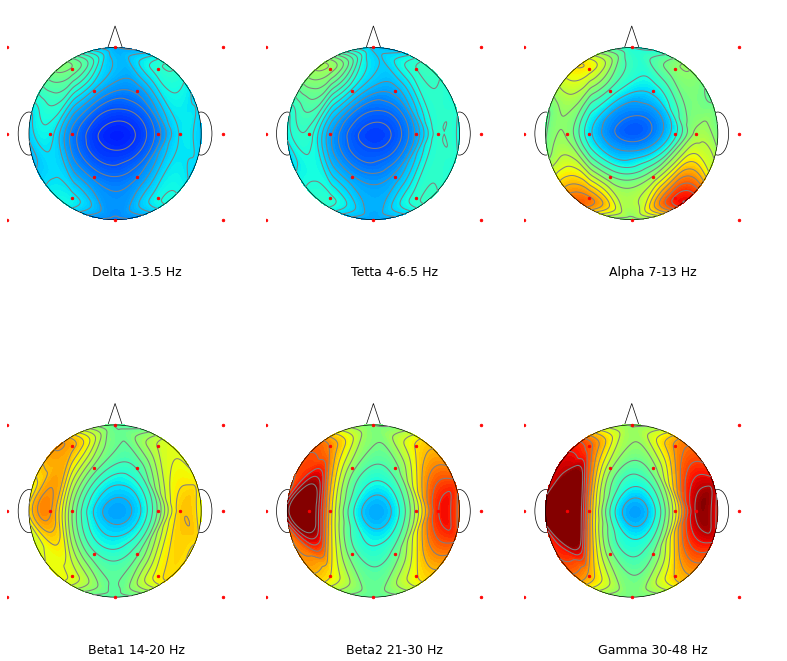

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

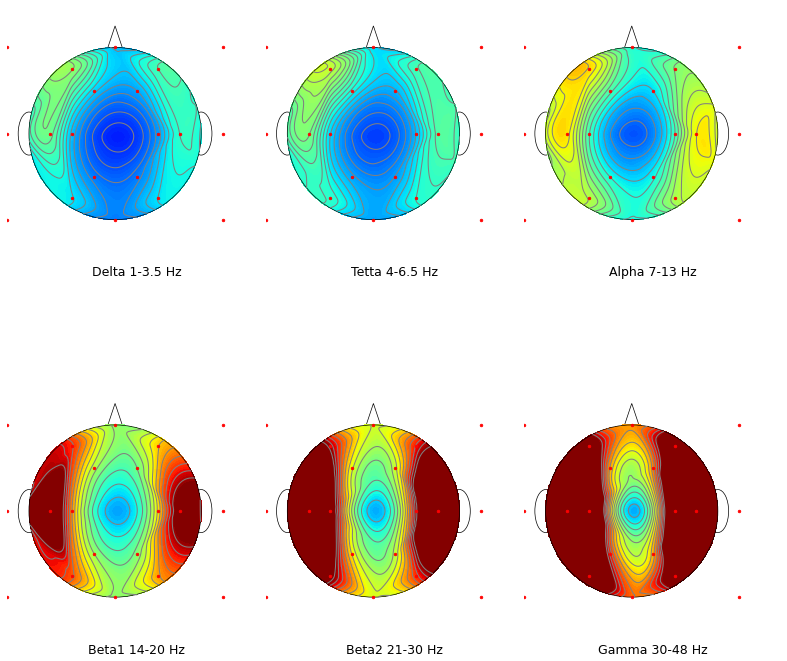

C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:75: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:77: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:79: RuntimeWarning: invalid value encountered in greater
  if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:81: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:83: RuntimeWarning: invalid value encountered in greater
  if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
C:\Users\Lisa\AppData\Local\Temp\ipykernel_17168\602923716.py:85: RuntimeWarning: invalid value

<Figure size 432x288 with 0 Axes>

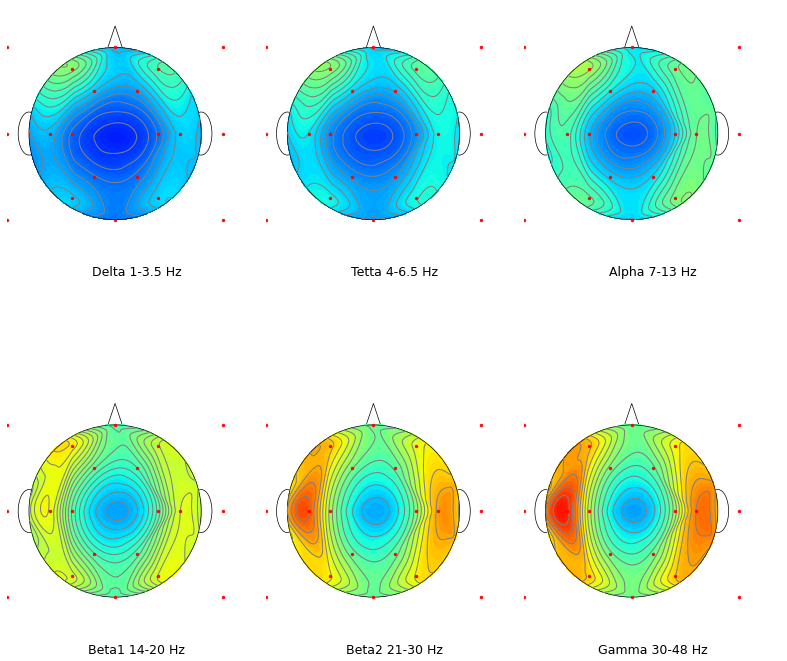

<Figure size 432x288 with 0 Axes>

In [175]:
# Рисуем одну картинку
# Дополненные координаты с воображаемыми электродами для хорошего рисования
for file in augumented_weightedhead_chans_all_list:

    file1 = file
    augumented_weightedhead_chans_delta = file1[0]
    augumented_weightedhead_chans_theta = file1[1]
    augumented_weightedhead_chans_alpha = file1[2]
    augumented_weightedhead_chans_beta1 = file1[3]
    augumented_weightedhead_chans_beta2 = file1[4]
    augumented_weightedhead_chans_gamma = file1[5]

    koord_aug = [[0,5],[2.5,5],[5,5],
                 [1.5,4.5],[3.5,4.5],
                 [2,4],[3,4],
                 [0,3],[1,3],[1.5,3],[3.5,3],[4,3],[5,3],
                 [2,2],[3,2],
                 [1.5,1.5],[3.5,1.5],
                 [0,1],[2.5,1],[5,1]]

    end_point = 1
    counter = 0
    time_points = np.arange(counter,end_point,1)

    fig = plt.figure(figsize=(20,20), dpi = 50)
    gs = gridspec.GridSpec(2, 3)

    for time_point in time_points:
        x_counter = 0
        y_counter = 0
        for one_time in range(0,6):
            # Берем набор значений сигнала для рисования
            point_amplitude = []        
            if (x_counter==0 and y_counter==0):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_delta[chan][time_point])
                    level_points = np.arange(-1,max_delta+step_delta,step_delta)
            if (x_counter==0 and y_counter==1):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_theta[chan][time_point])
                    level_points = np.arange(-1,max_theta+step_theta,step_theta)
            if (x_counter==0 and y_counter==2):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_alpha[chan][time_point])
                    level_points = np.arange(-1,max_alpha+step_alpha,step_alpha)
            if (x_counter==1 and y_counter==0):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_beta1[chan][time_point])
                    level_points = np.arange(-1,max_beta1+step_beta1,step_beta1)
            if (x_counter==1 and y_counter==1):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_beta2[chan][time_point])
                    level_points = np.arange(-1,max_beta2+step_beta2,step_beta2)
            if (x_counter==1 and y_counter==2):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_weightedhead_chans_gamma[chan][time_point])
                    level_points = np.arange(-1,max_gamma+step_gamma,step_gamma)

            N = 200             # number of points for interpolation
            xy_center = [2.5,3]   # center of the plot
            radius = 2          # radius

            x,y = [],[]
            for i in koord_aug:
                x.append(i[0])
                y.append(i[1])
            z = point_amplitude
            xi = np.linspace(0, 5, N)
            yi = np.linspace(0, 5, N)
            zi = scipy.interpolate.griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')
            for i in range(N):
                for j in range(N):
                    #if zi[j,i] < 0:
                    #    zi[j,i] = 0
                    if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
                        zi[j,i] = max_delta
                    if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
                        zi[j,i] = max_theta
                    if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
                        zi[j,i] = max_alpha                
                    if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
                        zi[j,i] = max_beta1
                    if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
                        zi[j,i] = max_beta2
                    if (x_counter==1 and y_counter==2) and zi[j,i] > max_gamma:
                        zi[j,i] = max_gamma        
            # set points > radius to not-a-number. They will not be plotted.
            # the dr/2 makes the edges a bit smoother
            dr = xi[1] - xi[0]
            for i in range(N):
                for j in range(N):
                    r = np.sqrt((xi[i] - xy_center[0])**2 + (yi[j] - xy_center[1])**2)
                    if (r - dr/2) > radius:
                        zi[j,i] = "nan"

            # set aspect = 1 to make it a circle
            ax = plt.subplot(gs[x_counter,y_counter], aspect = 1)
            if (x_counter==0 and y_counter==0):
                plt.xlabel('Delta '+str(bands_freq["delta_min"])+'-'+str(bands_freq["delta_max"])+' Hz',
                           fontsize=18)

            if (x_counter==0 and y_counter==1):
                plt.xlabel('Tetta '+str(bands_freq["theta_min"])+'-'+str(bands_freq["theta_max"])+' Hz',
                           fontsize=18)

            if (x_counter==0 and y_counter==2):
                plt.xlabel('Alpha '+str(bands_freq["alpha_min"])+'-'+str(bands_freq["alpha_max"])+' Hz',
                           fontsize=18)

            if (x_counter==1 and y_counter==0):
                plt.xlabel('Beta1 '+str(bands_freq["beta1_min"])+'-'+str(bands_freq["beta1_max"])+' Hz',
                           fontsize=18)

            if (x_counter==1 and y_counter==1):
                plt.xlabel('Beta2 '+str(bands_freq["beta2_min"])+'-'+str(bands_freq["beta2_max"])+' Hz',
                           fontsize=18)

            if (x_counter==1 and y_counter==2):
                plt.xlabel('Gamma '+str(bands_freq["gamma_min"])+'-'+str(bands_freq["gamma_max"])+' Hz', 
                           fontsize=18)

            y_counter += 1
            if (y_counter == 3 and x_counter == 0):
                x_counter = 1
                y_counter = 0

            # use different number of levels for the fill and the lines
            CS = ax.contourf(xi, yi, zi, level_points, cmap = plt.cm.jet, zorder = 1)
            ax.contour(xi, yi, zi, 15, colors = "grey", zorder = 2)

            # add the data points
            # I guess there are no data points outside the head...
            ax.scatter(x, y, marker = 'o', c = 'r', s = 15, zorder = 3)
            # draw a circle
            circle = matplotlib.patches.Circle(xy = xy_center, radius = radius, edgecolor = "k",
                                               facecolor = "none")
            ax.add_patch(circle)
            # make the axis invisible 
            for loc, spine in ax.spines.items():
                spine.set_linewidth(0)
            # remove the ticks
            ax.set_xticks([])
            ax.set_yticks([])
            # Add some body parts. Hide unwanted parts by setting the zorder low
            # add two ears
            circle = matplotlib.patches.Ellipse(xy = [0.5,3], width = 0.5, height = 1.0, angle = 0,
                                                edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(circle)
            circle = matplotlib.patches.Ellipse(xy = [4.5,3], width = 0.5, height = 1.0, angle = 0,
                                                edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(circle)
            # add a nose
            xy = [[2,4], [2.5,5.5],[3,4]]
            polygon = matplotlib.patches.Polygon(xy = xy, edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(polygon) 
            # set axes limits
            ax.set_xlim(0, 6)
            ax.set_ylim(0, 6)
        fig.subplots_adjust(wspace=0, hspace=0)
        plt.savefig('C:\\Users\\Lisa\\Desktop\\physiology' + str(counter).zfill(6) + '_fig.pdf')

        # make a color bar
        #cbar = fig.colorbar(CS, ax=ax)

        plt.show()
        counter += 1
        plt.clf()
        gc.collect()

In [252]:
downsampled_length = int(round(length_main/downsampled_coeff,0))
downsampled_length

2500

In [264]:
# Повторяем ряд шагов для рисования набора картинок - т.к. идет рисование не по усредненным, а по предобра
#ботанным
threshold_v = [4*10**(-4),7*10**(-4),2*10**(-4),4*10**(-4),85*10**(-5),15*10**(-5),3*10**(-4),15*10**(-5)]
list_down_hilbert = []
for tres, raw_mne1 in enumerate(list_edf):
    print(raw_mne1)
    sample_rate1 = raw_mne1.info['sfreq']
    file_with_record_main = raw_mne1.get_data()
    #set threshold
    threshhold=threshold_v[tres]
    new_file_with_record1 = np.zeros((nchan,len(clearing_signal(file_with_record_main,part_length_sec,sample_rate1,
                                                                threshhold,nchan)[0])))
    for chan in range(0,nchan):
        new_file_with_record1[chan] = clearing_signal(file_with_record_main,part_length_sec,sample_rate1,
                                                      threshhold,nchan)[chan]
    length_main = len(new_file_with_record1[0])
    file_with_record_main = new_file_with_record1
    delta_signal = np.empty((nchan,length_main),dtype= object)
    theta_signal = np.empty((nchan,length_main),dtype=object)
    alpha_signal = np.empty((nchan,length_main),dtype=object)
    beta1_signal = np.empty((nchan,length_main),dtype=object)
    beta2_signal = np.empty((nchan,length_main),dtype=object)
    gamma_signal = np.empty((nchan,length_main),dtype=object)
    
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)
        
# работаем с огибающей - преобразование Гильберта
    hilbert_delta_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_theta_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_alpha_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_beta1_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_beta2_signal = np.empty((nchan,length_main),dtype=object)
    hilbert_gamma_signal = np.empty((nchan,length_main),dtype=object)

    for chan in range(0,nchan):
        hilbert_delta_signal[chan] = np.abs(hilbert(delta_signal[chan]))
        hilbert_theta_signal[chan] = np.abs(hilbert(theta_signal[chan]))
        hilbert_alpha_signal[chan] = np.abs(hilbert(alpha_signal[chan]))
        hilbert_beta1_signal[chan] = np.abs(hilbert(beta1_signal[chan]))
        hilbert_beta2_signal[chan] = np.abs(hilbert(beta2_signal[chan]))
        hilbert_gamma_signal[chan] = np.abs(hilbert(gamma_signal[chan]))
        # адаптируем для человеческого глаза 25 кадров в секунду 125/5
    downsampled_coeff = 5
    downsampled_length = int(round(length_main/downsampled_coeff,0))
    downsampled_hilbert_all_signal = np.empty((6,nchan,downsampled_length),dtype=object)
    
    for chan in range(0,nchan):
        counter_downsampled = 0
        for i in range(0,length_main,downsampled_coeff):
            temp_sum_delta = 0
            temp_sum_theta = 0
            temp_sum_alpha = 0
            temp_sum_beta1 = 0
            temp_sum_beta2 = 0
            temp_sum_gamma = 0
            for j in range(0,downsampled_coeff,1):
                temp_sum_delta += hilbert_delta_signal[chan][i+j]
                temp_sum_theta += hilbert_theta_signal[chan][i+j]
                temp_sum_alpha += hilbert_alpha_signal[chan][i+j]
                temp_sum_beta1 += hilbert_beta1_signal[chan][i+j]
                temp_sum_beta2 += hilbert_beta2_signal[chan][i+j]
                temp_sum_gamma += hilbert_gamma_signal[chan][i+j]
            
            downsampled_hilbert_all_signal[0][chan][counter_downsampled] = temp_sum_delta/downsampled_coeff
            downsampled_hilbert_all_signal[1][chan][counter_downsampled] = temp_sum_theta/downsampled_coeff
            downsampled_hilbert_all_signal[2][chan][counter_downsampled] = temp_sum_alpha/downsampled_coeff
            downsampled_hilbert_all_signal[3][chan][counter_downsampled] = temp_sum_beta1/downsampled_coeff
            downsampled_hilbert_all_signal[4][chan][counter_downsampled] = temp_sum_beta2/downsampled_coeff
            downsampled_hilbert_all_signal[5][chan][counter_downsampled] = temp_sum_gamma/downsampled_coeff
            counter_downsampled += 1
    list_down_hilbert.append(downsampled_hilbert_all_signal)

<RawEDF | 1Vlad.edf, 6 x 8875 (71.0 s), ~427 kB, data loaded>
<RawEDF | 2Vlad.edf, 6 x 7875 (63.0 s), ~380 kB, data loaded>
<RawEDF | 3Vlad.edf, 6 x 15875 (127.0 s), ~755 kB, data loaded>
<RawEDF | 4Vlad.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>
<RawEDF | Lisa1.edf, 6 x 8625 (69.0 s), ~415 kB, data loaded>
<RawEDF | Lisa2.edf, 6 x 12250 (98.0 s), ~585 kB, data loaded>
<RawEDF | Lisa3.edf, 6 x 15000 (120.0 s), ~714 kB, data loaded>
<RawEDF | Lisa4.edf, 6 x 15125 (121.0 s), ~720 kB, data loaded>


In [251]:
length_main/5

2500.0

In [277]:
list_down_hilbert[2].shape[2]

1225

In [ ]:
## weightedhead_chans_all_list = []
for all_bands_tables_percentage_state1 in list_percentage:
    weightedhead_chans_all = np.empty((nchan,6),dtype=np.object)
    weightedhead_chans_all = list(map(lambda table: weightedhead_chans(table, number_levels), all_bands_tables_percentage_state1))
    weightedhead_chans_all_list.append(weightedhead_chans_all)

In [216]:
    # внимательно ставим все параметры для обработки
    length_main = len(new_file_with_record1[0])
    file_with_record_main = new_file_with_record1
    sample_rate_main = sample_rate1
    edffile_main = edffile_state1


    # Создаем сигналы по выбранным наборам частот
    delta_signal = np.empty((nchan,length_main),dtype=np.object)
    theta_signal = np.empty((nchan,length_main),dtype=np.object)
    alpha_signal = np.empty((nchan,length_main),dtype=np.object)
    beta1_signal = np.empty((nchan,length_main),dtype=np.object)
    beta2_signal = np.empty((nchan,length_main),dtype=np.object)
    gamma_signal = np.empty((nchan,length_main),dtype=np.object)

    # Обратите внимание на значения частот в фильтре пропускания
    for chan in range(0,nchan):
        delta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["delta_min"],bands_freq["delta_max"],sample_rate_main,4)
        theta_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["theta_min"],bands_freq["theta_max"],sample_rate_main,5)
        alpha_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["alpha_min"],bands_freq["alpha_max"],sample_rate_main,5)
        beta1_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta1_min"],bands_freq["beta1_max"],sample_rate_main,6)
        beta2_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["beta2_min"],bands_freq["beta2_max"],sample_rate_main,8)
        gamma_signal[chan] = butter_bandpass_filter(file_with_record_main[chan],bands_freq["gamma_min"],bands_freq["gamma_max"],sample_rate_main,9)

In [217]:
# работаем с огибающей - преобразование Гильберта
hilbert_delta_signal = np.empty((nchan,length_main),dtype=np.object)
hilbert_theta_signal = np.empty((nchan,length_main),dtype=np.object)
hilbert_alpha_signal = np.empty((nchan,length_main),dtype=np.object)
hilbert_beta1_signal = np.empty((nchan,length_main),dtype=np.object)
hilbert_beta2_signal = np.empty((nchan,length_main),dtype=np.object)
hilbert_gamma_signal = np.empty((nchan,length_main),dtype=np.object)

for chan in range(0,nchan):
    hilbert_delta_signal[chan] = np.abs(hilbert(delta_signal[chan]))
    hilbert_theta_signal[chan] = np.abs(hilbert(theta_signal[chan]))
    hilbert_alpha_signal[chan] = np.abs(hilbert(alpha_signal[chan]))
    hilbert_beta1_signal[chan] = np.abs(hilbert(beta1_signal[chan]))
    hilbert_beta2_signal[chan] = np.abs(hilbert(beta2_signal[chan]))
    hilbert_gamma_signal[chan] = np.abs(hilbert(gamma_signal[chan]))
    print('Channel ' + str(chan) + ' completed')

Channel 0 completed
Channel 1 completed
Channel 2 completed
Channel 3 completed
Channel 4 completed
Channel 5 completed


In [218]:
# Параметры для дальнейшего использования
downsampled_coeff = 5 # адаптируем для человеческого глаза 25 кадров в секунду 125/5

# уменьшаем размерность сигнала для рисования
downsampled_length = int(round(length_main/downsampled_coeff,0))

downsampled_hilbert_delta_signal = np.empty((nchan,downsampled_length),dtype=np.object)
downsampled_hilbert_theta_signal = np.empty((nchan,downsampled_length),dtype=np.object)
downsampled_hilbert_alpha_signal = np.empty((nchan,downsampled_length),dtype=np.object)
downsampled_hilbert_beta1_signal = np.empty((nchan,downsampled_length),dtype=np.object)
downsampled_hilbert_beta2_signal = np.empty((nchan,downsampled_length),dtype=np.object)
downsampled_hilbert_gamma_signal = np.empty((nchan,downsampled_length),dtype=np.object)

for chan in range(0,nchan):
    counter_downsampled = 0
    for i in range(0,length_main,downsampled_coeff):
        temp_sum_delta = 0
        temp_sum_theta = 0
        temp_sum_alpha = 0
        temp_sum_beta1 = 0
        temp_sum_beta2 = 0
        temp_sum_gamma = 0
        for j in range(0,downsampled_coeff,1):
            temp_sum_delta += hilbert_delta_signal[chan][i+j]
            temp_sum_theta += hilbert_theta_signal[chan][i+j]
            temp_sum_alpha += hilbert_alpha_signal[chan][i+j]
            temp_sum_beta1 += hilbert_beta1_signal[chan][i+j]
            temp_sum_beta2 += hilbert_beta2_signal[chan][i+j]
            temp_sum_gamma += hilbert_gamma_signal[chan][i+j]
        downsampled_hilbert_delta_signal[chan][counter_downsampled] = temp_sum_delta/downsampled_coeff
        downsampled_hilbert_theta_signal[chan][counter_downsampled] = temp_sum_theta/downsampled_coeff
        downsampled_hilbert_alpha_signal[chan][counter_downsampled] = temp_sum_alpha/downsampled_coeff
        downsampled_hilbert_beta1_signal[chan][counter_downsampled] = temp_sum_beta1/downsampled_coeff
        downsampled_hilbert_beta2_signal[chan][counter_downsampled] = temp_sum_beta2/downsampled_coeff
        downsampled_hilbert_gamma_signal[chan][counter_downsampled] = temp_sum_gamma/downsampled_coeff
        counter_downsampled += 1

In [ ]:
#list_down_hilbert

### Воображаемые электроды

In [219]:
nchan_aug = 20

# Дополняем обычные электроды воображаемыми, для лучшей картинки
augumented_downsampled_hilbert_delta_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)
augumented_downsampled_hilbert_theta_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)
augumented_downsampled_hilbert_alpha_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)
augumented_downsampled_hilbert_beta1_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)
augumented_downsampled_hilbert_beta2_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)
augumented_downsampled_hilbert_gamma_signal = np.empty((nchan_aug,downsampled_length),dtype=np.object)

augumented_downsampled_hilbert_delta_signal = augumenting_electrodes(downsampled_hilbert_delta_signal,downsampled_length)
augumented_downsampled_hilbert_theta_signal = augumenting_electrodes(downsampled_hilbert_theta_signal,downsampled_length)
augumented_downsampled_hilbert_alpha_signal = augumenting_electrodes(downsampled_hilbert_alpha_signal,downsampled_length)
augumented_downsampled_hilbert_beta1_signal = augumenting_electrodes(downsampled_hilbert_beta1_signal,downsampled_length)
augumented_downsampled_hilbert_beta2_signal = augumenting_electrodes(downsampled_hilbert_beta2_signal,downsampled_length)
augumented_downsampled_hilbert_gamma_signal = augumenting_electrodes(downsampled_hilbert_gamma_signal,downsampled_length)

In [285]:
augumented_weightedhead_chans_all_list = []
for hil_signal in list_down_hilbert:
    augumented_weightedhead_chans_all = np.empty((nchan_aug,6),dtype=np.object)
    augumented_weightedhead_chans_all = list(map(lambda table: augumenting_electrodes(table, hil_signal.shape[2]),
                                                 hil_signal))
    augumented_weightedhead_chans_all_list.append(np.array(augumented_weightedhead_chans_all))

In [293]:
augumented_hilbert_all_list = augumented_weightedhead_chans_all_list

In [297]:
augumented_hilbert_all_list[0][0][15].shape

(1700,)

In [307]:
keys = ['delta', 'theta', 'alpha', 'beta1', 'beta2','gamma']
# максимум по всем электродам и измерениям
list_max = []
for file in augumented_hilbert_all_list:
    list_rythms = {}
    for i, rythm in enumerate(file):
        max_electrodes = []
        for electrode in rythm:
            max1 = max(electrode)
            max_electrodes.append(max1)
        list_rythms[keys[i]] = max(max_electrodes)
    list_max.append(list_rythms)

In [323]:
maxs = []
for file in list_max:
    for key, item in file.items():
        maxs.append(item)
all_max = max(maxs)

In [324]:
all_max 

0.00044622744286488506

In [310]:
list_min = []
for file in augumented_hilbert_all_list:
    list_rythms = {}
    for i, rythm in enumerate(file):
        min_electrodes = []
        for electrode in rythm:
            min1 = min(electrode)
            min_electrodes.append(min1)
        list_rythms[keys[i]] = min(min_electrodes)
    list_min.append(list_rythms)

In [321]:
mins = []
for file in list_min:
    for key, item in file.items():
        mins.append(item)
all_min = min(mins)

In [322]:
all_min

6.902351199833193e-09

'theta'

In [228]:
# смотрим максимальные и минимальные значения амплитуд по всем записям и каналам, чтобы подобрать корректные шкалы
# !!! тут нужны другие значения, т.к. мы работаем не с усредненными и взвешенными, а с оригинальными значениями
for chan in range(0,nchan):
    print('Delta Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(augumented_downsampled_hilbert_delta_signal[chan]))))
    print('Delta Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(augumented_downsampled_hilbert_delta_signal[chan]))))
    
for chan in range(0,nchan):
    print('Theta Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(downsampled_hilbert_theta_signal[chan]))))
    print('Theta Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(downsampled_hilbert_theta_signal[chan]))))
    
for chan in range(0,nchan):
    print('Alpha Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(downsampled_hilbert_alpha_signal[chan]))))
    print('Alpha Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(downsampled_hilbert_alpha_signal[chan]))))

for chan in range(0,nchan):
    print('Beta1 Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(downsampled_hilbert_beta1_signal[chan]))))
    print('Beta1 Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(downsampled_hilbert_beta1_signal[chan]))))
    
for chan in range(0,nchan):
    print('Beta2 Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(downsampled_hilbert_beta2_signal[chan]))))
    print('Beta2 Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(downsampled_hilbert_beta2_signal[chan]))))
    
for chan in range(0,nchan):
    print('Gamma Min  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.min(downsampled_hilbert_gamma_signal[chan]))))
    print('Gamma Max  '+raw_mne1.ch_names[chan]+': '+str("{:.9f}".format(np.max(downsampled_hilbert_gamma_signal[chan]))))

Delta Min  O1: 0.000000329
Delta Max  O1: 0.000023886
Delta Min  T3: 0.000000569
Delta Max  T3: 0.000044461
Delta Min  F3: 0.000000217
Delta Max  F3: 0.000021752
Delta Min  F4: 0.000000670
Delta Max  F4: 0.000093790
Delta Min  T4: 0.000000609
Delta Max  T4: 0.000084340
Delta Min  O2: 0.000000335
Delta Max  O2: 0.000046895
Theta Min  O1: 0.000000329
Theta Max  O1: 0.000021292
Theta Min  T3: 0.000000062
Theta Max  T3: 0.000012238
Theta Min  F3: 0.000000149
Theta Max  F3: 0.000061098
Theta Min  F4: 0.000000391
Theta Max  F4: 0.000059939
Theta Min  T4: 0.000000133
Theta Max  T4: 0.000023397
Theta Min  O2: 0.000000298
Theta Max  O2: 0.000017845
Alpha Min  O1: 0.000000472
Alpha Max  O1: 0.000030455
Alpha Min  T3: 0.000000167
Alpha Max  T3: 0.000015116
Alpha Min  F3: 0.000000415
Alpha Max  F3: 0.000042443
Alpha Min  F4: 0.000000363
Alpha Max  F4: 0.000041373
Alpha Min  T4: 0.000000326
Alpha Max  T4: 0.000043475
Alpha Min  O2: 0.000000339
Alpha Max  O2: 0.000023932
Beta1 Min  O1: 0.000000357
B

In [325]:
# Задаем шкалы для рисования
min_main = all_min
max_main = all_max
step_main = 0.00001

max_delta = max_main
step_delta = step_main
max_theta = max_main
step_theta = step_main
max_alpha = max_main
step_alpha = step_main
max_beta1 = max_main
step_beta1 = step_main
max_beta2 = max_main
step_beta2 = step_main
max_gamma = max_main
step_gamma = step_main

In [ ]:
#create dirs for files
import os
  
# Directory
directory = "GeeksForGeeks"
  
# Parent Directory path
parent_dir = "/home/User/Documents"
  
# Path
path = os.path.join(parent_dir, directory)
  
# Create the directory
# 'GeeksForGeeks' in
# '/home / User / Documents'
os.mkdir(path)


In [ ]:
# Рисуем все картинки по записи для создания видео
# Дополненные координаты с воображаемыми электродами для хорошего рисования
augumented_weightedhead_chans_delta = augumented_hilbert_all_list
for number, file1 in enumerate(augumented_weightedhead_chans_delta):
    directory = "file" + str(number)
    parent_dir = 'C:\\Users\\Lisa\\Desktop\\physiology'
    path =  os.path.join(parent_dir, directory)
    os.mkdir(path)
    koord_aug = [[0,5],[2.5,5],[5,5],
                 [1.5,4.5],[3.5,4.5],
                 [2,4],[3,4],
                 [0,3],[1,3],[1.5,3],[3.5,3],[4,3],[5,3],
                 [2,2],[3,2],
                 [1.5,1.5],[3.5,1.5],
                 [0,1],[2.5,1],[5,1]]
    
    augumented_downsampled_hilbert_delta_signal = file1[0]
    augumented_downsampled_hilbert_theta_signal = file1[1]
    augumented_downsampled_hilbert_alpha_signal = file1[2]
    augumented_downsampled_hilbert_beta1_signal = file1[3]
    augumented_downsampled_hilbert_beta2_signal = file1[4]
    augumented_downsampled_hilbert_gamma_signal = file1[5]

    end_point = file1.shape[2]
    counter = 0
    time_points = np.arange(counter,end_point,1)

    fig = plt.figure(figsize=(20,20), dpi = 50)
    gs = gridspec.GridSpec(2, 3)

    for time_point in time_points:
        x_counter = 0
        y_counter = 0
        for one_time in range(0,6):
            # Берем набор значений сигнала для рисования
            point_amplitude = []        
            if (x_counter==0 and y_counter==0):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_delta_signal[chan][time_point])
                    level_points = np.arange(min_main,max_delta+step_delta,step_delta)
            if (x_counter==0 and y_counter==1):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_theta_signal[chan][time_point])
                    level_points = np.arange(min_main,max_theta+step_theta,step_theta)
            if (x_counter==0 and y_counter==2):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_alpha_signal[chan][time_point])
                    level_points = np.arange(min_main,max_alpha+step_alpha,step_alpha)
            if (x_counter==1 and y_counter==0):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_beta1_signal[chan][time_point])
                    level_points = np.arange(min_main,max_beta1+step_beta1,step_beta1)
            if (x_counter==1 and y_counter==1):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_beta2_signal[chan][time_point])
                    level_points = np.arange(min_main,max_beta2+step_beta2,step_beta2)
            if (x_counter==1 and y_counter==2):
                for chan in range(nchan_aug):
                    point_amplitude.append(augumented_downsampled_hilbert_gamma_signal[chan][time_point])
                    level_points = np.arange(min_main,max_gamma+step_gamma,step_gamma)

            N = 200             # number of points for interpolation
            xy_center = [2.5,3]   # center of the plot
            radius = 2          # radius

            x,y = [],[]
            for i in koord_aug:
                x.append(i[0])
                y.append(i[1])
            z = point_amplitude
            xi = np.linspace(0, 5, N)
            yi = np.linspace(0, 5, N)
            zi = scipy.interpolate.griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')
            for i in range(N):
                for j in range(N):
                    if zi[j,i] < 0:
                        zi[j,i] = 0
                    if (x_counter==0 and y_counter==0) and zi[j,i] > max_delta:
                        zi[j,i] = max_delta-0.1
                    if (x_counter==0 and y_counter==1) and zi[j,i] > max_theta:
                        zi[j,i] = max_theta
                    if (x_counter==0 and y_counter==2) and zi[j,i] > max_alpha:
                        zi[j,i] = max_alpha                
                    if (x_counter==1 and y_counter==0) and zi[j,i] > max_beta1:
                        zi[j,i] = max_beta1
                    if (x_counter==1 and y_counter==1) and zi[j,i] > max_beta2:
                        zi[j,i] = max_beta2
                    if (x_counter==1 and y_counter==2) and zi[j,i] > max_gamma:
                        zi[j,i] = max_gamma        
            # set points > radius to not-a-number. They will not be plotted.
            # the dr/2 makes the edges a bit smoother
            dr = xi[1] - xi[0]
            for i in range(N):
                for j in range(N):
                    r = np.sqrt((xi[i] - xy_center[0])**2 + (yi[j] - xy_center[1])**2)
                    if (r - dr/2) > radius:
                        zi[j,i] = "nan"

            # set aspect = 1 to make it a circle
            ax = plt.subplot(gs[x_counter,y_counter], aspect = 1)
            if (x_counter==0 and y_counter==0):
                plt.xlabel('Delta '+str(bands_freq["delta_min"])+'-'+str(bands_freq["delta_max"])+' Hz', fontsize=18)
            if (x_counter==0 and y_counter==1):
                plt.xlabel('Tetta '+str(bands_freq["theta_min"])+'-'+str(bands_freq["theta_max"])+' Hz', fontsize=18)
            if (x_counter==0 and y_counter==2):
                plt.xlabel('Alpha '+str(bands_freq["alpha_min"])+'-'+str(bands_freq["alpha_max"])+' Hz', fontsize=18)
            if (x_counter==1 and y_counter==0):
                plt.xlabel('Beta1 '+str(bands_freq["beta1_min"])+'-'+str(bands_freq["beta1_max"])+' Hz', fontsize=18)
            if (x_counter==1 and y_counter==1):
                plt.xlabel('Beta2 '+str(bands_freq["beta2_min"])+'-'+str(bands_freq["beta2_max"])+' Hz', fontsize=18)
            if (x_counter==1 and y_counter==2):
                plt.xlabel('Gamma '+str(bands_freq["gamma_min"])+'-'+str(bands_freq["gamma_max"])+' Hz', fontsize=18)

            y_counter += 1
            if (y_counter == 3 and x_counter == 0):
                x_counter = 1
                y_counter = 0

            # use different number of levels for the fill and the lines
            CS = ax.contourf(xi, yi, zi, level_points, cmap = plt.cm.jet, zorder = 1)
            ax.contour(xi, yi, zi, 15, colors = "grey", zorder = 2)

            # add the data points
            # I guess there are no data points outside the head...
            ax.scatter(x, y, marker = 'o', c = 'r', s = 15, zorder = 3)
            # draw a circle
            circle = matplotlib.patches.Circle(xy = xy_center, radius = radius, edgecolor = "k", facecolor = "none")
            ax.add_patch(circle)
            # make the axis invisible 
            for loc, spine in ax.spines.items():
                spine.set_linewidth(0)
            # remove the ticks
            ax.set_xticks([])
            ax.set_yticks([])
            # Add some body parts. Hide unwanted parts by setting the zorder low
            # add two ears
            circle = matplotlib.patches.Ellipse(xy = [0.5,3], width = 0.5, height = 1.0, angle = 0, edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(circle)
            circle = matplotlib.patches.Ellipse(xy = [4.5,3], width = 0.5, height = 1.0, angle = 0, edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(circle)
            # add a nose
            xy = [[2,4], [2.5,5.5],[3,4]]
            polygon = matplotlib.patches.Polygon(xy = xy, edgecolor = "k", facecolor = "w", zorder = 0)
            ax.add_patch(polygon) 
            # set axes limits
            ax.set_xlim(0, 6)
            ax.set_ylim(0, 6)
        fig.subplots_adjust(wspace=0, hspace=0)
        plt.savefig('C:\\Users\\Lisa\\Desktop\\physiology\\'+ directory + '\\' + str(counter).zfill(6) + '_fig.jpeg')

        # make a color bar
        #cbar = fig.colorbar(CS, ax=ax)

        counter += 1
        plt.clf()
        gc.collect()

In [ ]:
import cv2
import os
for i in range(8):
    image_folder = 'C:\\Users\\Lisa\\Desktop\\physiology\\file' + str(i) 
    video_name = 'C:\\Users\\Lisa\\Desktop\\physiology\\file' + str(i) + 'home_video.avi'

    images = [img for img in os.listdir(image_folder) if img.endswith(".jpeg")]
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_name, 0, 40, (width,height))

    for image in images: 
        video.write(cv2.imread(os.path.join(image_folder, image)))

    cv2.destroyAllWindows()
    video.release()